In [31]:
#Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import os

from shapely.geometry import Point, Polygon,LineString, shape
import scipy.stats as stats
from scipy.stats import norm
from copy import deepcopy
import math
from pyproj import Geod
import geopy
from geopy.distance import distance
from shapely.strtree import STRtree
from shapely import wkt


# Processing steps
This file is about processong raw yield data to remove erroneous measurements. Cleaning steps are inspired from theses following papers : 
- Lyle, G., Bryan, B. A., & Ostendorf, B. (2013). Post-processing methods to eliminate erroneous grain yield measurements: review and directions for future development. Precision Agriculture, 15(4), 377–402. https://doi.org/10.1007/s11119-013-9336-3
- Blackmore, S. (1999). Remedial correction of yield MAP data. Precision Agriculture, 1(1), 53–66. https://doi.org/10.1023/a:1009969601387

1. Harvest Lag Time
2. Harvest Fill mode and finish mode errors
3. Continuous measurement of yield and moisture
4. Short segments
5. Harvester speed
6. Overlaps


# About  data



## ALBERTA

**Field**

  - Precision Planter Field :
    - Field size : 26,29 hectars
    - Crop type : Canola
    - Planting date : May 30 2024
    - Crop Harvest : October 16 2024
  - Steckler :
    - Field size : 119 hectars
    - Crop type : Canola
    - Planting date : May 11 2024
    - Crop Harvest : September 26 2024


**Important attributes**

  - Coordinates: geographical position of the yield sample’s reading (note that the raw-yield.csv file has its X and Y columns represent UTM easting and northing, respectively, in the appropriate UTM zone, in meters)

  - Time: this appears to be a Date without sub-daily time

  - Date: Date

  -  Elevation_: Elevation (in feet) from the GPS receiver, adjusted for the receiver's vertical offset

  - Swth_Wdth_: Width of the harvester rows equipment (I think it’s in feet units)

  - Yld_Mass_W: I think this is yield in wet mass (lb/ac)

  - Yld_Vol_Dr: Dry volumetric yield in bu/ac

  - Moisture__: The crop moisture reading (%)

  - Pass_Num: I think this is the harvest pass number

  - Distance_f: distance traveled since last reading (in feet)

  - Yld_Mass_D: I think this is yield in dry mass (lb/ac)

  - Yld_Vol_We: I think this is wet volumetric yield in bu/ac

  - Speed_mph_: Vehicle Speed

## Manitoba

**Field**

  - Ed's :
    - Field size : 93,3 hectars
    - Crop type : Canola
    - Planting date : June 1 2024
    - Crop Harvest : September 13 2024
  
  - Home :
    - Field size : 66,22 hectars
    - Crop type : Corn
    - Planting date : May 10 2024
    - Crop Harvest : October 6 2024

**Important attributes**
- Coordinates : geographical postion of yield sample's reading
- Time : UTC timestamp
- IsoTime : ISO-formatted UTC timestamp
- DISTANCE : Distance travelled since the last recorded point
- SWATHWIDTH : Width of the harvester rows equipment
- Moisture : The crop moisture reading (%)
- Elevation : Elevation (in feet) from the GPS receiver
- VEHICLSPEED : Vehicle Speed
- VRYIEDVOL : Volumetric yield in bu/ac
- WetMass : I think is yield by wet mass in lbs/ac units
- SECTION ID : pass number

## Southern Ontario

**Field**

  - Haggarty :
    - Field size : 23,55 hectars
    - Crop type : Corn
    - Planting date : May 6 2024
    - Crop Harvest : October 21 2024
  

**Important attributes**

- Coordinates: geographical position of the yield sample’s reading (note that the raw-yield.csv file has its X and Y columns represent UTM easting and northing, respectively, in the appropriate UTM zone, in meters, (see Table 1)
- Time: this appears to be a Date without sub-daily time.

- Duration_s: appears to be the duration (in seconds) since the last sample taken

- Elevation_: Elevation (in feet) from the GPS receiver, adjusted for the receiver's vertical offset

- Swth_Wdth_: Width of the harvester rows equipment (I think it’s in feet units)

- Speed_mph_: Vehicle Speed

- Distance_f: distance traveled since last reading (in feet)

- Yld_Mass_W: I think this is yield in wet mass (lb/ac)

- Yld_Vol_Dr: Dry volumetric yield in bu/ac

- Yld_Mass_D: I think this is yield in dry mass (lb/ac)

- Yld_Vol_We: I think this is wet volumetric yield in bu/ac

- Moisture__: The crop moisture reading (%)

- Pass_Num: I think this is the harvest pass number

- Date: Date

# Functions


## Dataset pre-processing functions

In [142]:
# Functions

def load_files (file_path):
    """Load CSV file and convert to GeoDataFrame with properly set CRS"""
    # Load the CSV
    df = pd.read_csv(file_path)
    
    # Convert WKT geometry strings to Shapely geometry objects
    df['geometry'] = df["geometry"].apply(wkt.loads)
    
    # Create GeoDataFrame
    gdf = gpd.GeoDataFrame(df, geometry="geometry")
    
    # Set CRS if it exists in the dataframe
    if "CRS" in gdf.columns:
        gdf.set_crs(gdf["CRS"].iloc[0], allow_override=True, inplace=True)
    
    return gdf

def split_date_time(df, datetime_column="Time", keep_original=False, format="%m/%d/%Y %I:%M:%S %p"):
    """
    Splits a datetime column into a separate date column and creates a duration column.

    Parameters:
    df (pandas.DataFrame): The input DataFrame.
    datetime_column (str): The name of the datetime column to split.
    keep_original (bool): Whether to keep the original datetime column.
    format (str): The format of the datetime string (default is '%m/%d/%Y %I:%M:%S %p').

    Returns:
    pandas.DataFrame: The DataFrame with added date and duration columns.
    """

    temp_df = df.copy()  # Create a copy to avoid modifying the original

    # Convert the datetime column to datetime format
    temp_df["_datetime"] = pd.to_datetime(temp_df[datetime_column], format=format)

    # Create a new column with only the date
    temp_df["Date"] = temp_df["_datetime"].dt.date

    # Create a duration column (time difference in seconds)
    temp_df["duration"] = temp_df["_datetime"].diff().dt.total_seconds()

    col = temp_df.pop("Date")
    temp_df.insert(1, col.name, col)

    # Drop the temporary datetime column
    temp_df.drop(columns=["_datetime"], inplace=True)

    # Drop the original datetime column if keep_original is False
    if not keep_original:
        temp_df.drop(columns=[datetime_column], inplace=True)

    return temp_df


def column_to_keep(df,columns) :
  """
  Keep only the specified columns in a DataFrame.

  Parameters:
  df (pandas.DataFrame): The input DataFrame.
  columns (list): A list of column names to keep."""
  return df[columns]

def rename_columns (df,column_mapping):
  """
  Rename columns in a DataFrame using a mapping.

  Parameters:
  df (pandas.DataFrame): The input DataFrame.
  column_mapping (dict): A dictionary mapping old column names to new column names.

  Returns:
  pandas.DataFrame: The DataFrame with renamed columns.

  """

  temp_df = df.copy() #Create a copy to avoid modifying the original

  temp_df = temp_df.rename(columns = column_mapping) #Rename the columns

  return temp_df




def create_pass_number(df, segMean=3):
    """
    Create a column that groups data into segments or
    harvest pass numbers based on distance between each consecutive points.

    Parameters:
    df (pandas.DataFrame): The input DataFrame.
    segMean (float): Number of times the distance mean is used as a threshold for segmentation (3 recommended).

    Returns:
    pandas.DataFrame: A DataFrame with an added 'pass_number' column.
    """

    # Convert to a projected coordinate system (EPSG:4326) if necessary
    df = df.to_crs(epsg=4326)

    # Create a copy of the DataFrame to avoid modifying the original one
    temp_df = df.copy()

    # Extract coordinates once to avoid repeated access
    temp_df['lat'] = temp_df.geometry.y
    temp_df['lon'] = temp_df.geometry.x

    # Create empty pass_number column
    temp_df['pass_number'] = np.nan
    #Create empty distance column
    temp_df['distance'] = np.nan

    # Process each date group
    for date, group in temp_df.groupby("date"):
        # Get indices for this group
        indices = group.index

        # Pre-allocate distance array
        distances = np.zeros(len(group))

        # Calculate distances vectorized where possible
        if len(group) > 1:
            # Get arrays of coordinates
            lats = group['lat'].values
            lons = group['lon'].values

            # Calculate distances between consecutive points
            for i in range(1, len(group)):
                lat1, lon1 = lats[i-1], lons[i-1]
                lat2, lon2 = lats[i], lons[i]
                distances[i] = distance((lat1, lon1), (lat2, lon2)).feet

        # Calculate threshold
        temp_df.loc[indices, 'distance'] = distances
        distance_mean = np.mean(distances)
        distance_std = np.std(distances)
        distance_threshold = distance_mean + segMean * distance_std

        # Initialize pass numbers
        pass_numbers = np.ones(len(group), dtype=int)

        # Assign pass numbers based on threshold (vectorized operation)
        threshold_exceeded = distances >= distance_threshold
        if np.any(threshold_exceeded):
            # Get indices where the threshold is exceeded
            change_indices = np.where(threshold_exceeded)[0]

            # Increment pass number at threshold changes
            for idx in change_indices:
                pass_numbers[idx:] += 1

        # Update the temp_df with pass numbers
        temp_df.loc[indices, 'pass_number'] = pass_numbers

    # Drop temporary columns
    temp_df = temp_df.drop(['lat', 'lon'], axis=1)

    return temp_df




## Dataset Filtering Functions

### Fill and finish mode errors

In [81]:
def apply_fill_and_finish_filter(df, start_time=24, last_time=10, plot_=False
                                 , plot_pass_num=1):
    """
    Applies the Fill and Finish mode error correction by removing the first `start_time`
    seconds and last `last_time` seconds of each segment or harvest pass.

    Parameters:
    - df (pandas.DataFrame): Input DataFrame.
    - start_time (int): Seconds to remove from the beginning of each segment (default: 24s).
    - last_time (int): Seconds to remove from the end of each segment (default: 10s).
    - plot_ (bool): Whether to plot the filtering process.
    - plot_pass_num (int): The pass number to plot if `plot_` is True.

    Returns:
    - flagged_df (pandas.DataFrame): DataFrame with the `fill_finish` column indicating flagged rows.
    - filtered_df (pandas.DataFrame): DataFrame after filtering out flagged rows.
    """

    result_df = df.copy()  # Copy of the DataFrame to avoid modifying the original one

    # Initialize columns
    result_df["cum_duration"] = None
    result_df["fill_finish"] = False

    # Process each harvest pass
    for pass_num, group in result_df.groupby("pass_number"):
        indices = group.index  # Store original indices

        # Compute cumulative duration for the pass
        group = group.sort_index()  # Ensure correct order
        group["cum_duration"] = group["duration"].cumsum()

        # Flag the first `start_time` seconds
        group.loc[group["cum_duration"] < start_time, "fill_finish"] = True

        # Flag the last `last_time` seconds
        max_duration = group["cum_duration"].max()
        group.loc[group["cum_duration"] > (max_duration - last_time), "fill_finish"] = True

        # Update the result DataFrame
        result_df.loc[indices, "fill_finish"] = group["fill_finish"]
        result_df.loc[indices, "cum_duration"] = group["cum_duration"]

    # Plotting before and after filtering
    if plot_ and plot_pass_num in result_df["pass_number"].unique():
        original_pass_data = df[df["pass_number"] == plot_pass_num].copy()
        filtered_pass_data = result_df[(result_df["pass_number"] == plot_pass_num) & (result_df["fill_finish"] == False)]

        if not original_pass_data.empty:
            original_pass_data["cum_duration"] = original_pass_data["duration"].cumsum()

            fig, ax = plt.subplots(nrows=2, figsize=(10, 10))

            # First minute before filtering
            sns.lineplot(data=original_pass_data[original_pass_data["cum_duration"] <= 60], x="cum_duration", y="yield",
                        label="Before filtering", ax=ax[0])

            # Last minute before filtering
            sns.lineplot(data=original_pass_data[original_pass_data["cum_duration"] >= (original_pass_data["cum_duration"].max() - 60)],
                         x="cum_duration", y="yield", label="Before filtering", ax=ax[1])

            # Plot after filtering
            if not filtered_pass_data.empty:
                filtered_pass_data["cum_duration"] = filtered_pass_data["duration"].cumsum()

                #sns.lineplot(data=filtered_pass_data[filtered_pass_data["cum_duration"] <= 60], x="cum_duration", y="yield",
                #             label="After filtering", ax=ax[0])

                #sns.lineplot(data=filtered_pass_data[filtered_pass_data["cum_duration"] >= (filtered_pass_data["cum_duration"].max() - 60)],
                #             x="cum_duration", y="yield", label="After filtering", ax=ax[1])

            ax[0].set_title(f"First minute of pass #{plot_pass_num} (Before  Filtering)")
            ax[1].set_title(f"Last minute of pass #{plot_pass_num} (Before Filtering)")
            ax[0].legend()
            ax[1].legend()
            plt.show()

    # Remove flagged rows
    filtered_df = result_df[result_df["fill_finish"] == False].drop(columns=["fill_finish", "cum_duration"])

    return result_df, filtered_df


### Short segment filter

In [11]:
def apply_short_segment_filter(df, length=355, plot_=False):

    """
    Applies the short segment filter to remove segments less than `length` feet.

    Parameters:
    - df (pandas.DataFrame): Input DataFrame.
    - length (int): Minimum segment length to keep (default: 355 feet).
    - plot_ (bool): Whether to visualize short segments.

    Returns:
    - flagged_df (pandas.DataFrame): DataFrame with `short_segment` column indicating flagged rows.
    - filtered_df (pandas.DataFrame): DataFrame after removing short segments.
    """
    result_df = df.copy()
    result_df["short_segment"] = False  # Initialize column

    for pass_num, group in result_df.groupby("pass_number"):
        indices = group.index

        # Compute cumulative distance
        group = group.sort_index()
        group["cum_distance"] = group["distance"].cumsum()


        # Flag short segments
        if group["cum_distance"].max() < length:
            result_df.loc[indices, "short_segment"] = True

        # Update cumulative distance
        result_df.loc[indices, "cum_distance"] = group["cum_distance"]

    # Plot if requested
    if plot_ and "geometry" in result_df.columns:
        plt.figure(figsize=(10, 8))
        sns.scatterplot(x=result_df["geometry"].apply(lambda p: p.x),
                        y=result_df["geometry"].apply(lambda p: p.y),
                        hue=result_df["short_segment"], palette={True: "red", False: "blue"})
        plt.title("Short Segments (red) vs Valid Segments (blue)")
        plt.legend(title="Short Segment")
        plt.show()

    # Filter out short segments
    filtered_df = result_df[result_df["short_segment"] == False].drop(columns=["short_segment", "cum_distance"])

    return result_df, filtered_df


### Forward and backward filter

In [82]:
def apply_forward_backward_filter(df, column, window=4, threshold=0.3, plot=True,
                                  plot_limit=None):

    """
    Applies a forward-backward filter to identify and remove outliers in time series data.

    The function performs two passes:
    1. Forward Pass: Compares each data point to the mean of the next `window` points.
    2. Backward Pass: Compares each data point to the mean of the previous `window` points.
    A point is considered an outlier if it is flagged in both passes.

    Parameters:
    -----------
    df : pandas.DataFrame
        The input DataFrame containing the time series data.
    column : str
        The name of the column in the DataFrame to filter.
    window : int, optional (default=4)
        The number of neighboring points to consider for calculating the mean and bounds.
    threshold : float, optional (default=0.3)
        The percentage threshold for determining outlier bounds. For example, a threshold of 0.3
        means the bounds are ±30% of the mean of the neighboring points.
    plot : bool, optional (default=True)
        If True, plots the forward and backward passes with bounds and outliers.
    plot_limit : int, optional (default=None)
        The maximum number of data points to plot. If None, all data points are plotted.

    Returns:
    --------
    pandas.DataFrame
        A DataFrame with the outliers removed.
    """

    # Ensure the column exists in the DataFrame
    if column not in df.columns:
        raise ValueError(f"Column '{column}' not found in the DataFrame.")

    # Extract the data
    data = df[column].copy()

    # Initialize outlier array
    outlier = np.full(len(data), False)

    # Forward Pass: Compare each point to the mean of the next `window` points
    forward_means = data.rolling(window=window, min_periods=1).mean().shift(-window)
    forward_upper_bounds = forward_means * (1 + threshold)
    forward_lower_bounds = forward_means * (1 - threshold)

    # Identify forward outliers
    forward_outliers = (data > forward_upper_bounds) | (data < forward_lower_bounds)

    # Backward Pass: Compare each point to the mean of the previous `window` points
    backward_means = data.rolling(window=window, min_periods=1).mean().shift(1)
    backward_upper_bounds = backward_means * (1 + threshold)
    backward_lower_bounds = backward_means * (1 - threshold)

    # Identify backward outliers
    backward_outliers = (data > backward_upper_bounds) | (data < backward_lower_bounds)

    # Combined Outliers: Points flagged in both forward and backward passes
    combined_outliers = forward_outliers & backward_outliers
    outlier[combined_outliers] = True

    #Flagged column
    df[str("fwd_bwd_" + column + "_outlier")] = outlier

    # Drop outliers from the DataFrame
    df_filtered = df[~outlier].copy()
    df_filtered = df_filtered.drop(columns = [str("fwd_bwd_" + column + "_outlier")])

    # Plotting
    if plot:

        # Determine the number of points to plot
        if plot_limit is None or plot_limit > len(data):
            plot_limit = len(data)

        # Create indices for plotting
        indices = np.arange(len(data))

        # Forward and Backward Pass Plots
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

        # Plot data points
        ax1.plot(indices[:plot_limit], data[:plot_limit], color="blue", label="Data Points")

        # Plot forward bounds
        ax1.plot(indices[:plot_limit], forward_upper_bounds[:plot_limit], color="red", linestyle="--", label=f"Upper Bound (+{threshold*100}%)")
        ax1.plot(indices[:plot_limit], forward_lower_bounds[:plot_limit], color="green", linestyle="--", label=f"Lower Bound (-{threshold*100}%)")

        ax1.set_title("Forward Pass")
        ax1.legend()
        ax1.grid(True, alpha=0.3)

        # Backward Pass Plot
        ax2.plot(indices[:plot_limit], data[:plot_limit], color="blue", label="Data Points")

        # Plot backward bounds
        ax2.plot(indices[:plot_limit], backward_upper_bounds[:plot_limit], color="red", linestyle="--", label=f"Upper Bound (+{threshold*100}%)")
        ax2.plot(indices[:plot_limit], backward_lower_bounds[:plot_limit], color="green", linestyle="--", label=f"Lower Bound (-{threshold*100}%)")

        ax2.set_title("Backward Pass")
        ax2.legend()
        ax2.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()


    return df, df_filtered

### Overlapping area

In [226]:
def calculate_bearing(long1, lat1, long2, lat2):

    """
    Calculate the bearing between two coordinate pairs.
    This function is cached to avoid recalculating the same values.

    Parameters:
    long1, lat1, long2, lat2: Coordinate values


    Returns:
    float: The bearing angle in degrees
    """

    geodesic = Geod(ellps="WGS84")
    fwd_az, back_az, distance = geodesic.inv(long1, lat1, long2, lat2)

    # Return the smaller angle (absolute value)
    return fwd_az if abs(fwd_az) < abs(back_az) else back_az

def get_bearing_angle(df):
    """
    Calculate the bearing between consecutive points.

    Parameters:
    df (pandas.DataFrame): The input DataFrame with geometry.

    Returns:
    df (pandas.DataFrame): The DataFrame with bearing angles added.
    """

    all_indices = []
    all_next_points = []
    all_angles = []

    for _, group in df.groupby("pass_number"):

      indices = group.index.tolist()
      all_indices.extend(indices)



      points = group["geometry"].tolist()
      next_points = points[1:] + [None]
      all_next_points.extend(next_points)

      # Calculate angles

      for i, (p1, p2) in enumerate(zip(points, next_points)):
          if p2 is None:
              all_angles.append(np.nan)
              continue

          all_angles.append(calculate_bearing(
          p1.x, p1.y, p2.x, p2.y))


    result = df.loc[all_indices].copy()
    result["next_point"] = all_next_points
    result["angle"] = all_angles


    return result


def calculate_destination(lat, lon, bearing, distance_feet):
    """
    function to calculate destination point.

    Parameters:
    lat, lon: Starting coordinates
    bearing: Direction in degrees
    distance_feet: Distance in feet

    Returns:
    geopy.Point: Destination point
    """
    start_point = geopy.Point(lat, lon)
    return geopy.distance.distance(feet=distance_feet).destination(start_point, bearing)





def get_next_polygon(point1, angle, swath_width, p3, p4):

    """
    Create a subsequent polygon by reusing previous top vertices as bottom vertices.

    Parameters:
    point1 (shapely.Point): Current point
    angle (float): Direction angle in degrees
    swath_width (float): Width at the ending edge
    p3, p4: Previous polygon's top corners

    Returns:
    tuple: (Polygon, p1, p2) where p1 and p2 are the new top vertices
    """

    # Calculate new top vertices
    point_geopy = geopy.Point(point1.y, point1.x)

    # Calculate half-width for efficiency
    half_width = float(swath_width) / 2
    angle_float = float(angle)

    # Calculate bearings once
    bearing1 = angle_float + 90
    bearing2 = angle_float + 270  # Equivalent to angle+90+180

    p1 = calculate_destination(point_geopy.latitude, point_geopy.longitude, bearing1, half_width)
    p2 = calculate_destination(point_geopy.latitude, point_geopy.longitude, bearing2, half_width)

    # Create polygon with proper vertex order
    polygon = Polygon([
        (p4.longitude, p4.latitude),
        (p3.longitude, p3.latitude),
        (p2.longitude, p2.latitude),
        (p1.longitude, p1.latitude)
    ])

    return polygon, p2, p1



def get_first_polygon(point1, point2, angle, swath_width1, swath_width2):
    """
    Create the first polygon based on two points, an angle, and swath widths.

    Parameters:
    point1, point2 (shapely.Point): The geometry points
    angle (float): Direction angle in degrees
    swath_width1, swath_width2 (float): Widths at starting and ending edges

    Returns:
    tuple: (Polygon, p3, p4) where p3 and p4 are the top vertices
    """

    # Convert types once
    angle_float = float(angle)
    half_width1 = float(swath_width1) / 2
    half_width2 = float(swath_width2) / 2

    # Convert to geopy points
    pt1 = geopy.Point(point1.y, point1.x)
    pt2 = geopy.Point(point2.y, point2.x)

    # Calculate bearings once
    bearing1 = angle_float + 90
    bearing2 = angle_float + 270  # Equivalent to angle+90+180

    # Calculate all corner points
    p1 = calculate_destination(pt1.latitude, pt1.longitude, bearing2, half_width1)
    p2 = calculate_destination(pt1.latitude, pt1.longitude, bearing1, half_width1)
    p3 = calculate_destination(pt2.latitude, pt2.longitude, bearing1, half_width2)
    p4 = calculate_destination(pt2.latitude, pt2.longitude, bearing2, half_width2)

    # Create polygon with proper vertex order
    polygon = Polygon([
        (p1.longitude, p1.latitude),
        (p2.longitude, p2.latitude),
        (p3.longitude, p3.latitude),
        (p4.longitude, p4.latitude)
    ])




    return polygon, p3, p4


def create_polygons (df):
    """
    Create polygons for harvested area.

    Parameters:
    df (GeoDataFrame): Input GeoDataFrame with points


    Returns:
    GeoDataFrame: A GeoDataFrame with polygons
    """

    if df.empty:
        return gpd.GeoDataFrame(columns=df.columns)

    temp_df = df.copy().to_crs(epsg = 4326)

    temp_df = get_bearing_angle(temp_df)

    all_rows = []

    for _,group in temp_df.groupby("pass_number"):

        if len(group) <= 1:
            continue

        group_copy = group.copy()
        next_swath = group_copy["swath_width"].shift(-1)
        group_copy["next_swath_width"] = next_swath.fillna(group_copy["swath_width"])

        valid_rows = group_copy[~group_copy["next_point"].isna()]

        if valid_rows.empty:
            continue

        prevp3, prev_p4 = None, None
        for i in range (len(valid_rows) - 1) :
          current_row = valid_rows.iloc[i]

          point1 = current_row["geometry"]
          point2 = current_row["next_point"]
          angle = current_row["angle"]
          swath_width1 = current_row["swath_width"]
          swath_width2 = current_row["next_swath_width"]

          if i == 0:
              polygon, prevp3, prev_p4 = get_first_polygon(
                  point1, point2, angle, swath_width1, swath_width2
              )
          else :
              polygon, prevp3, prev_p4 = get_next_polygon(
                  point2, angle, swath_width2, prevp3, prev_p4
              )

          new_row = current_row.copy()
          new_row["polygon"] = polygon
          all_rows.append(new_row)

    if all_rows:
        result_df = pd.DataFrame(all_rows)
        return gpd.GeoDataFrame(result_df, geometry="polygon")
    else :
        return gpd.GeoDataFrame(columns=temp_df.columns.tolist() + ["polygon"])



def apply_overlapping_filter(df, plot = False):

    """
    Filter out points that fall within multiple polygons.

    Parameters:
    df (GeoDataFrame): GeoDataFrame with geometry and polygon columns
    plot (bool): Whether to plot the results

    Returns:
    GeoDataFrame : Original GeoDataFrame with flagged overlapping points
    GeoDataFrame: Filtered GeoDataFrame with non-overlapping points
    """
    



    temp_df = create_polygons(df)



    polygons = np.array(temp_df["polygon"].tolist())
    points = temp_df["geometry"].tolist()

    tree = STRtree(polygons)

    n_points = len(points)
    overlapped = np.zeros(n_points, dtype=bool)

    for i, point in enumerate(points):
        point_obj = Point(point.x, point.y)
        intersecting_indices = tree.query(point_obj)



    # Build spatial index for efficient querying
    tree = STRtree(polygons)

    # Pre-allocate boolean array for tracking overlaps
    n_points = len(temp_df)
    overlapped = np.zeros(n_points, dtype=bool)


    points = temp_df["geometry"].tolist()


    # Process points in a single pass
    for i, point in enumerate(points):
        # Create Point object only once per iteration
        point_obj = Point(point.x, point.y)

        # Query spatial index for intersections
        intersecting_indices = tree.query(point_obj)

        intersections = sum(1 for idx in intersecting_indices if polygons[idx].contains(point_obj))



        if intersections > 1:
            overlapped[i] = True

    # Apply filter in one operation
    result_df = temp_df.copy()
    result_df["overlapped"] = overlapped

    df_filtered = result_df[~result_df["overlapped"]].copy()

    if plot and not result_df.empty:
        fig, ax = plt.subplots(figsize=(10, 8))

        # Plot polygons
        gpd.GeoSeries(polygons).plot(ax=ax, facecolor="green", edgecolor="black",
                                     alpha = 0.5, linewidth=1, label="Polygons")

        if not df_filtered.empty:
            df_filtered.plot(ax=ax, column="angle",  markersize=2, legend=True, label="Valid Points")

        overlap_points = result_df[result_df["overlapped"]]
        if not overlap_points.empty:
            overlap_points.plot(ax=ax, color="red", markersize=10, label="Overlapping Points")

        ax.set_title("Polygon and Point Overlap Detection")
        ax.legend()
        plt.tight_layout()
        plt.show()

    df_filtered = df_filtered.drop(columns=["overlapped","next_point","next_swath_width"])
    df_filtered = gpd.GeoDataFrame(df_filtered, geometry="geometry")
    result_df = gpd.GeoDataFrame(result_df, geometry="geometry")
    result_df = gpd.GeoDataFrame(result_df, geometry="polygon")
    return result_df, df_filtered


### Z-score


In [84]:
def z_score_filter(df, column, threshold=3):
    """
    Filter outliers using Z-score method grouped by pass_number.

    Parameters:
    -----------
    df : pandas.DataFrame
        Input dataframe to filter
    column : str
        Column name to apply Z-score filtering
    threshold : float, default=3
        Z-score threshold for outlier detection

    Returns:
    --------
    tuple (pandas.DataFrame, pandas.DataFrame)
        (original dataframe with z_score column, filtered dataframe without outliers)
    """
    # Create a copy to avoid modifying the original
    temp_df = df.copy()

    # Initialize z_score column
    temp_df["z_score"] = np.nan

    # Calculate z-scores for each group
    for pass_num, indices in df.groupby("pass_number").groups.items():
        group_values = df.loc[indices, column]
        mean = group_values.mean()
        std = group_values.std()

        # Avoid division by zero
        if std == 0:
            temp_df.loc[indices, "z_score"] = 0
        else:
            temp_df.loc[indices, "z_score"] = (group_values - mean) / std

    # Create filtered dataframe
    filtered_df = temp_df[temp_df["z_score"].abs() <= threshold].copy()
    filtered_df = filtered_df.drop(columns=["z_score"])

    return temp_df, filtered_df

# Loading dataset

In [188]:
alberta_pp = load_files('data/alberta_pp.csv')
alberta_st = load_files('data/alberta_st.csv')
manitoba_eds = load_files('data/manitoba_eds.csv')
manitoba_home = load_files('data/manitoba_home.csv')
southern_ontario =  load_files('data/southern_ontario.csv')

# Processing

## Processing datasets columns

- We  kept relevant columns for our study (geometry, time, swath width, yield, moisture, distance, speed, duration)

- We computed duration where it was needed (manitoba dataset) using the time column

- We renamed the kept columns for generalisation purpose

- We used the function ***create_pass_number*** to compute the pass_number based on the distance between each consecutive points




In [189]:
# Removing unecessary columns

alberta_columns = ["geometry","CRS","Time","Swth_Wdth_","Yld_Vol_Dr","Moisture__","Speed_mph_","Duration_s"]
southern_columns = ["geometry","CRS","Time","Swth_Wdth_","Yld_Vol_Dr","Moisture__","Speed_mph_","Duration_s"]
manitoba_columns = ["geometry","CRS","Time","SWATHWIDTH","VRYIELDVOL","Moisture","VEHICLSPEED"]

In [190]:
alberta_pp = column_to_keep(alberta_pp,alberta_columns)
alberta_st = column_to_keep(alberta_st,alberta_columns)

In [191]:
manitoba_eds = column_to_keep(manitoba_eds,manitoba_columns)
manitoba_home = column_to_keep(manitoba_home,manitoba_columns)

In [192]:
southern_ontario = column_to_keep(southern_ontario,southern_columns)

In [193]:
#Compute Date and Duration column for Manitoba
manitoba_eds = split_date_time(manitoba_eds,datetime_column = "Time",keep_original = False)
manitoba_home = split_date_time(manitoba_home,datetime_column = "Time",keep_original = False)

In [194]:
#renaming columns
columns_dict_1 = {"Time" : "date", "Swth_Wdth_":"swath_width","Yld_Vol_Dr" : "yield",
                    "Moisture__" : "moisture","Speed_mph_" : "speed","Duration_s" : "duration"}
columns_dict_2 = {"Date" : "date", "SWATHWIDTH":"swath_width","VRYIELDVOL" : "yield",
                    "Moisture" : "moisture","VEHICLSPEED" : "speed"}

alberta_pp = rename_columns(alberta_pp,columns_dict_1)
alberta_st = rename_columns(alberta_st,columns_dict_1)

manitoba_eds = rename_columns(manitoba_eds,columns_dict_2)
manitoba_home = rename_columns(manitoba_home,columns_dict_2)

southern_ontario = rename_columns(southern_ontario,columns_dict_1)

In [195]:
#Showing alberta_pp df
alberta_pp.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration
0,POINT (-114.26117 51.88365),EPSG:4326,2024-09-26,37.5,17.4152,3.3,1.6001,0.917
1,POINT (-114.26117 51.88365),EPSG:4326,2024-09-26,37.5,19.5229,3.3,1.6171,1.092
2,POINT (-114.26117 51.88366),EPSG:4326,2024-09-26,37.5,35.8282,3.3,1.5988,1.213
3,POINT (-114.26117 51.88367),EPSG:4326,2024-09-26,37.5,41.2722,3.3,1.5599,1.020
4,POINT (-114.26117 51.88368),EPSG:4326,2024-09-26,37.5,34.1076,3.3,1.6832,1.211


In [196]:
#Showing manitoba_eds df
manitoba_eds.head()

,geometry,date,CRS,swath_width,yield,moisture,speed,duration
0,POINT (-97.41521 50.03435),2024-09-13,EPSG:4326,45.0,0.000000,0.0,1.767968,NaN
1,POINT (-97.41521 50.03434),2024-09-13,EPSG:4326,45.0,14.771870,0.0,2.045093,1.0
2,POINT (-97.41522 50.03433),2024-09-13,EPSG:4326,45.0,10.066287,0.0,2.833836,1.0
3,POINT (-97.41522 50.03431),2024-09-13,EPSG:4326,45.0,10.749744,0.0,3.270486,1.0
4,POINT (-97.41522 50.0343),2024-09-13,EPSG:4326,45.0,11.600300,0.0,3.865959,1.0


In [197]:
#Showing southern_ontario df
southern_ontario.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration
0,POINT (-81.88705 42.73387),EPSG:4326,2024-10-21,30.0,29.8725,4.4,1.1483,1.000
1,POINT (-81.88704 42.73388),EPSG:4326,2024-10-21,30.0,30.3968,4.4,1.1292,1.000
2,POINT (-81.88704 42.73388),EPSG:4326,2024-10-21,30.0,26.4623,4.4,1.1514,1.000
3,POINT (-81.88704 42.73389),EPSG:4326,2024-10-21,30.0,23.3760,4.4,1.4270,1.000
4,POINT (-81.88704 42.73389),EPSG:4326,2024-10-21,30.0,5.7141,4.4,1.2944,1.001


## Processing Pass Number

In [198]:
#Alberta pass number
alberta_pp = create_pass_number(alberta_pp)
alberta_st = create_pass_number(alberta_st)

In [199]:
alberta_pp.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance
0,POINT (-114.26117 51.88365),EPSG:4326,2024-09-26,37.5,17.4152,3.3,1.6001,0.917,1.0,0.000000
1,POINT (-114.26117 51.88365),EPSG:4326,2024-09-26,37.5,19.5229,3.3,1.6171,1.092,1.0,2.593381
2,POINT (-114.26117 51.88366),EPSG:4326,2024-09-26,37.5,35.8282,3.3,1.5988,1.213,1.0,2.848143
3,POINT (-114.26117 51.88367),EPSG:4326,2024-09-26,37.5,41.2722,3.3,1.5599,1.020,1.0,2.336713
4,POINT (-114.26117 51.88368),EPSG:4326,2024-09-26,37.5,34.1076,3.3,1.6832,1.211,1.0,2.993439


In [200]:
alberta_pp["pass_number"].unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., 26.,
       27., 28., 29., 30., 31., 32.])

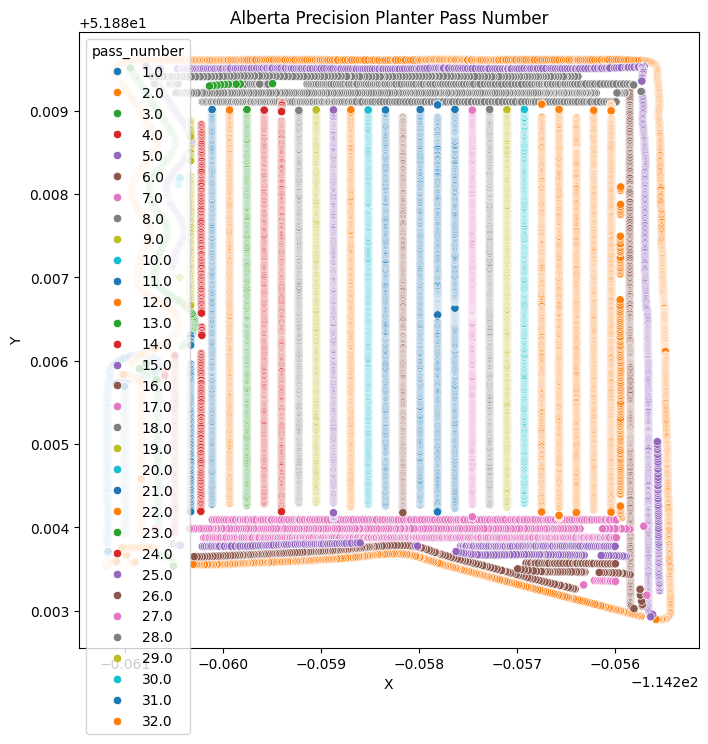

In [201]:
#Plot the map according to pass_num
plt.figure(figsize=(8,8))
sns.scatterplot(x=alberta_pp["geometry"].x,y = alberta_pp["geometry"].y,hue=alberta_pp["pass_number"],palette = 'tab10')
plt.xlabel("X")
plt.ylabel("Y")
plt.title("Alberta Precision Planter Pass Number")
plt.show()


In [202]:
#Manitoba pass number
manitoba_eds = create_pass_number(manitoba_eds)
manitoba_home = create_pass_number(manitoba_home)

In [203]:
manitoba_home.head()

,geometry,date,CRS,swath_width,yield,moisture,speed,duration,pass_number,distance
0,POINT (-97.43218 50.04622),2024-10-06,EPSG:4326,30.0,0.0,5.712105,1.308278,NaN,1.0,0.000000
1,POINT (-97.43218 50.04622),2024-10-06,EPSG:4326,30.0,0.0,5.720000,0.536781,1.0,1.0,0.775422
2,POINT (-97.43218 50.04621),2024-10-06,EPSG:4326,30.0,0.0,5.720000,0.701289,1.0,1.0,1.028572
3,POINT (-97.43218 50.04621),2024-10-06,EPSG:4326,30.0,0.0,5.720000,0.782889,1.0,1.0,1.162218
4,POINT (-97.43218 50.04621),2024-10-06,EPSG:4326,30.0,0.0,5.720000,0.872188,1.0,1.0,1.270637


In [204]:
manitoba_home["pass_number"].unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., 26.,
       27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38., 39.,
       40., 41., 42., 43., 44., 45., 46., 47., 48., 49., 50., 51., 52.,
       53., 54., 55., 56., 57., 58., 59., 60., 61., 62., 63., 64., 65.,
       66., 67., 68., 69., 70., 71., 72., 73., 74., 75., 76., 77.])

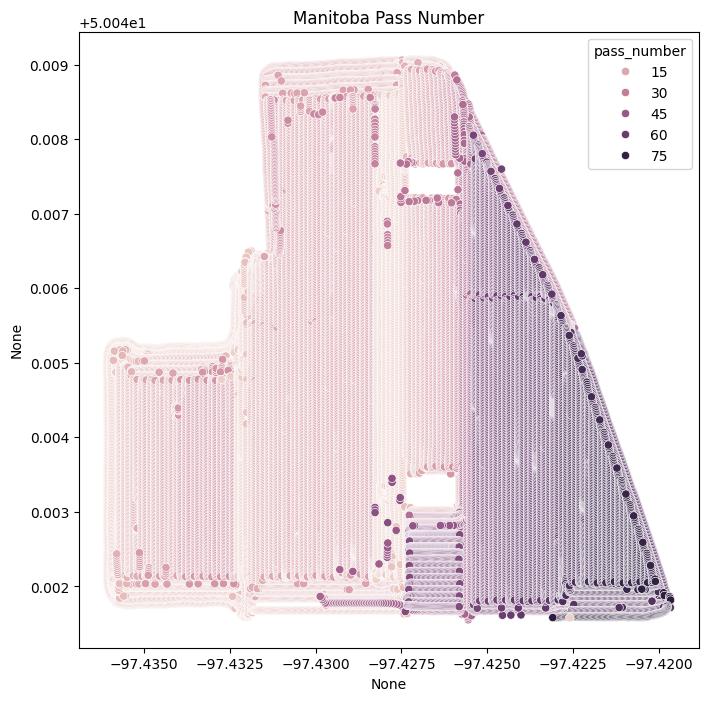

In [205]:
#Plot the map according to pass_num
plt.figure(figsize=(8,8))
sns.scatterplot(x=manitoba_home["geometry"].x,y = manitoba_home["geometry"].y,
                hue=manitoba_home["pass_number"]
                )

plt.title("Manitoba Pass Number")
plt.show()

In [206]:
#Southern ontario pass_number
southern_ontario = create_pass_number(southern_ontario)

In [207]:
southern_ontario.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance
0,POINT (-81.88705 42.73387),EPSG:4326,2024-10-21,30.0,29.8725,4.4,1.1483,1.000,1.0,0.000000
1,POINT (-81.88704 42.73388),EPSG:4326,2024-10-21,30.0,30.3968,4.4,1.1292,1.000,1.0,1.709889
2,POINT (-81.88704 42.73388),EPSG:4326,2024-10-21,30.0,26.4623,4.4,1.1514,1.000,1.0,1.838145
3,POINT (-81.88704 42.73389),EPSG:4326,2024-10-21,30.0,23.3760,4.4,1.4270,1.000,1.0,2.071028
4,POINT (-81.88704 42.73389),EPSG:4326,2024-10-21,30.0,5.7141,4.4,1.2944,1.001,1.0,1.632382


In [208]:
southern_ontario["pass_number"].unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., 26.,
       27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38., 39.,
       40., 41.])

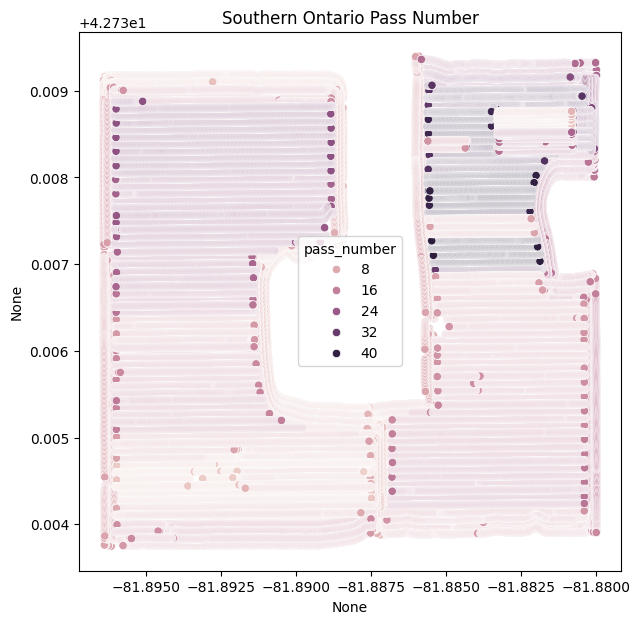

In [210]:
plt.figure(figsize=(7,7))
sns.scatterplot(x=southern_ontario["geometry"].x,y = southern_ontario["geometry"].y,
                hue=southern_ontario["pass_number"]
                )
plt.title("Southern Ontario Pass Number")
plt.show()

## Filtering

### Alberta

#### Alberta Precision Planter

##### Fill and finish Mode errors

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


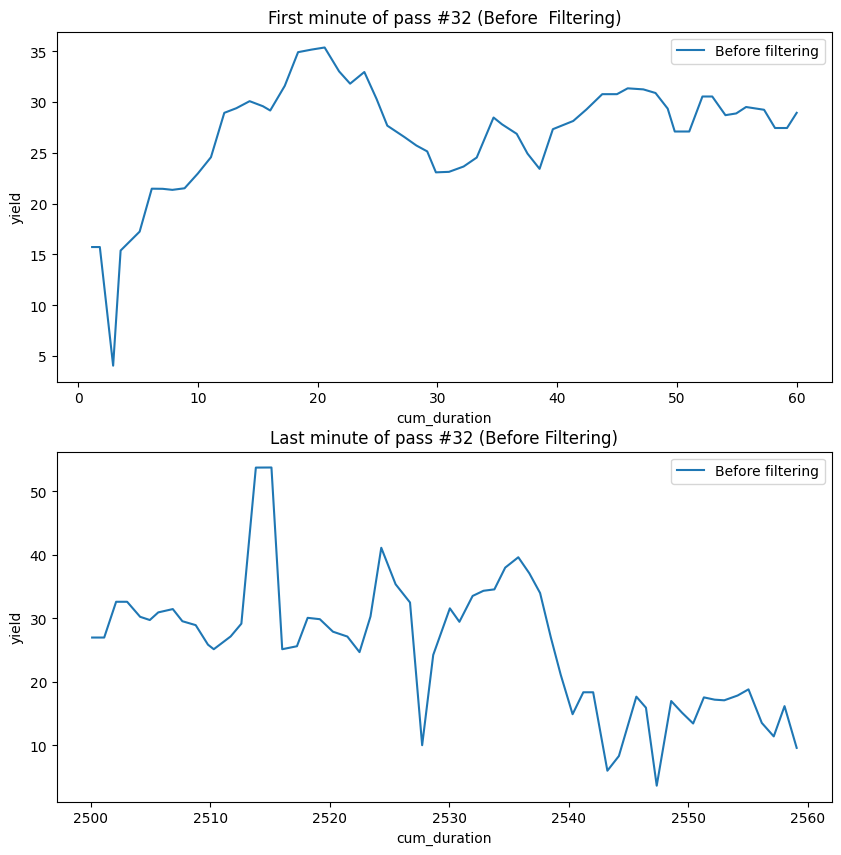

In [212]:
alb_pp_flagged, alb_pp_filtered = apply_fill_and_finish_filter(alberta_pp,plot_=True, plot_pass_num= 32)

In [213]:
alb_pp_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,cum_duration,fill_finish
0,POINT (-114.26117 51.88365),EPSG:4326,2024-09-26,37.5,17.4152,3.3,1.6001,0.917,1.0,0.000000,0.917,True
1,POINT (-114.26117 51.88365),EPSG:4326,2024-09-26,37.5,19.5229,3.3,1.6171,1.092,1.0,2.593381,2.009,True
2,POINT (-114.26117 51.88366),EPSG:4326,2024-09-26,37.5,35.8282,3.3,1.5988,1.213,1.0,2.848143,3.222,True
3,POINT (-114.26117 51.88367),EPSG:4326,2024-09-26,37.5,41.2722,3.3,1.5599,1.020,1.0,2.336713,4.242,True
4,POINT (-114.26117 51.88368),EPSG:4326,2024-09-26,37.5,34.1076,3.3,1.6832,1.211,1.0,2.993439,5.453,True


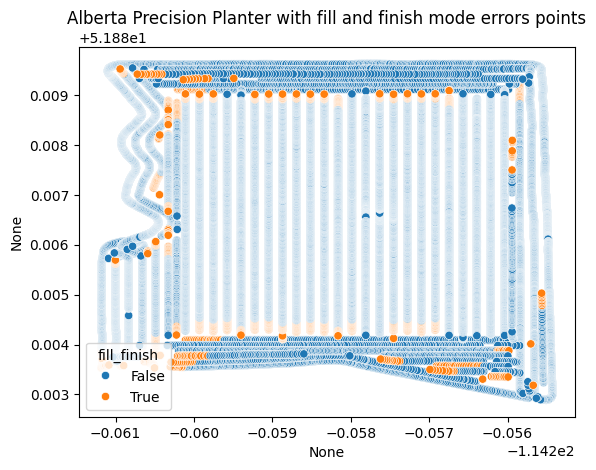

In [214]:
sns.scatterplot(x=alb_pp_flagged["geometry"].x,y = alb_pp_flagged["geometry"].y, hue = alb_pp_flagged["fill_finish"])
plt.title("Alberta Precision Planter with fill and finish mode errors points")
plt.show()

##### Short segment

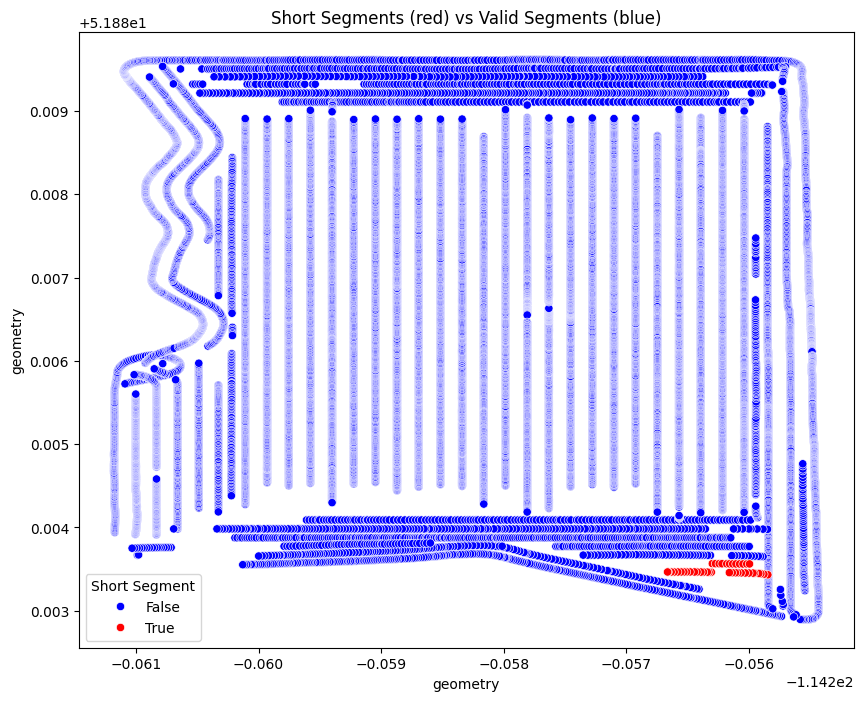

In [215]:
alb_pp_flagged, alb_pp_filtered = apply_short_segment_filter(alb_pp_filtered,length=355,plot_=True)

In [216]:
alb_pp_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,short_segment,cum_distance
33,POINT (-114.26099 51.88367),EPSG:4326,2024-09-26,7.5,29.9840,4.4254,1.2053,1.418,2.0,2.515269,False,2.515269
34,POINT (-114.26098 51.88367),EPSG:4326,2024-09-26,15.0,18.6042,4.6000,1.4746,1.097,2.0,2.380920,False,4.896189
65,POINT (-114.26117 51.88394),EPSG:4326,2024-09-27,37.5,41.9014,4.3000,2.9393,0.998,1.0,4.308042,False,4.308042
66,POINT (-114.26117 51.88395),EPSG:4326,2024-09-27,37.5,42.2613,4.3000,3.1682,0.918,1.0,4.271244,False,8.579286
67,POINT (-114.26117 51.88396),EPSG:4326,2024-09-27,37.5,38.3001,4.3000,2.9343,0.898,1.0,3.869721,False,12.449007


##### Moisture filter

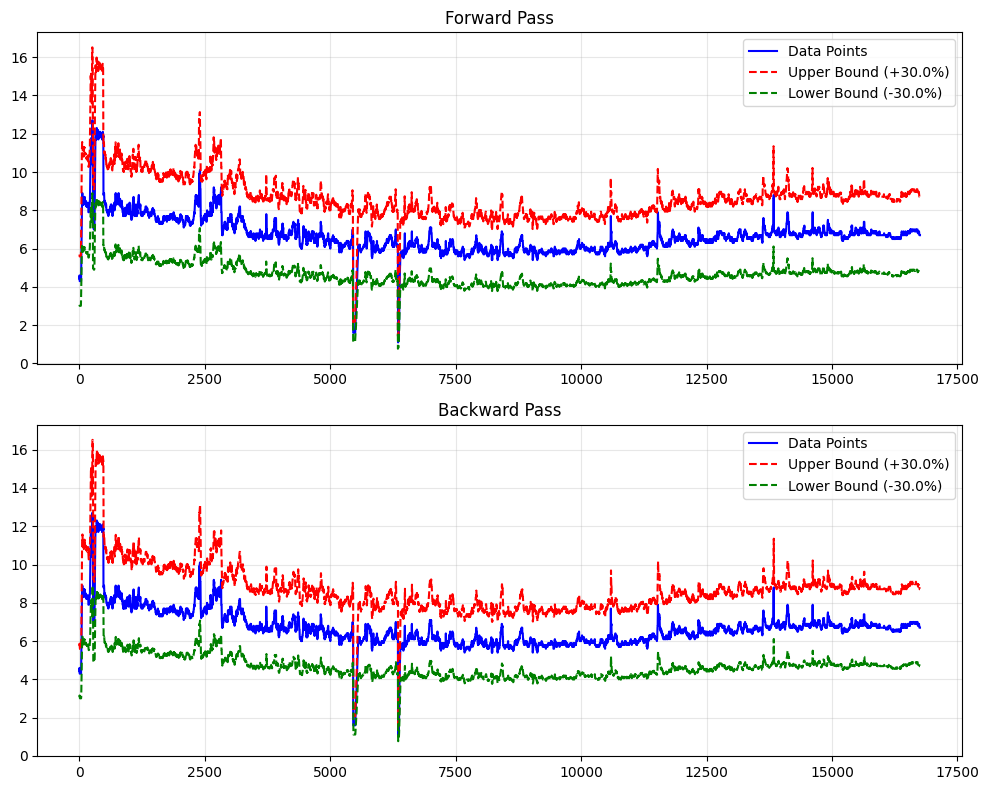

In [217]:
alb_pp_flagged, alb_pp_filtered = apply_forward_backward_filter(alb_pp_filtered,column = "moisture", plot=True)

In [218]:
alb_pp_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,fwd_bwd_moisture_outlier
33,POINT (-114.26099 51.88367),EPSG:4326,2024-09-26,7.5,29.9840,4.4254,1.2053,1.418,2.0,2.515269,False
34,POINT (-114.26098 51.88367),EPSG:4326,2024-09-26,15.0,18.6042,4.6000,1.4746,1.097,2.0,2.380920,False
65,POINT (-114.26117 51.88394),EPSG:4326,2024-09-27,37.5,41.9014,4.3000,2.9393,0.998,1.0,4.308042,False
66,POINT (-114.26117 51.88395),EPSG:4326,2024-09-27,37.5,42.2613,4.3000,3.1682,0.918,1.0,4.271244,False
67,POINT (-114.26117 51.88396),EPSG:4326,2024-09-27,37.5,38.3001,4.3000,2.9343,0.898,1.0,3.869721,False


<Axes: xlabel='None', ylabel='None'>

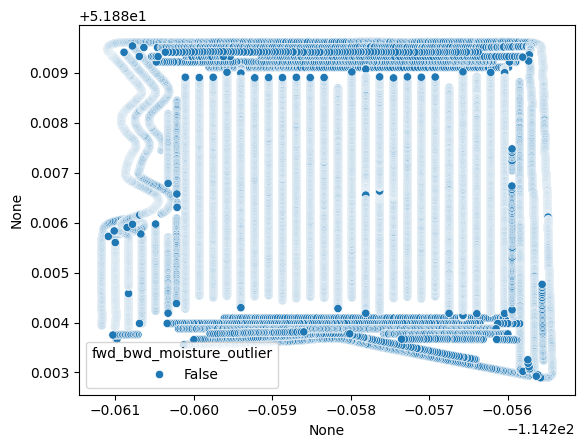

In [219]:
sns.scatterplot(x=alb_pp_flagged["geometry"].x,y = alb_pp_flagged["geometry"].y, hue = alb_pp_flagged["fwd_bwd_moisture_outlier"])

##### Speed filter

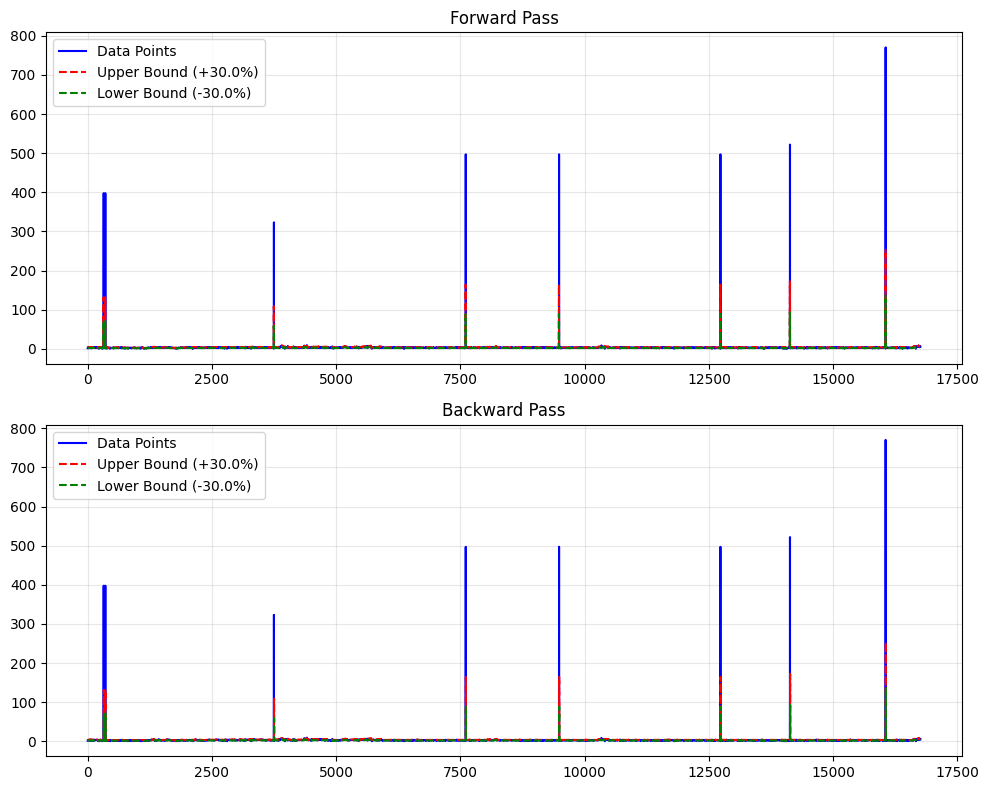

In [220]:
alb_pp_flagged, alb_pp_filtered = apply_forward_backward_filter(alb_pp_filtered,column = "speed", plot=True)

In [221]:
alb_pp_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,fwd_bwd_speed_outlier
33,POINT (-114.26099 51.88367),EPSG:4326,2024-09-26,7.5,29.9840,4.4254,1.2053,1.418,2.0,2.515269,False
34,POINT (-114.26098 51.88367),EPSG:4326,2024-09-26,15.0,18.6042,4.6000,1.4746,1.097,2.0,2.380920,False
65,POINT (-114.26117 51.88394),EPSG:4326,2024-09-27,37.5,41.9014,4.3000,2.9393,0.998,1.0,4.308042,False
66,POINT (-114.26117 51.88395),EPSG:4326,2024-09-27,37.5,42.2613,4.3000,3.1682,0.918,1.0,4.271244,False
67,POINT (-114.26117 51.88396),EPSG:4326,2024-09-27,37.5,38.3001,4.3000,2.9343,0.898,1.0,3.869721,False


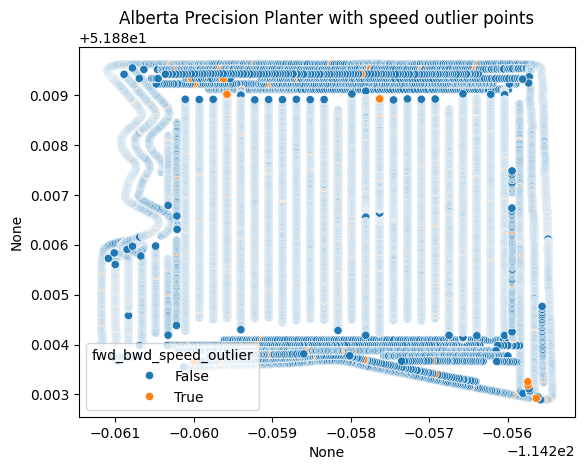

In [222]:
sns.scatterplot(x=alb_pp_flagged["geometry"].x,y = alb_pp_flagged["geometry"].y, hue = alb_pp_flagged["fwd_bwd_speed_outlier"])
plt.title("Alberta Precision Planter with speed outlier points")
plt.show()

##### Overlapping points

/var/folders/sr/72fkw_hj777b6plyb3n4ym8w0000gn/T/ipykernel_26470/943565606.py:320: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
/var/folders/sr/72fkw_hj777b6plyb3n4ym8w0000gn/T/ipykernel_26470/943565606.py:320: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


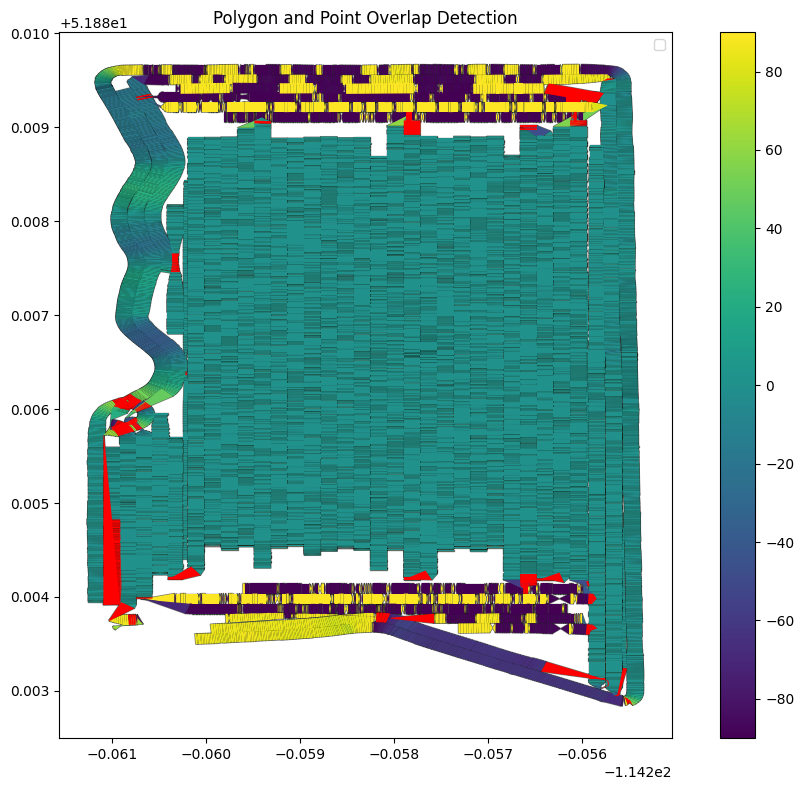

In [227]:
alb_pp_flagged, alb_pp_filtered = apply_overlapping_filter(alb_pp_filtered,plot= True)

In [228]:
alb_pp_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,next_point,angle,next_swath_width,polygon,overlapped
65,POINT (-114.26117 51.88394),EPSG:4326,2024-09-27,37.5,41.9014,4.3,2.9393,0.998,1.0,4.308042,POINT (-114.2611728 51.8839525),0.606080,37.5,"POLYGON ((-114.26126 51.88394, -114.26109 51.8...",False
66,POINT (-114.26117 51.88395),EPSG:4326,2024-09-27,37.5,42.2613,4.3,3.1682,0.918,1.0,4.271244,POINT (-114.2611726 51.883963099999995),0.668969,37.5,"POLYGON ((-114.26126 51.88395, -114.26109 51.8...",False
67,POINT (-114.26117 51.88396),EPSG:4326,2024-09-27,37.5,38.3001,4.3,2.9343,0.898,1.0,3.869721,POINT (-114.26117239999999 51.8839761),0.545475,37.5,"POLYGON ((-114.26109 51.88396, -114.26126 51.8...",False
68,POINT (-114.26117 51.88398),EPSG:4326,2024-09-27,37.5,33.6483,4.3,2.9034,1.113,1.0,4.745776,POINT (-114.26117239999999 51.883986699999994),0.000000,37.5,"POLYGON ((-114.26109 51.88398, -114.26126 51.8...",False
69,POINT (-114.26117 51.88399),EPSG:4326,2024-09-27,37.5,39.2247,4.3,2.9179,0.903,1.0,3.869457,POINT (-114.26117219999999 51.8840009),0.499381,37.5,"POLYGON ((-114.26109 51.88399, -114.26126 51.8...",False


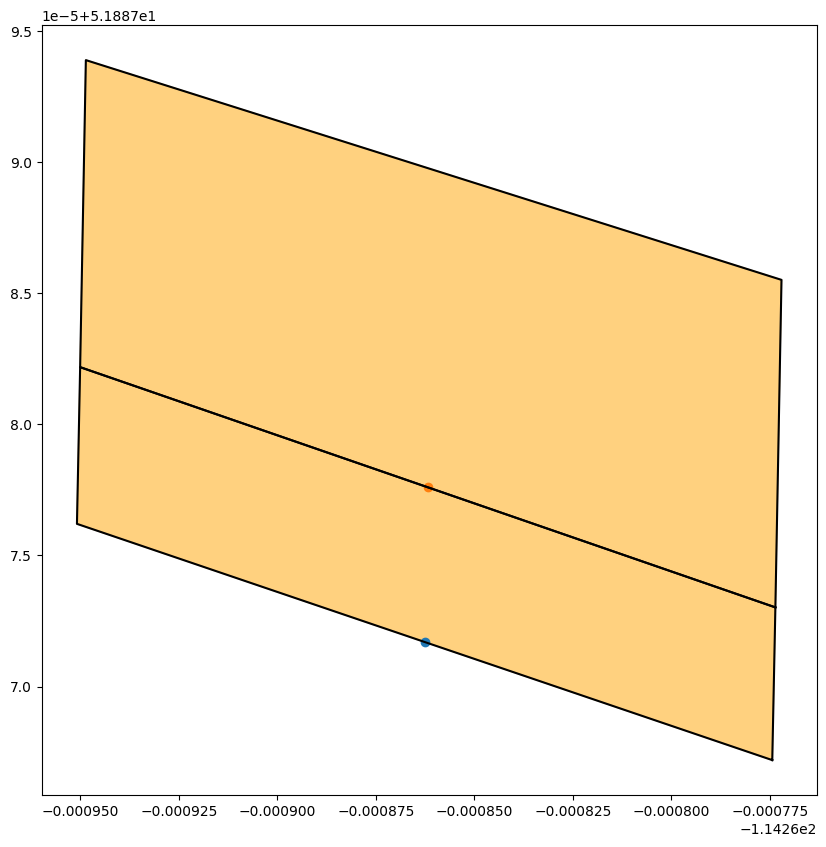

In [229]:
polygon = alb_pp_flagged.iloc[806]["polygon"]
point = alb_pp_flagged.iloc[806]["geometry"]

polygon2 = alb_pp_flagged.iloc[807]["polygon"]
point2 = alb_pp_flagged.iloc[807]["geometry"]

# Plot the polygon
fig, ax = plt.subplots(figsize=(10, 10))
x, y = polygon.exterior.xy
ax.fill(x, y, alpha=0.5, color='orange')
ax.plot(x, y, color='black')
ax.scatter(point.x,point.y)
x2, y2 = polygon2.exterior.xy
ax.fill(x2, y2, alpha=0.5, color='orange')
ax.plot(x2, y2, color='black')
ax.scatter(point2.x,point2.y)

# Show the plot
plt.show()

In [230]:
alb_pp_filtered["geometry"].dtype

##### Yield filter

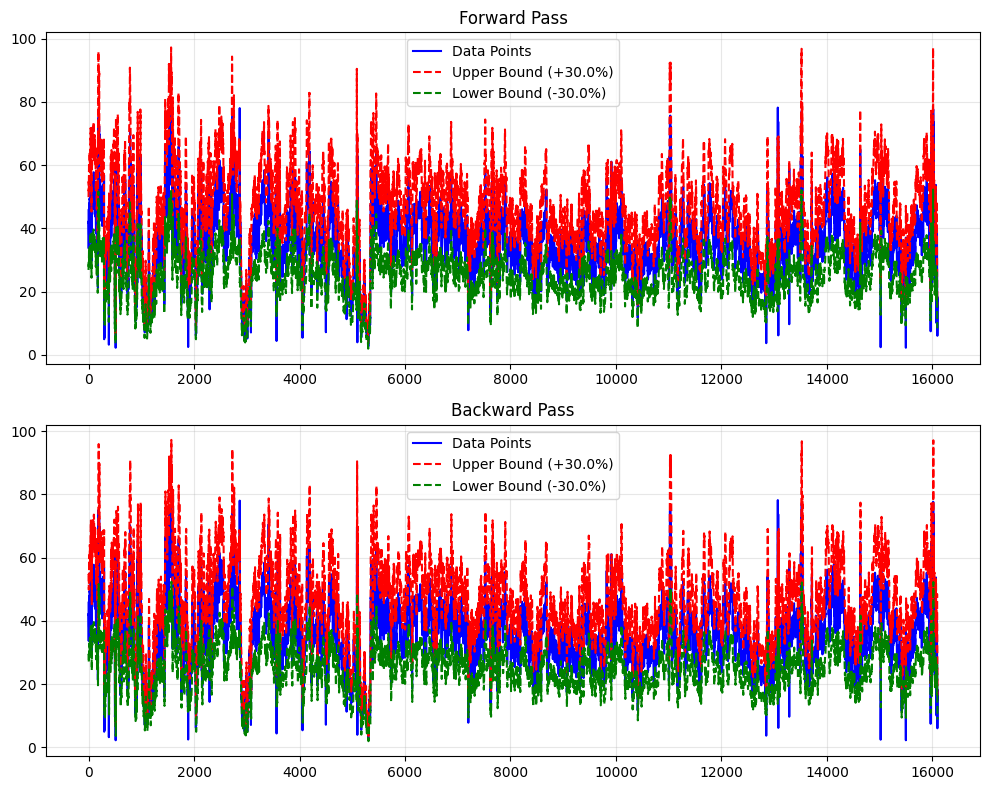

In [231]:
alb_pp_flagged, alb_pp_filtered = apply_forward_backward_filter(alb_pp_filtered,column = "yield", plot=True,)

In [232]:
alb_pp_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,angle,polygon,fwd_bwd_yield_outlier
65,POINT (-114.26117 51.88394),EPSG:4326,2024-09-27,37.5,41.9014,4.3,2.9393,0.998,1.0,4.308042,0.606080,"POLYGON ((-114.26126 51.88394, -114.26109 51.8...",False
66,POINT (-114.26117 51.88395),EPSG:4326,2024-09-27,37.5,42.2613,4.3,3.1682,0.918,1.0,4.271244,0.668969,"POLYGON ((-114.26126 51.88395, -114.26109 51.8...",False
67,POINT (-114.26117 51.88396),EPSG:4326,2024-09-27,37.5,38.3001,4.3,2.9343,0.898,1.0,3.869721,0.545475,"POLYGON ((-114.26109 51.88396, -114.26126 51.8...",False
68,POINT (-114.26117 51.88398),EPSG:4326,2024-09-27,37.5,33.6483,4.3,2.9034,1.113,1.0,4.745776,0.000000,"POLYGON ((-114.26109 51.88398, -114.26126 51.8...",False
69,POINT (-114.26117 51.88399),EPSG:4326,2024-09-27,37.5,39.2247,4.3,2.9179,0.903,1.0,3.869457,0.499381,"POLYGON ((-114.26109 51.88399, -114.26126 51.8...",False


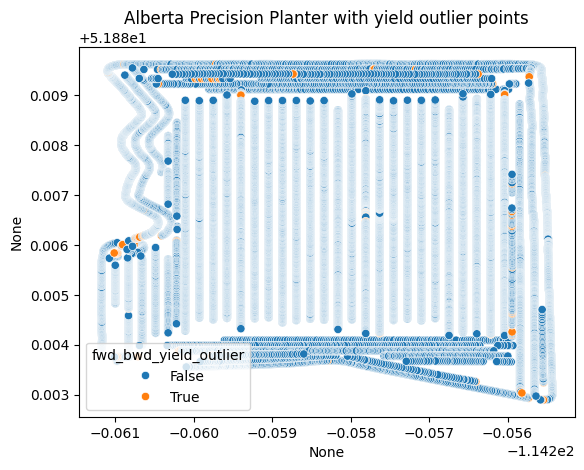

In [233]:
sns.scatterplot(x=alb_pp_flagged["geometry"].x,y = alb_pp_flagged["geometry"].y, hue = alb_pp_flagged["fwd_bwd_yield_outlier"])
plt.title("Alberta Precision Planter with yield outlier points")
plt.show()

##### Isolation forest

In [234]:
temp_flagged = alb_pp_flagged.copy()
temp_filtered = alb_pp_filtered.copy()

/var/folders/sr/72fkw_hj777b6plyb3n4ym8w0000gn/T/ipykernel_26470/1190648013.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  alb_pp_filtered.drop(columns=["isolation_forest_outlier"],inplace=True)


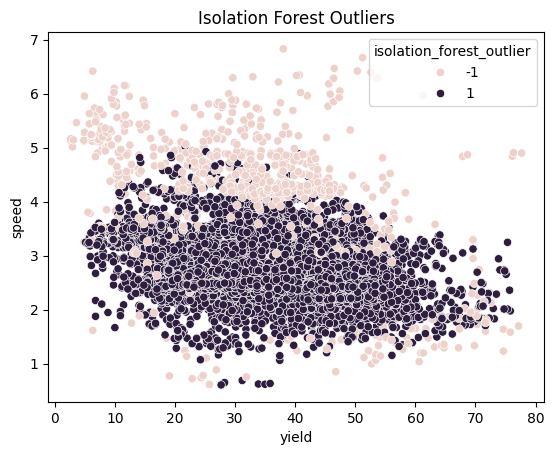

In [235]:
from sklearn.ensemble import IsolationForest

isolation_forest_model = IsolationForest(
    n_estimators=100,
    contamination=0.05,
    random_state=42,
    max_samples= "auto",

)
df_x = alb_pp_filtered[["yield","speed","swath_width","pass_number","distance"]]
isolation_forest_model.fit(df_x)
alb_pp_filtered["isolation_forest_outlier"] = isolation_forest_model.predict(df_x)
alb_pp_flagged = alb_pp_filtered.copy()
alb_pp_filtered = alb_pp_flagged[alb_pp_flagged["isolation_forest_outlier"] == 1]
alb_pp_filtered.drop(columns=["isolation_forest_outlier"],inplace=True)

#plot outliers of yield vs speed
sns.scatterplot(x = alb_pp_flagged["yield"], y = alb_pp_flagged["speed"],
                hue = alb_pp_flagged["isolation_forest_outlier"] )
plt.title("Isolation Forest Outliers")
plt.show()



##### Testing normal distribution

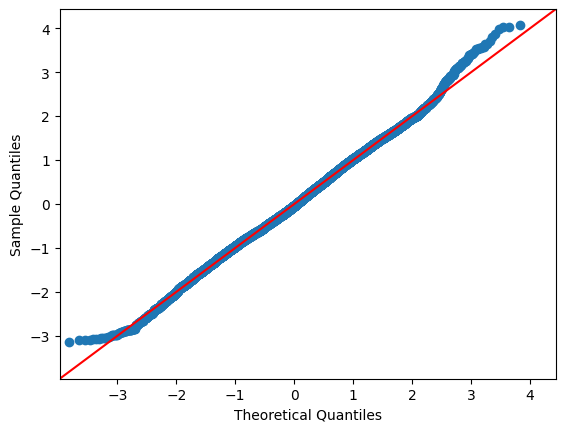

In [240]:
import statsmodels.api as sm

sm.qqplot(alb_pp_filtered['yield'], line='45',fit =True)
plt.show()

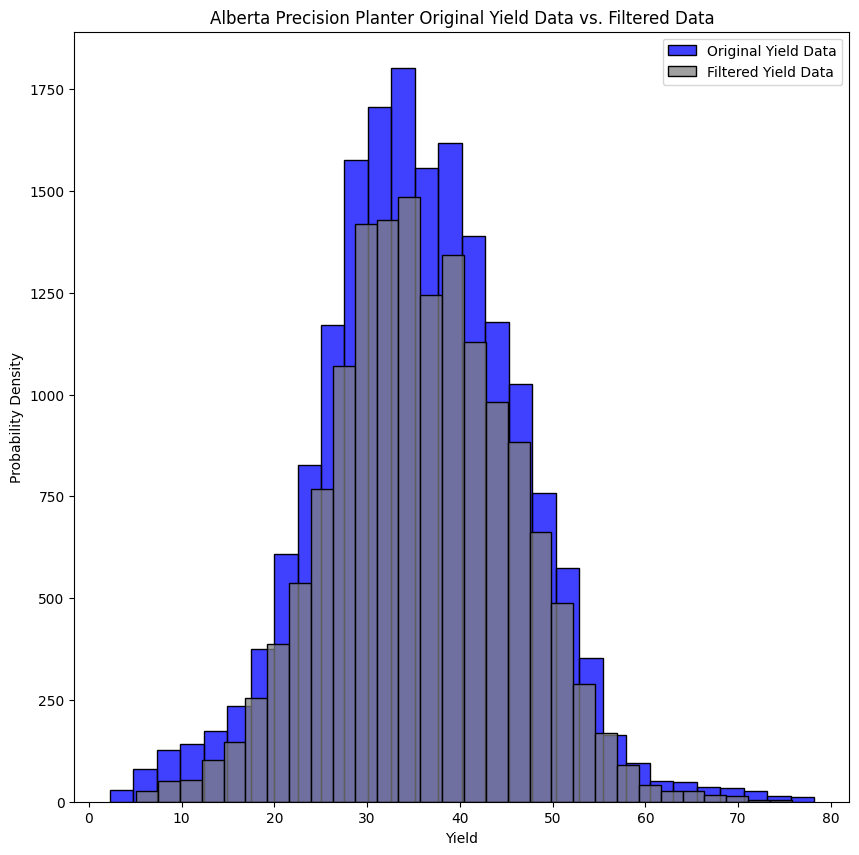

In [241]:
plt.figure(figsize=(10, 10))
# Plot the yield data as a histogram
sns.histplot(alberta_pp['yield'], bins=30,  label='Original Yield Data', color= "blue")
sns.histplot(alb_pp_filtered['yield'], bins=30, label='Filtered Yield Data',color = "gray")





# Add labels and title
plt.xlabel('Yield')
plt.ylabel('Probability Density')
plt.title('Alberta Precision Planter Original Yield Data vs. Filtered Data')



# Add a legend
plt.legend()


# Display the plot
plt.show()

##### Z-Score filter

In [242]:
alb_pp_flagged, alb_pp_filtered = z_score_filter(alb_pp_filtered,column = "yield", threshold=3)

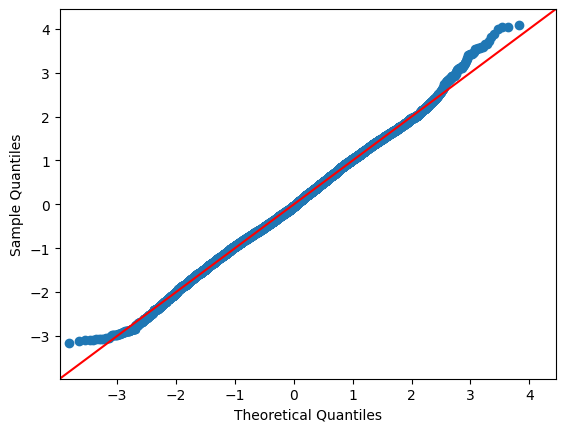

In [243]:
sm.qqplot(alb_pp_filtered['yield'], line='45',fit =True)
plt.show()

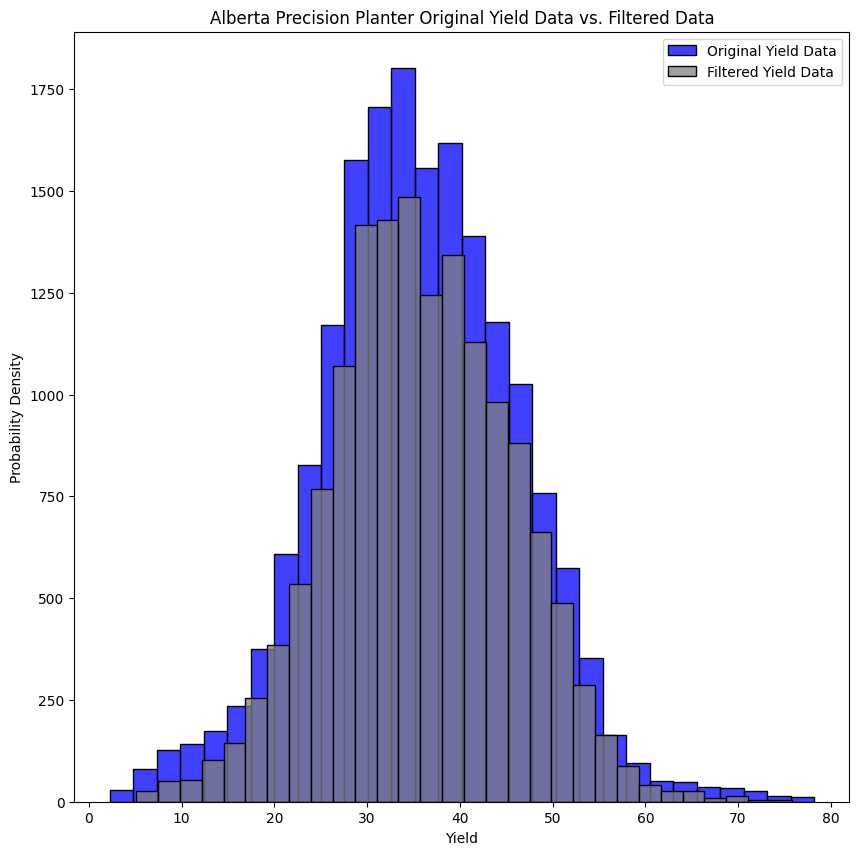

In [244]:
plt.figure(figsize=(10, 10))
# Plot the yield data as a histogram
sns.histplot(alberta_pp['yield'], bins=30,  label='Original Yield Data', color= "blue")
sns.histplot(alb_pp_filtered['yield'], bins=30, label='Filtered Yield Data',color = "gray")





# Add labels and title
plt.xlabel('Yield')
plt.ylabel('Probability Density')
plt.title('Alberta Precision Planter Original Yield Data vs. Filtered Data')



# Add a legend
plt.legend()


# Display the plot
plt.show()

##### Size of data

We have 15138 data, no need for kriging

In [245]:
len(alb_pp_filtered)

15115

##### Data exportation

In [246]:
#Data exportation

alberta_pp_to_export = alb_pp_filtered[["geometry","yield","CRS"]]
alberta_pp_to_export.to_csv('data/filtered_data/alberta_pp.csv')

#### Alberta Steckler

##### Fill and finish Mode errors

In [247]:
alb_st_flagged, alb_st_filtered = apply_fill_and_finish_filter(alberta_st,plot_=False)

In [248]:
alb_st_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,cum_duration,fill_finish
0,POINT (-114.26126 51.65883),EPSG:4326,2024-09-24,6.9816,105.8895,0.0,2.2983,0.196,1.0,0.000000,0.196,True
1,POINT (-114.26126 51.65884),EPSG:4326,2024-09-24,9.9738,76.0511,0.0,2.3072,0.204,1.0,0.697087,0.4,True
2,POINT (-114.26126 51.65884),EPSG:4326,2024-09-24,9.9738,74.2081,0.0,2.3296,0.200,1.0,0.695483,0.6,True
3,POINT (-114.26126 51.65884),EPSG:4326,2024-09-24,11.4698,98.1339,0.0,2.3318,0.196,1.0,0.685332,0.796,True
4,POINT (-114.26126 51.65884),EPSG:4326,2024-09-24,12.9659,88.6753,0.0,2.3519,0.205,1.0,0.701420,1.001,True


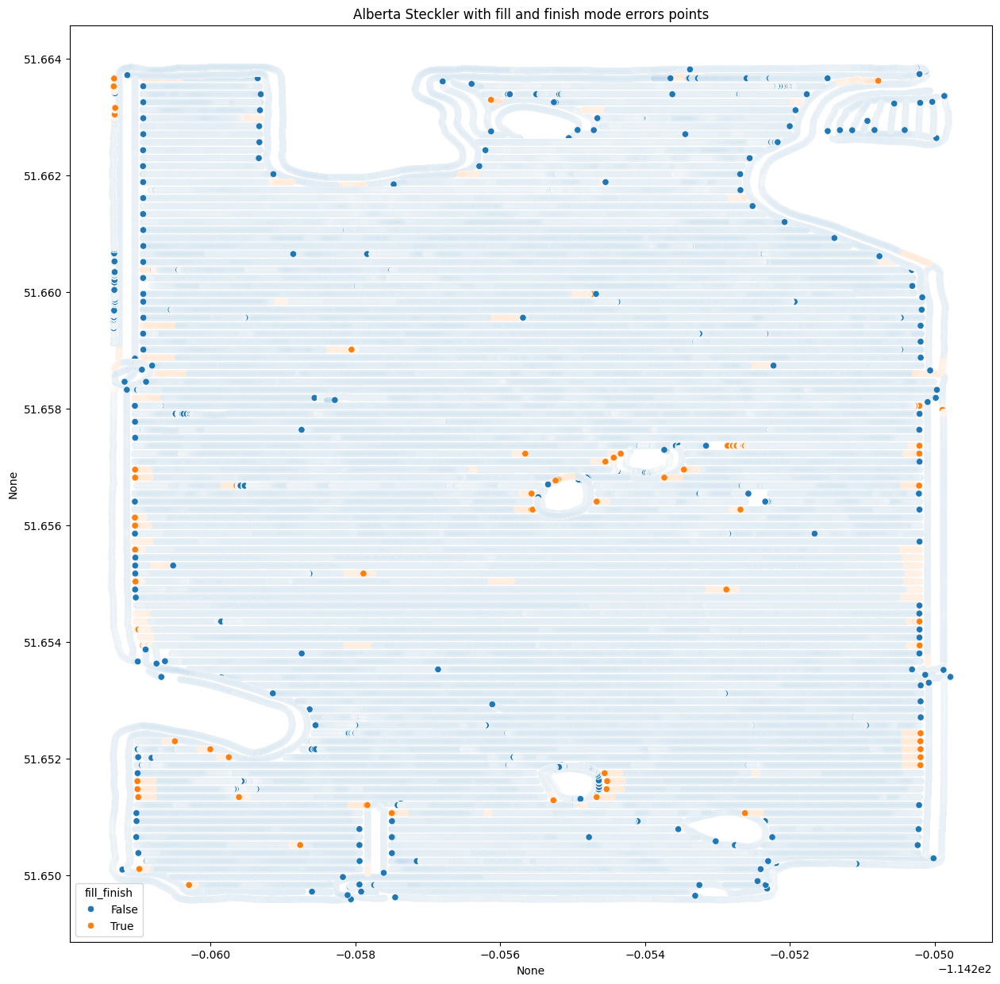

In [249]:
plt.figure(figsize=(15,15))
sns.scatterplot(x=alb_st_flagged["geometry"].x,y = alb_st_flagged["geometry"].y, hue = alb_st_flagged["fill_finish"])
plt.title("Alberta Steckler with fill and finish mode errors points")
plt.show()

##### Short segment

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


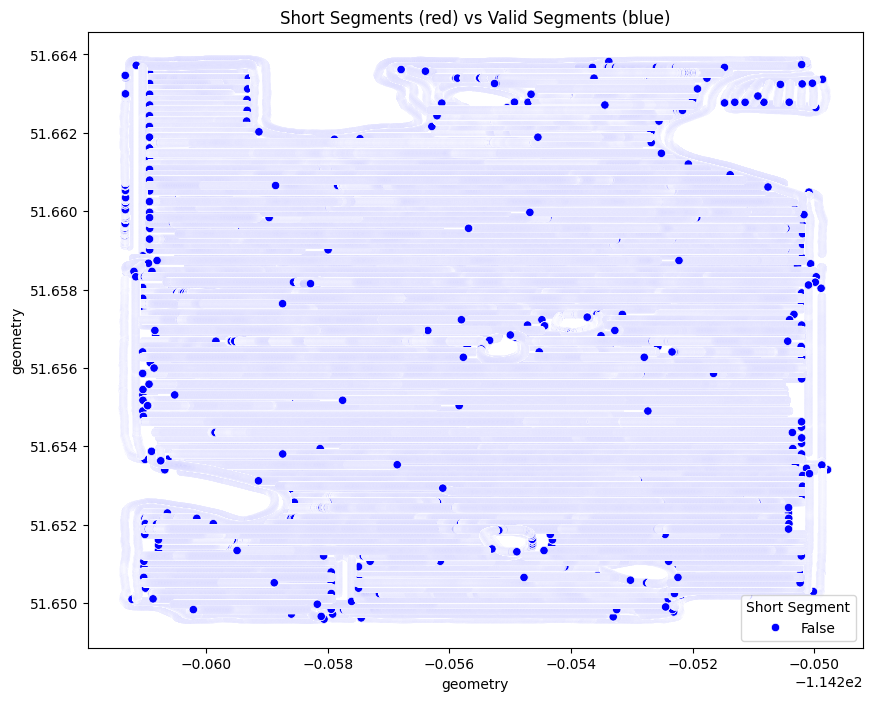

In [250]:
alb_st_flagged, alb_st_filtered = apply_short_segment_filter(alb_st_filtered,length=355,plot_=True)

In [251]:
alb_st_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,short_segment,cum_distance
120,POINT (-114.26126 51.65911),EPSG:4326,2024-09-24,50.0,79.2387,7.8,3.1927,0.200,1.0,0.933321,False,0.933321
121,POINT (-114.26126 51.65911),EPSG:4326,2024-09-24,50.0,78.2917,7.8,3.1860,0.199,1.0,0.940515,False,1.873836
122,POINT (-114.26126 51.65911),EPSG:4326,2024-09-24,50.0,79.9160,7.8,3.1793,0.201,1.0,0.931281,False,2.805116
123,POINT (-114.26126 51.65912),EPSG:4326,2024-09-24,50.0,79.0430,7.8,3.1838,0.200,1.0,0.937762,False,3.742878
124,POINT (-114.26126 51.65912),EPSG:4326,2024-09-24,50.0,79.6010,7.9,3.1793,0.200,1.0,0.930660,False,4.673539


##### Moisture filter

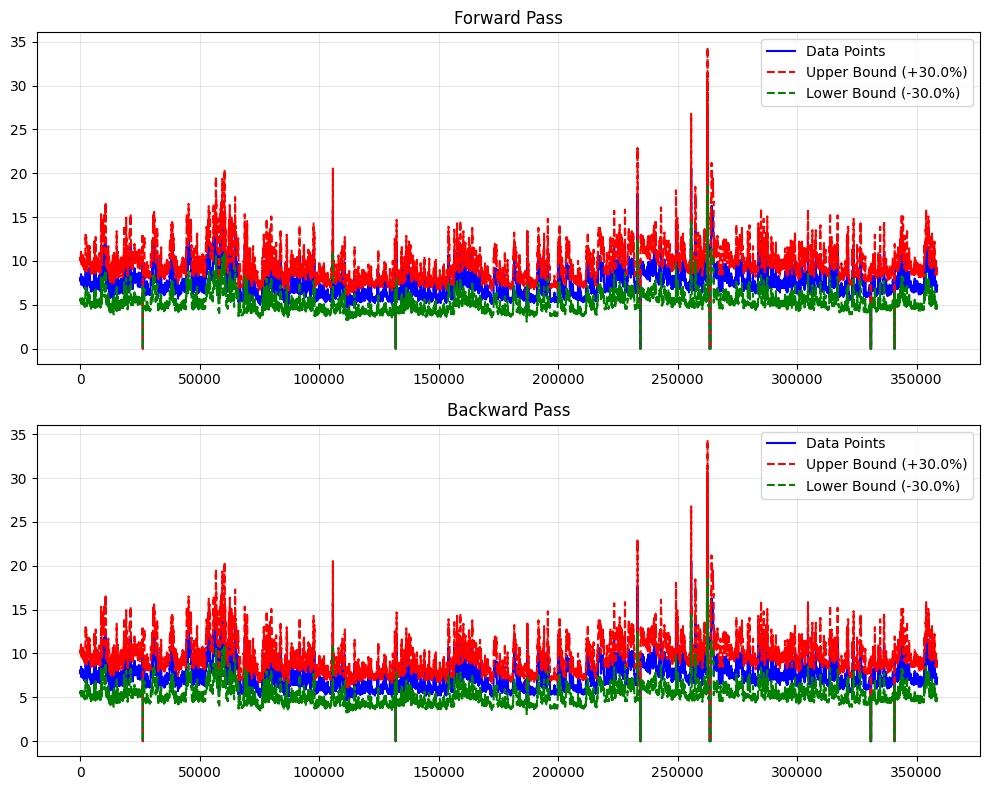

In [252]:
alb_st_flagged, alb_st_filtered = apply_forward_backward_filter(alb_st_filtered,column = "moisture", plot=True)

In [253]:
alb_st_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,fwd_bwd_moisture_outlier
120,POINT (-114.26126 51.65911),EPSG:4326,2024-09-24,50.0,79.2387,7.8,3.1927,0.200,1.0,0.933321,False
121,POINT (-114.26126 51.65911),EPSG:4326,2024-09-24,50.0,78.2917,7.8,3.1860,0.199,1.0,0.940515,False
122,POINT (-114.26126 51.65911),EPSG:4326,2024-09-24,50.0,79.9160,7.8,3.1793,0.201,1.0,0.931281,False
123,POINT (-114.26126 51.65912),EPSG:4326,2024-09-24,50.0,79.0430,7.8,3.1838,0.200,1.0,0.937762,False
124,POINT (-114.26126 51.65912),EPSG:4326,2024-09-24,50.0,79.6010,7.9,3.1793,0.200,1.0,0.930660,False


<Axes: xlabel='None', ylabel='None'>

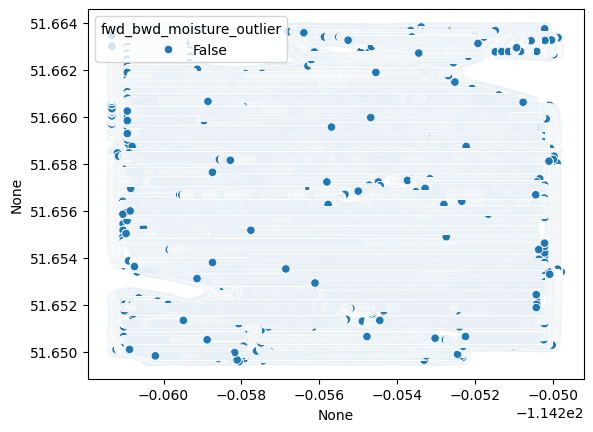

In [254]:
sns.scatterplot(x=alb_st_flagged["geometry"].x,y = alb_st_flagged["geometry"].y, hue = alb_st_flagged["fwd_bwd_moisture_outlier"])

##### Speed filter

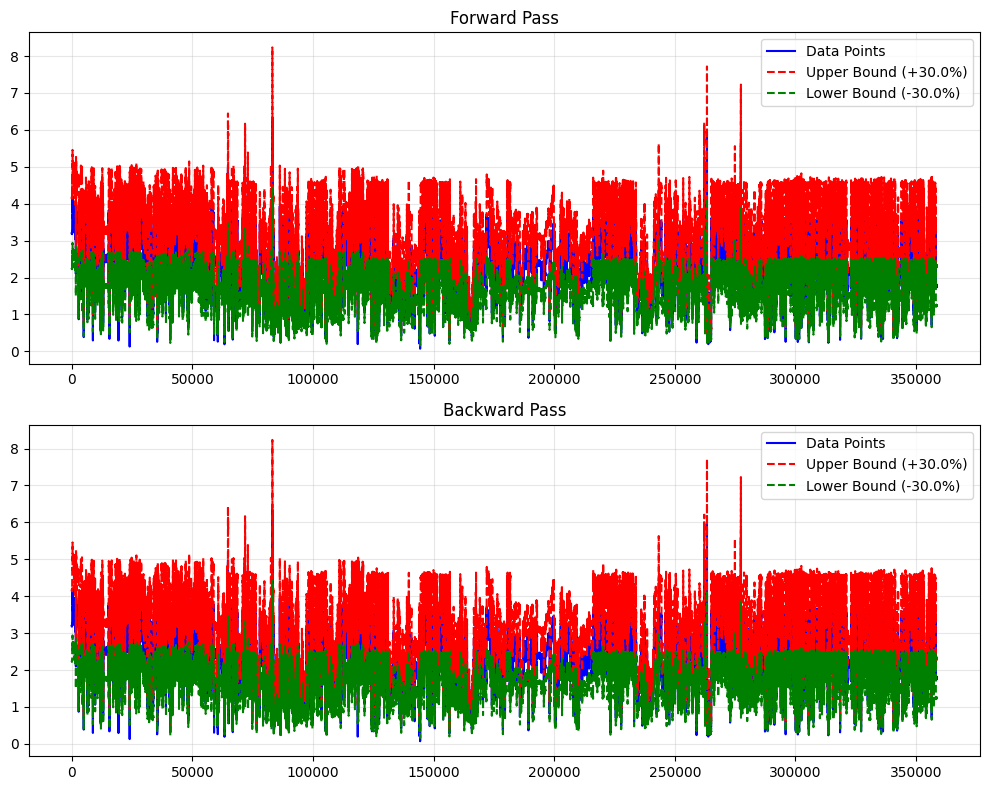

In [255]:
alb_st_flagged, alb_st_filtered = apply_forward_backward_filter(alb_st_filtered,column = "speed", plot=True)

In [256]:
alb_st_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,fwd_bwd_speed_outlier
120,POINT (-114.26126 51.65911),EPSG:4326,2024-09-24,50.0,79.2387,7.8,3.1927,0.200,1.0,0.933321,False
121,POINT (-114.26126 51.65911),EPSG:4326,2024-09-24,50.0,78.2917,7.8,3.1860,0.199,1.0,0.940515,False
122,POINT (-114.26126 51.65911),EPSG:4326,2024-09-24,50.0,79.9160,7.8,3.1793,0.201,1.0,0.931281,False
123,POINT (-114.26126 51.65912),EPSG:4326,2024-09-24,50.0,79.0430,7.8,3.1838,0.200,1.0,0.937762,False
124,POINT (-114.26126 51.65912),EPSG:4326,2024-09-24,50.0,79.6010,7.9,3.1793,0.200,1.0,0.930660,False


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


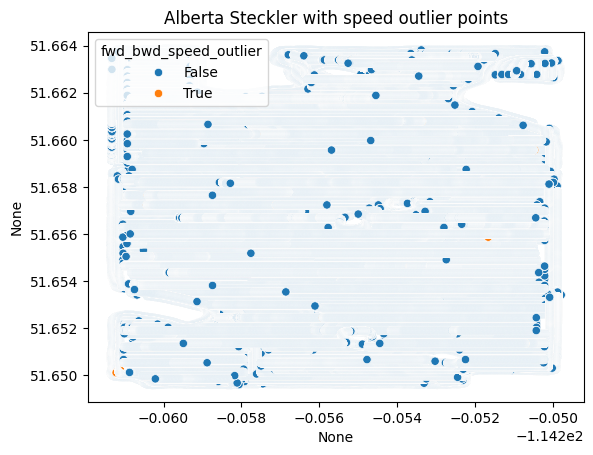

In [257]:
sns.scatterplot(x=alb_st_flagged["geometry"].x,y = alb_st_flagged["geometry"].y, hue = alb_st_flagged["fwd_bwd_speed_outlier"])
plt.title("Alberta Steckler with speed outlier points")
plt.show()

##### Overlapping points

In [258]:
alb_st_flagged, alb_st_filtered = apply_overlapping_filter(alb_st_filtered)

In [259]:
alb_st_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,next_point,angle,next_swath_width,polygon,overlapped
120,POINT (-114.26126 51.65911),EPSG:4326,2024-09-24,50.0,79.2387,7.8,3.1927,0.200,1.0,0.933321,POINT (-114.2612646187666 51.65911236551442),0.352678,50.0,"POLYGON ((-114.26137 51.65911, -114.26115 51.6...",True
121,POINT (-114.26126 51.65911),EPSG:4326,2024-09-24,50.0,78.2917,7.8,3.1860,0.199,1.0,0.940515,POINT (-114.26126467626662 51.65911491651418),-0.803167,50.0,"POLYGON ((-114.26137 51.65911, -114.26115 51.6...",True
122,POINT (-114.26126 51.65911),EPSG:4326,2024-09-24,50.0,79.9160,7.8,3.1793,0.201,1.0,0.931281,POINT (-114.26126475826662 51.659117485014164),-1.137506,50.0,"POLYGON ((-114.26115 51.65912, -114.26137 51.6...",True
123,POINT (-114.26126 51.65912),EPSG:4326,2024-09-24,50.0,79.0430,7.8,3.1838,0.200,1.0,0.937762,POINT (-114.2612647842666 51.659120034514416),-0.363403,50.0,"POLYGON ((-114.26115 51.65912, -114.26137 51.6...",True
124,POINT (-114.26126 51.65912),EPSG:4326,2024-09-24,50.0,79.6010,7.9,3.1793,0.200,1.0,0.930660,POINT (-114.26126481376657 51.65912263201467),-0.404702,50.0,"POLYGON ((-114.26115 51.65912, -114.26137 51.6...",False


<Axes: xlabel='None', ylabel='None'>

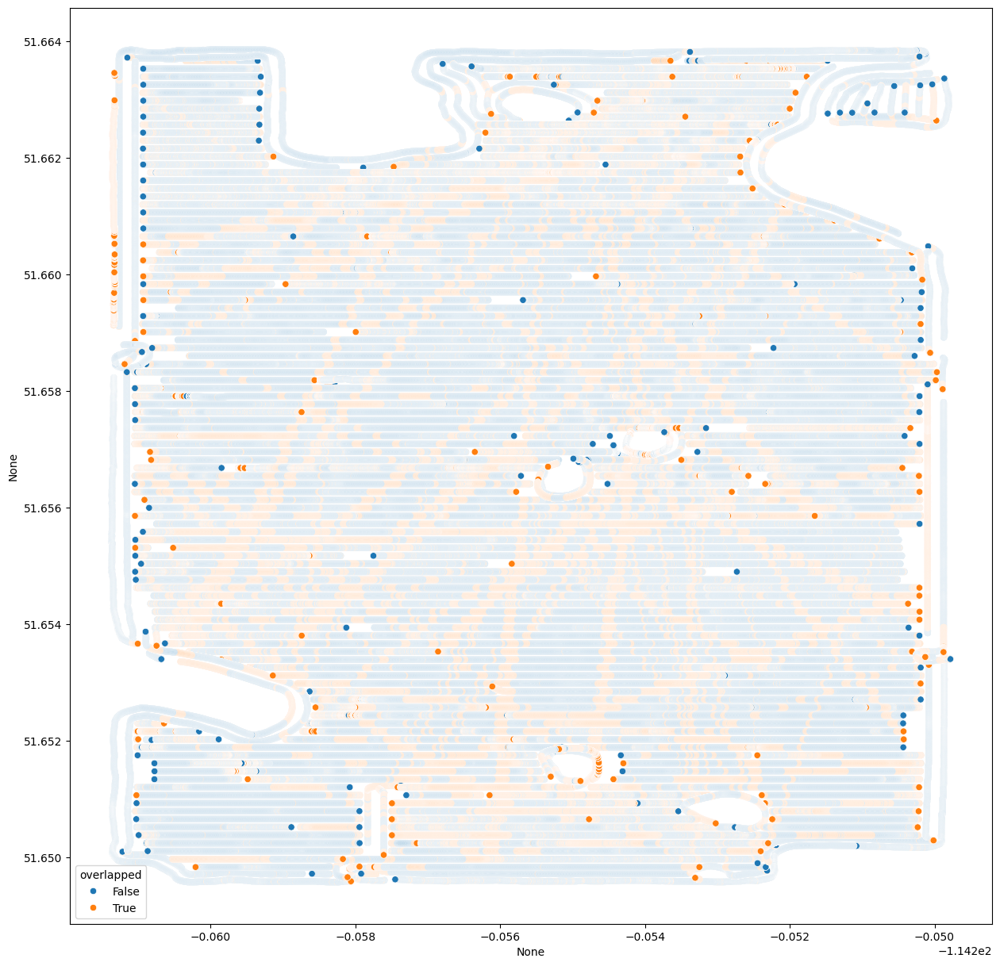

In [260]:
plt.figure(figsize=(15,15))
sns.scatterplot(x=alb_st_flagged["geometry"].x,y = alb_st_flagged["geometry"].y, hue = alb_st_flagged["overlapped"])

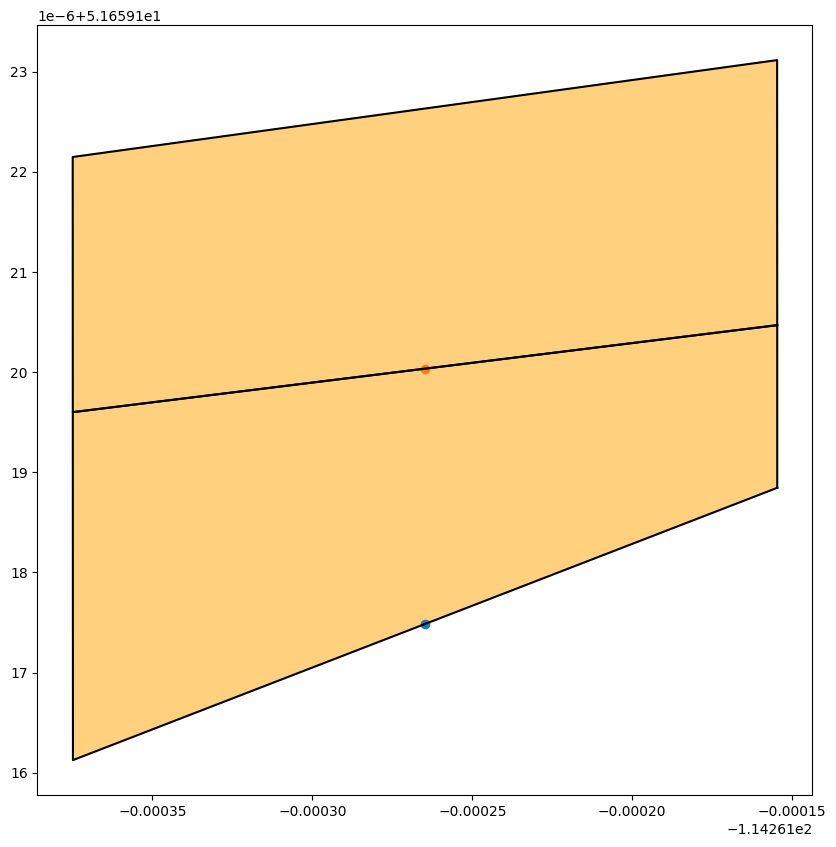

In [261]:
polygon = alb_st_flagged.iloc[3]["polygon"]
point = alb_st_flagged.iloc[3]["geometry"]

polygon2 = alb_st_flagged.iloc[4]["polygon"]
point2 = alb_st_flagged.iloc[4]["geometry"]

# Plot the polygon
fig, ax = plt.subplots(figsize=(10, 10))
x, y = polygon.exterior.xy
ax.fill(x, y, alpha=0.5, color='orange')
ax.plot(x, y, color='black')
ax.scatter(point.x,point.y)
x2, y2 = polygon2.exterior.xy
ax.fill(x2, y2, alpha=0.5, color='orange')
ax.plot(x2, y2, color='black')
ax.scatter(point2.x,point2.y)

# Show the plot
plt.show()

##### Yield filter

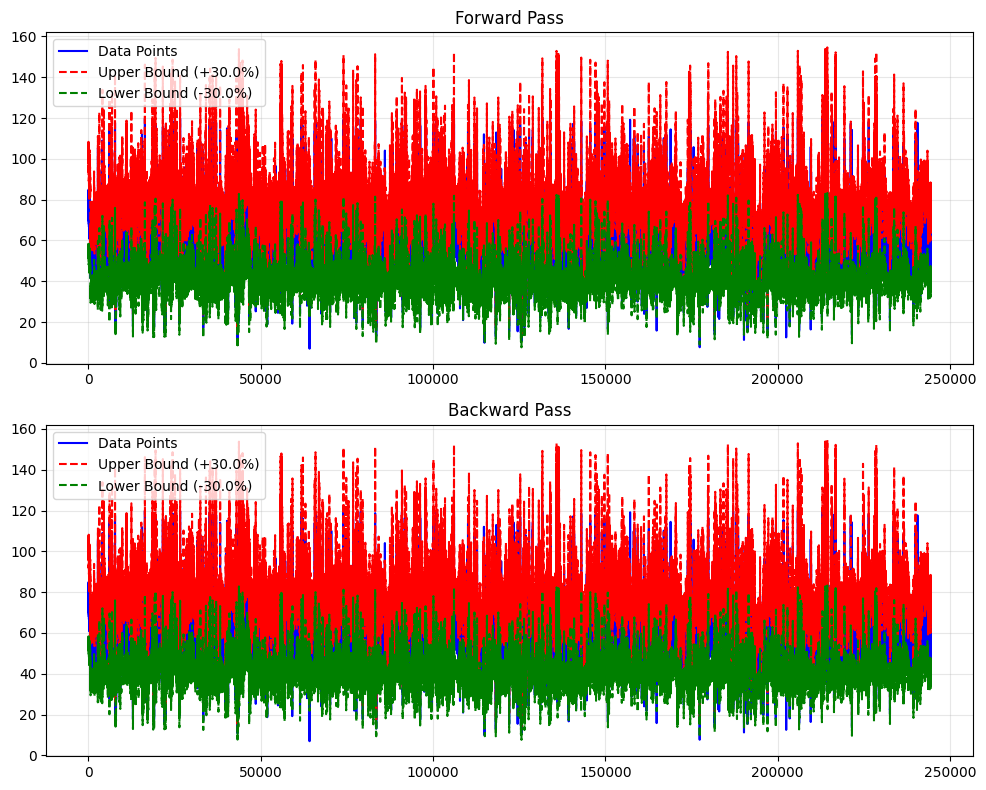

In [262]:
alb_st_flagged, alb_st_filtered = apply_forward_backward_filter(alb_st_filtered,column = "yield", plot=True)

In [263]:
alb_st_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,angle,polygon,fwd_bwd_yield_outlier
124,POINT (-114.26126 51.65912),EPSG:4326,2024-09-24,50.0,79.6010,7.9,3.1793,0.200,1.0,0.930660,-0.404702,"POLYGON ((-114.26115 51.65912, -114.26137 51.6...",False
125,POINT (-114.26126 51.65912),EPSG:4326,2024-09-24,50.0,77.8294,7.9,3.1994,0.199,1.0,0.948187,1.289207,"POLYGON ((-114.26115 51.65912, -114.26137 51.6...",False
126,POINT (-114.26126 51.65913),EPSG:4326,2024-09-24,50.0,76.9229,7.9,3.1994,0.196,1.0,0.943475,0.530186,"POLYGON ((-114.26115 51.65912, -114.26137 51.6...",False
127,POINT (-114.26126 51.65913),EPSG:4326,2024-09-24,50.0,81.3041,7.9,3.1883,0.205,1.0,0.932325,0.918278,"POLYGON ((-114.26115 51.65913, -114.26137 51.6...",False
128,POINT (-114.26126 51.65913),EPSG:4326,2024-09-24,50.0,76.9327,7.9,3.1860,0.199,1.0,0.934960,0.178449,"POLYGON ((-114.26115 51.65913, -114.26137 51.6...",False


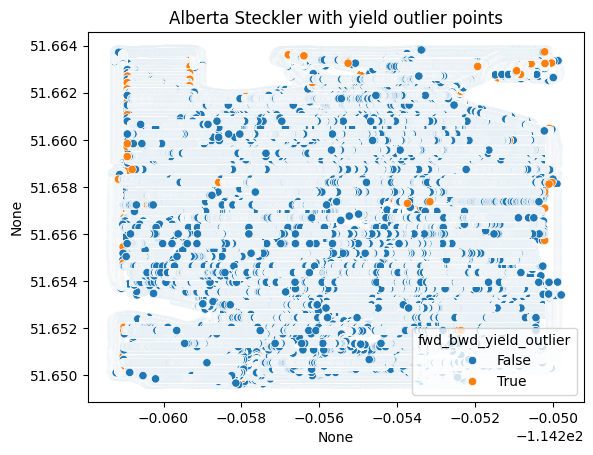

In [264]:
sns.scatterplot(x=alb_st_flagged["geometry"].x,y = alb_st_flagged["geometry"].y, hue = alb_st_flagged["fwd_bwd_yield_outlier"])
plt.title("Alberta Steckler with yield outlier points")
plt.show()

##### Isolation forest

/var/folders/sr/72fkw_hj777b6plyb3n4ym8w0000gn/T/ipykernel_26470/2120415342.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  alb_st_filtered.drop(columns=["isolation_forest_outlier"],inplace=True)


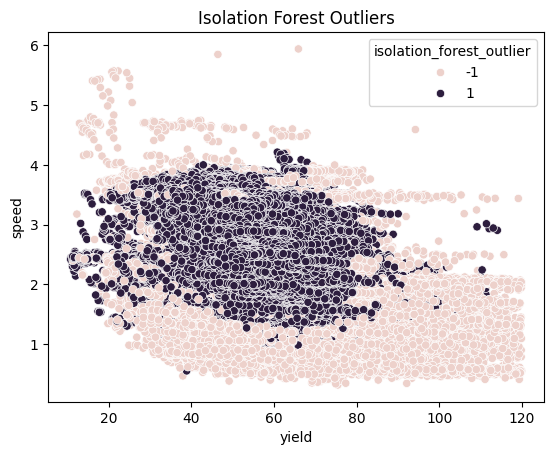

In [265]:
df_x = alb_st_filtered[["yield","speed","swath_width","pass_number","distance"]]
isolation_forest_model.fit(df_x)
alb_st_filtered["isolation_forest_outlier"] = isolation_forest_model.predict(df_x)
alb_st_flagged = alb_st_filtered.copy()
alb_st_filtered = alb_st_flagged[alb_st_flagged["isolation_forest_outlier"] == 1]
alb_st_filtered.drop(columns=["isolation_forest_outlier"],inplace=True)

#plot outliers of yield vs speed
sns.scatterplot(x = alb_st_flagged["yield"], y = alb_st_flagged["speed"],
                hue = alb_st_flagged["isolation_forest_outlier"] )
plt.title("Isolation Forest Outliers")
plt.show()



##### Testing normal distribution

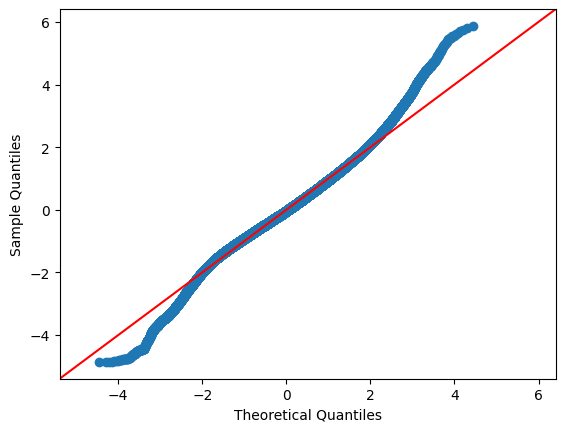

In [266]:
import statsmodels.api as sm

sm.qqplot(alb_st_filtered['yield'], line='45',fit =True)
plt.show()

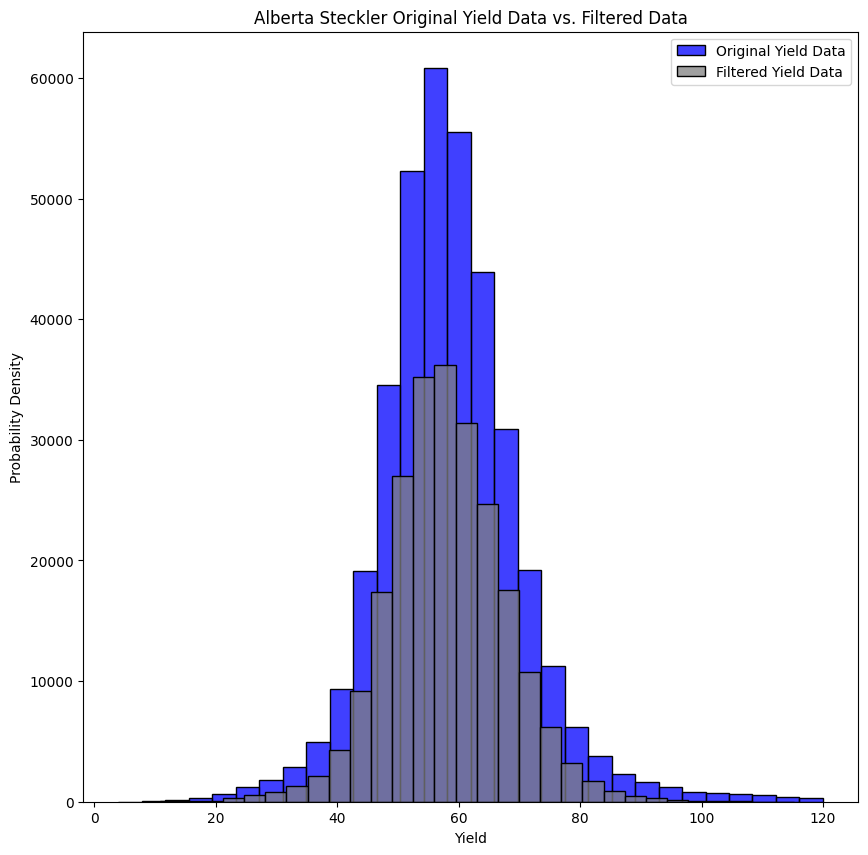

In [267]:
plt.figure(figsize=(10, 10))
# Plot the yield data as a histogram
sns.histplot(alberta_st['yield'], bins=30,  label='Original Yield Data', color= "blue")
sns.histplot(alb_st_filtered['yield'], bins=30, label='Filtered Yield Data',color = "gray")





# Add labels and title
plt.xlabel('Yield')
plt.ylabel('Probability Density')
plt.title('Alberta Steckler Original Yield Data vs. Filtered Data')



# Add a legend
plt.legend()


# Display the plot
plt.show()

##### Z-score filter

In [268]:
alb_st_flagged, alb_st_filtered = z_score_filter(alb_st_filtered,column = "yield", threshold=3)

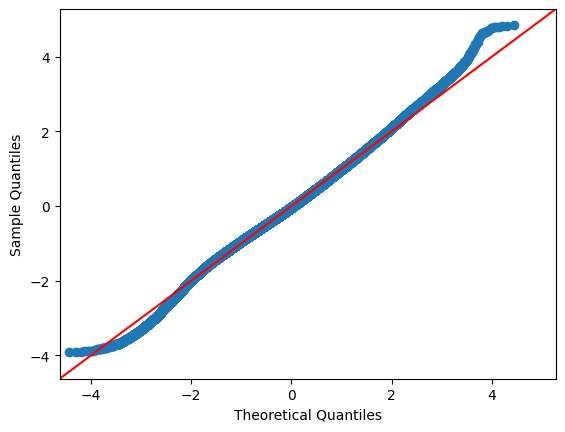

In [269]:
sm.qqplot(alb_st_filtered['yield'], line='45',fit =True)
plt.show()

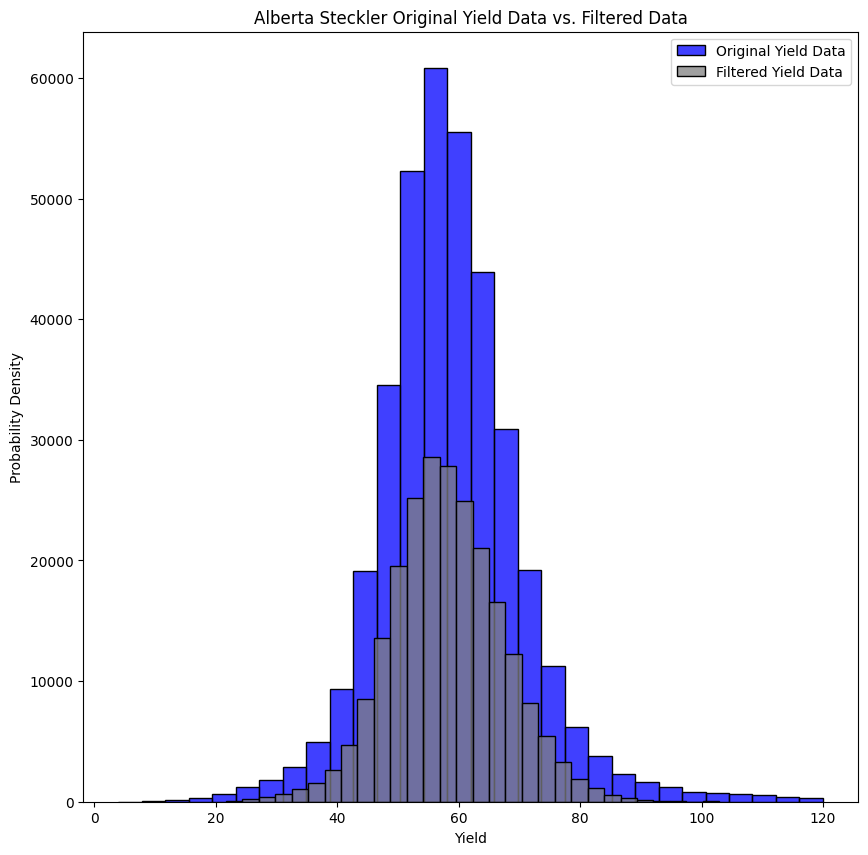

In [270]:
plt.figure(figsize=(10, 10))
# Plot the yield data as a histogram
sns.histplot(alberta_st['yield'], bins=30,  label='Original Yield Data', color= "blue")
sns.histplot(alb_st_filtered['yield'], bins=30, label='Filtered Yield Data',color = "gray")





# Add labels and title
plt.xlabel('Yield')
plt.ylabel('Probability Density')
plt.title('Alberta Steckler Original Yield Data vs. Filtered Data')



# Add a legend
plt.legend()


# Display the plot
plt.show()

##### Data size and exportation

- Original dataset size = 367450
- Filtered dataset size = 229981

In [271]:
print("Original dataset size : " + str(len(alberta_st)))
print ("Filtered dataset size : " + str(len(alb_st_filtered)))

Original dataset size : 367450
Filtered dataset size : 229986


In [272]:
#Data exportation
alberta_st_to_export = alb_st_filtered[["geometry","yield","CRS"]]
alberta_st_to_export.to_csv('data/filtered_data/alberta_st.csv')

### Manitoba

#### Manitoba Eds

##### Fill and finish Mode errors

In [273]:
mtb_eds_flagged, mtb_eds_filtered = apply_fill_and_finish_filter(manitoba_eds,plot_=False)

In [274]:
mtb_eds_flagged.head()

,geometry,date,CRS,swath_width,yield,moisture,speed,duration,pass_number,distance,cum_duration,fill_finish
0,POINT (-97.41521 50.03435),2024-09-13,EPSG:4326,45.0,0.000000,0.0,1.767968,NaN,1.0,0.000000,NaN,False
1,POINT (-97.41521 50.03434),2024-09-13,EPSG:4326,45.0,14.771870,0.0,2.045093,1.0,1.0,3.371113,1.0,True
2,POINT (-97.41522 50.03433),2024-09-13,EPSG:4326,45.0,10.066287,0.0,2.833836,1.0,1.0,4.850474,2.0,True
3,POINT (-97.41522 50.03431),2024-09-13,EPSG:4326,45.0,10.749744,0.0,3.270486,1.0,1.0,5.095706,3.0,True
4,POINT (-97.41522 50.0343),2024-09-13,EPSG:4326,45.0,11.600300,0.0,3.865959,1.0,1.0,5.937705,4.0,True


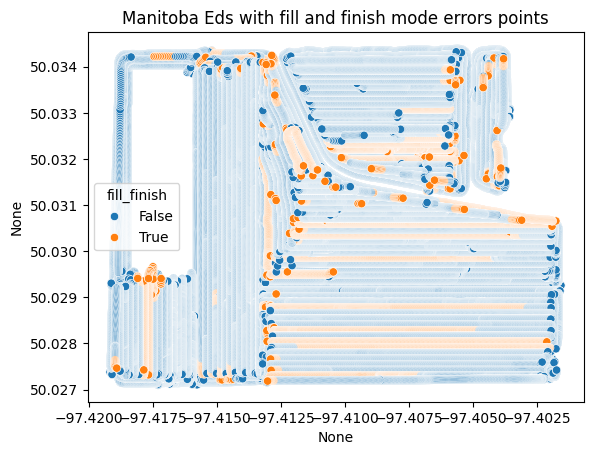

In [275]:
sns.scatterplot(x=mtb_eds_flagged["geometry"].x,y = mtb_eds_flagged["geometry"].y, hue = mtb_eds_flagged["fill_finish"])
plt.title("Manitoba Eds with fill and finish mode errors points")
plt.show()

##### Short segment

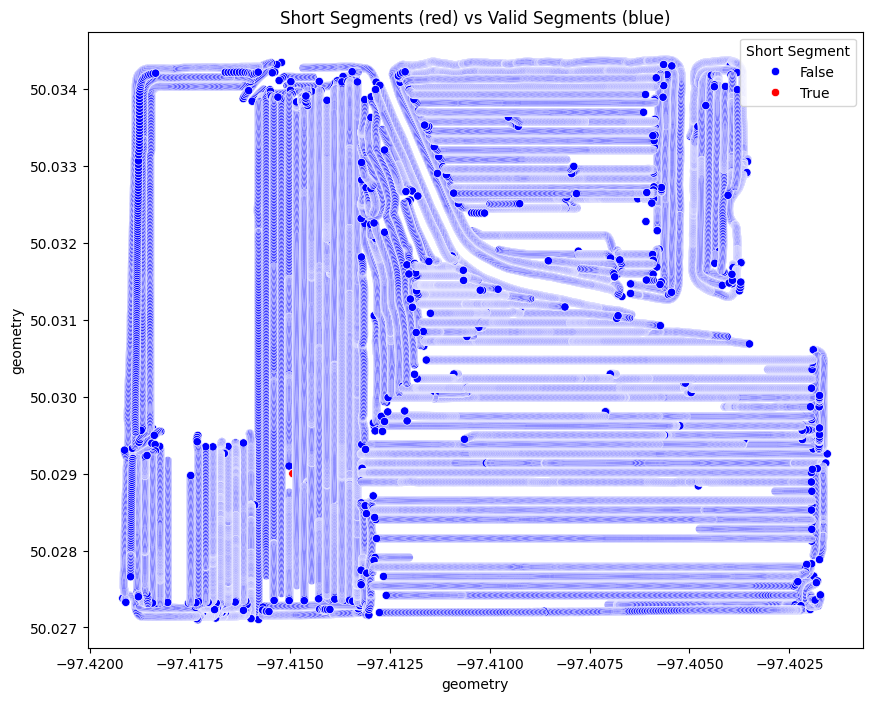

In [276]:
mtb_eds_flagged, mtb_eds_filtered = apply_short_segment_filter(mtb_eds_filtered,length=355,plot_=True)

In [277]:
mtb_eds_flagged.head()

,geometry,date,CRS,swath_width,yield,moisture,speed,duration,pass_number,distance,short_segment,cum_distance
0,POINT (-97.41521 50.03435),2024-09-13,EPSG:4326,45.0,0.000000,0.000,1.767968,NaN,1.0,0.000000,False,0.000000
24,POINT (-97.41566 50.034),2024-09-13,EPSG:4326,45.0,34.216175,6.210,5.289992,1.0,1.0,7.780979,False,7.780979
25,POINT (-97.41569 50.03399),2024-09-13,EPSG:4326,45.0,36.948714,7.138,5.361127,1.0,1.0,7.860968,False,15.641947
26,POINT (-97.41572 50.03397),2024-09-13,EPSG:4326,45.0,40.293623,7.610,5.397813,1.0,1.0,7.961821,False,23.603768
27,POINT (-97.41574 50.03396),2024-09-13,EPSG:4326,45.0,32.401506,7.694,5.514133,1.0,1.0,8.070207,False,31.673975


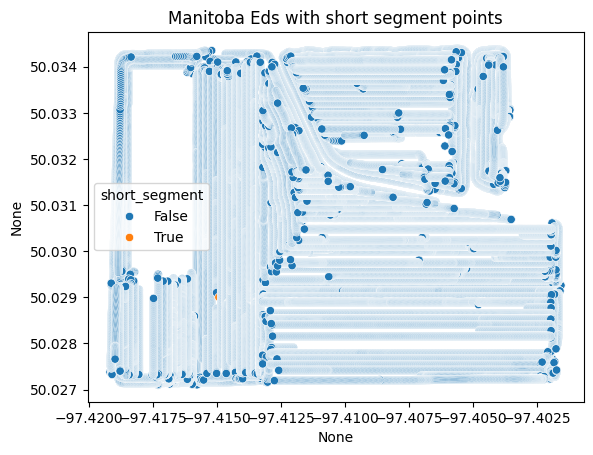

In [278]:
sns.scatterplot(x=mtb_eds_flagged["geometry"].x,y = mtb_eds_flagged["geometry"].y, hue = mtb_eds_flagged["short_segment"])
plt.title("Manitoba Eds with short segment points")
plt.show()

##### Moisture filter

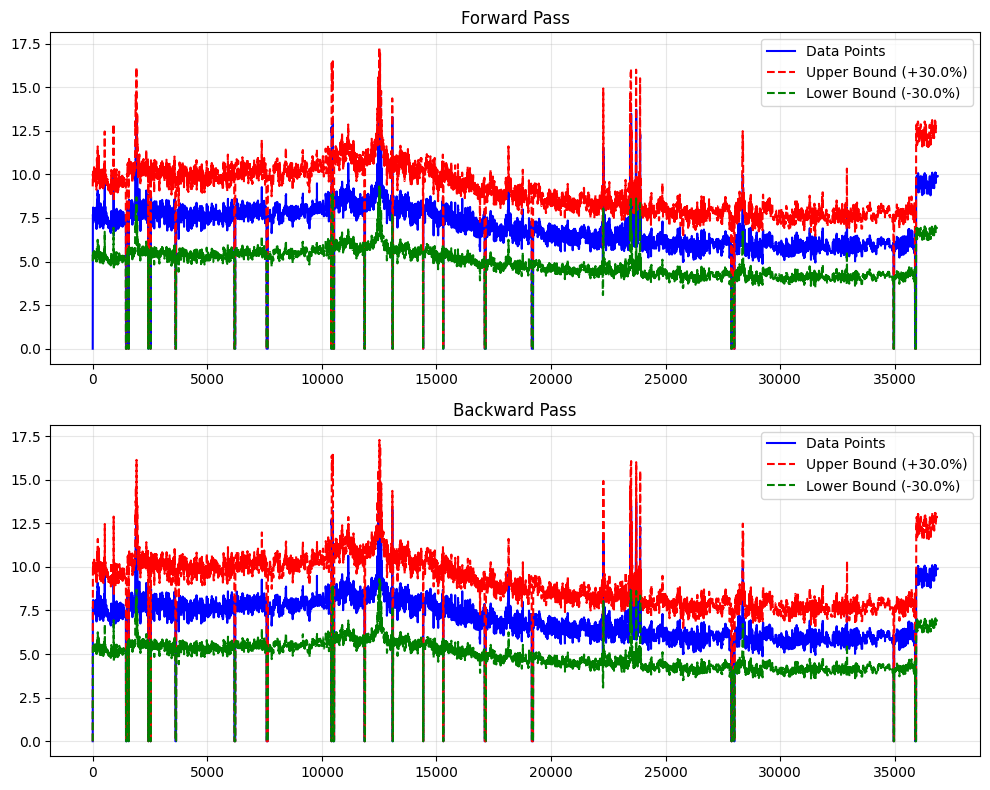

In [279]:
mtb_eds_flagged, mtb_eds_filtered = apply_forward_backward_filter(mtb_eds_filtered,column = "moisture", plot=True)

In [280]:
mtb_eds_flagged.head()

,geometry,date,CRS,swath_width,yield,moisture,speed,duration,pass_number,distance,fwd_bwd_moisture_outlier
0,POINT (-97.41521 50.03435),2024-09-13,EPSG:4326,45.0,0.000000,0.000,1.767968,NaN,1.0,0.000000,False
24,POINT (-97.41566 50.034),2024-09-13,EPSG:4326,45.0,34.216175,6.210,5.289992,1.0,1.0,7.780979,False
25,POINT (-97.41569 50.03399),2024-09-13,EPSG:4326,45.0,36.948714,7.138,5.361127,1.0,1.0,7.860968,False
26,POINT (-97.41572 50.03397),2024-09-13,EPSG:4326,45.0,40.293623,7.610,5.397813,1.0,1.0,7.961821,False
27,POINT (-97.41574 50.03396),2024-09-13,EPSG:4326,45.0,32.401506,7.694,5.514133,1.0,1.0,8.070207,False


<Axes: xlabel='None', ylabel='None'>

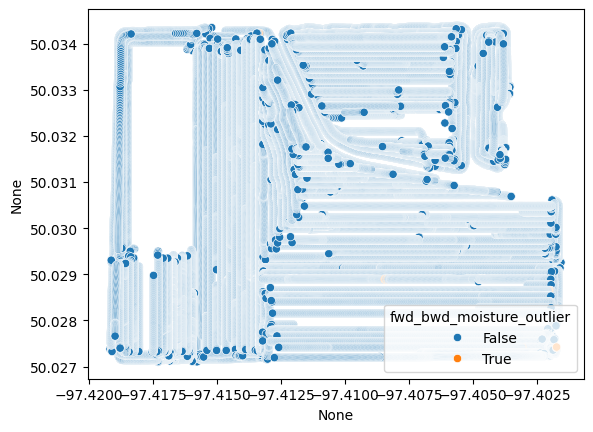

In [281]:
sns.scatterplot(x=mtb_eds_flagged["geometry"].x,y = mtb_eds_flagged["geometry"].y, hue = mtb_eds_flagged["fwd_bwd_moisture_outlier"])

##### Speed filter

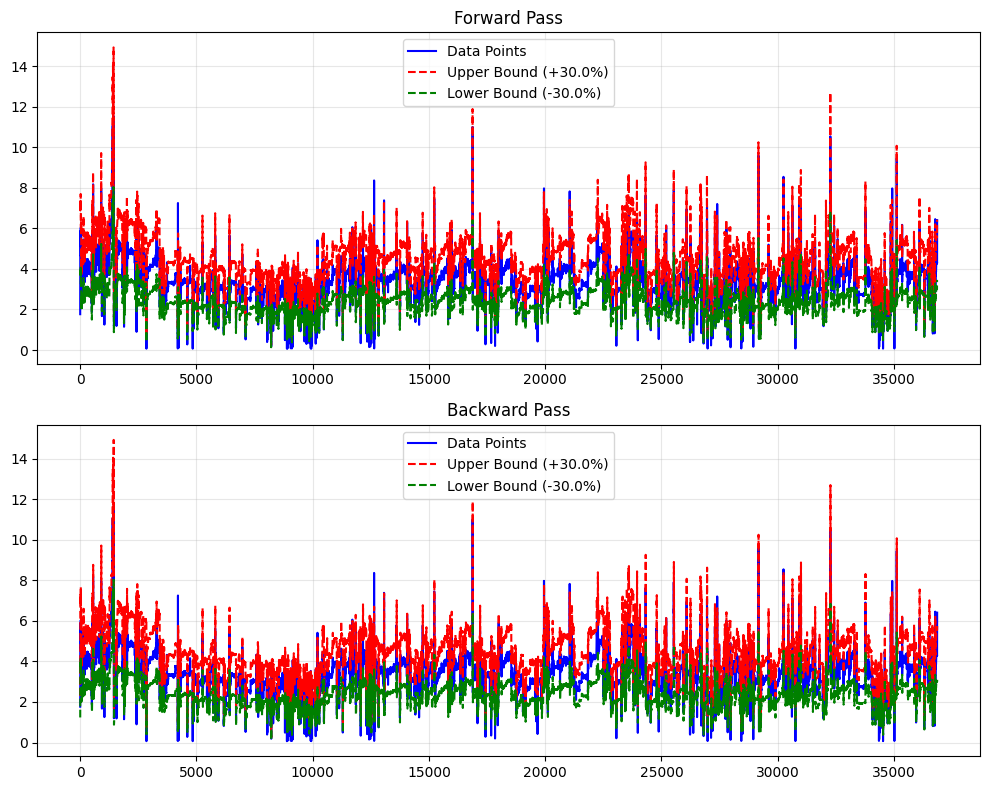

In [282]:
mtb_eds_flagged, mtb_eds_filtered = apply_forward_backward_filter(mtb_eds_filtered,column = "speed", plot=True)

In [283]:
mtb_eds_flagged.head()

,geometry,date,CRS,swath_width,yield,moisture,speed,duration,pass_number,distance,fwd_bwd_speed_outlier
0,POINT (-97.41521 50.03435),2024-09-13,EPSG:4326,45.0,0.000000,0.000,1.767968,NaN,1.0,0.000000,False
24,POINT (-97.41566 50.034),2024-09-13,EPSG:4326,45.0,34.216175,6.210,5.289992,1.0,1.0,7.780979,False
25,POINT (-97.41569 50.03399),2024-09-13,EPSG:4326,45.0,36.948714,7.138,5.361127,1.0,1.0,7.860968,False
26,POINT (-97.41572 50.03397),2024-09-13,EPSG:4326,45.0,40.293623,7.610,5.397813,1.0,1.0,7.961821,False
27,POINT (-97.41574 50.03396),2024-09-13,EPSG:4326,45.0,32.401506,7.694,5.514133,1.0,1.0,8.070207,False


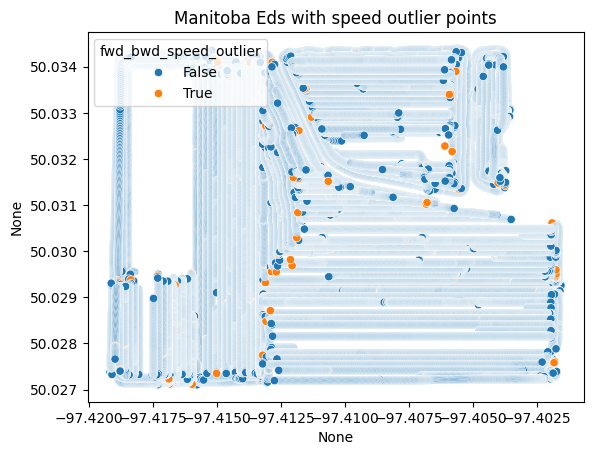

In [284]:
sns.scatterplot(x=mtb_eds_flagged["geometry"].x,y = mtb_eds_flagged["geometry"].y, hue = mtb_eds_flagged["fwd_bwd_speed_outlier"])
plt.title("Manitoba Eds with speed outlier points")
plt.show()

##### Overlapping points

In [285]:
mtb_eds_flagged, mtb_eds_filtered = apply_overlapping_filter(mtb_eds_filtered)

In [286]:
mtb_eds_flagged.head()

,geometry,date,CRS,swath_width,yield,moisture,speed,duration,pass_number,distance,next_point,angle,next_swath_width,polygon,overlapped
0,POINT (-97.41521 50.03435),2024-09-13,EPSG:4326,45.0,0.000000,0.000,1.767968,NaN,1.0,0.000000,POINT (-97.41565971329099 50.03399859275688),39.364375,45.0,"POLYGON ((-97.41529 50.03439, -97.41514 50.034...",False
24,POINT (-97.41566 50.034),2024-09-13,EPSG:4326,45.0,34.216175,6.210,5.289992,1.0,1.0,7.780979,POINT (-97.41568738429145 50.033986495256485),55.833612,45.0,"POLYGON ((-97.41573 50.03404, -97.41559 50.033...",False
25,POINT (-97.41569 50.03399),2024-09-13,EPSG:4326,45.0,36.948714,7.138,5.361127,1.0,1.0,7.860968,POINT (-97.41571512029127 50.03397397175666),54.969685,45.0,"POLYGON ((-97.41563 50.03394, -97.41574 50.034...",False
26,POINT (-97.41572 50.03397),2024-09-13,EPSG:4326,45.0,40.293623,7.610,5.397813,1.0,1.0,7.961821,POINT (-97.41574297229089 50.033961040756964),54.216269,45.0,"POLYGON ((-97.41566 50.03392, -97.41577 50.034...",False
27,POINT (-97.41574 50.03396),2024-09-13,EPSG:4326,45.0,32.401506,7.694,5.514133,1.0,1.0,8.070207,POINT (-97.41576967628988 50.033947696758),52.196103,45.0,"POLYGON ((-97.41569 50.03391, -97.4158 50.0340...",False


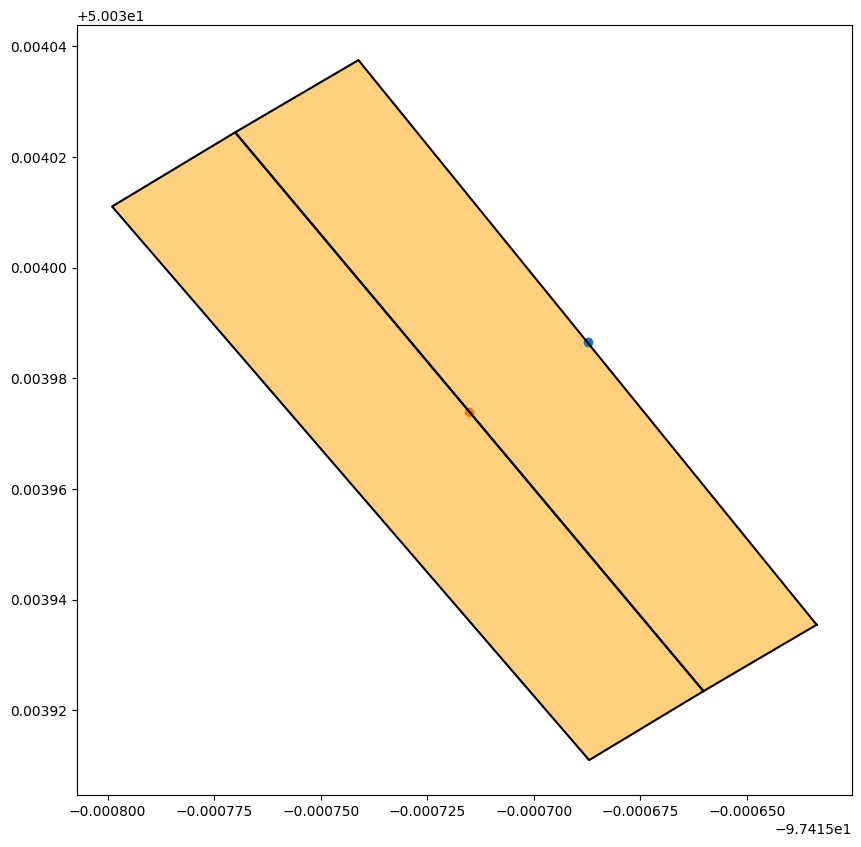

In [287]:
polygon = mtb_eds_flagged.iloc[2]["polygon"]
point = mtb_eds_flagged.iloc[2]["geometry"]

polygon2 = mtb_eds_flagged.iloc[3]["polygon"]
point2 = mtb_eds_flagged.iloc[3]["geometry"]

# Plot the polygon
fig, ax = plt.subplots(figsize=(10, 10))
x, y = polygon.exterior.xy
ax.fill(x, y, alpha=0.5, color='orange')
ax.plot(x, y, color='black')
ax.scatter(point.x,point.y)
x2, y2 = polygon2.exterior.xy
ax.fill(x2, y2, alpha=0.5, color='orange')
ax.plot(x2, y2, color='black')
ax.scatter(point2.x,point2.y)

# Show the plot
plt.show()

##### Yield filter

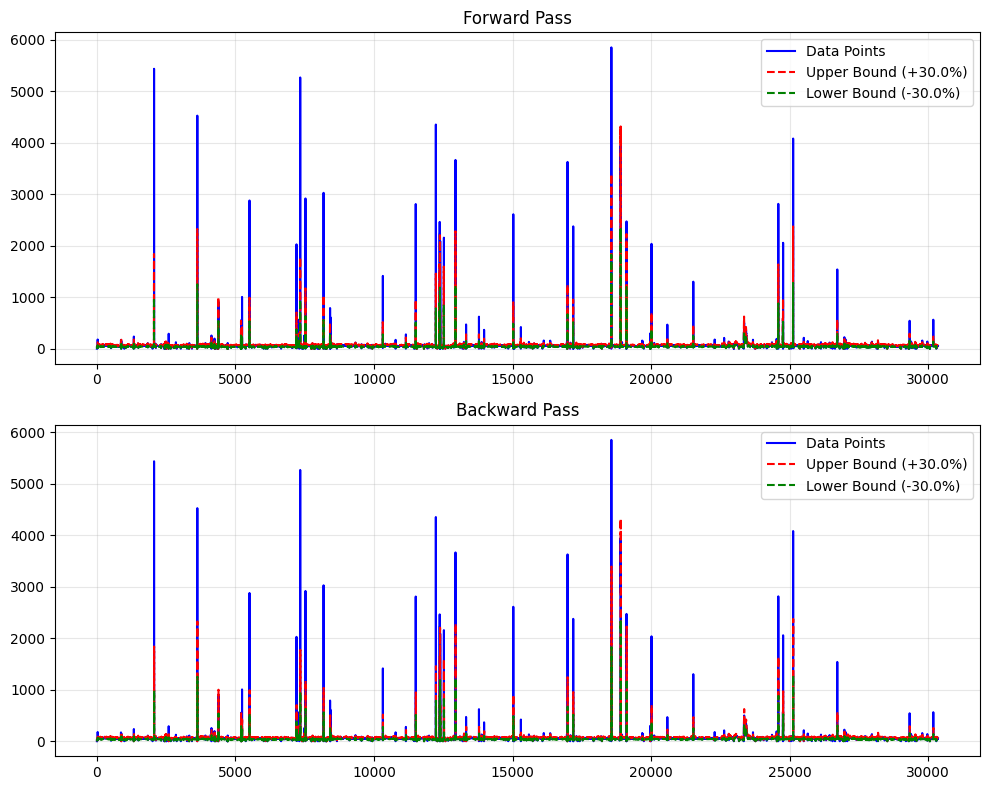

In [288]:
mtb_eds_flagged, mtb_eds_filtered = apply_forward_backward_filter(mtb_eds_filtered,column = "yield", plot=True)

In [289]:
mtb_eds_flagged.head()

,geometry,date,CRS,swath_width,yield,moisture,speed,duration,pass_number,distance,angle,polygon,fwd_bwd_yield_outlier
0,POINT (-97.41521 50.03435),2024-09-13,EPSG:4326,45.0,0.000000,0.000,1.767968,NaN,1.0,0.000000,39.364375,"POLYGON ((-97.41529 50.03439, -97.41514 50.034...",False
24,POINT (-97.41566 50.034),2024-09-13,EPSG:4326,45.0,34.216175,6.210,5.289992,1.0,1.0,7.780979,55.833612,"POLYGON ((-97.41573 50.03404, -97.41559 50.033...",False
25,POINT (-97.41569 50.03399),2024-09-13,EPSG:4326,45.0,36.948714,7.138,5.361127,1.0,1.0,7.860968,54.969685,"POLYGON ((-97.41563 50.03394, -97.41574 50.034...",False
26,POINT (-97.41572 50.03397),2024-09-13,EPSG:4326,45.0,40.293623,7.610,5.397813,1.0,1.0,7.961821,54.216269,"POLYGON ((-97.41566 50.03392, -97.41577 50.034...",True
27,POINT (-97.41574 50.03396),2024-09-13,EPSG:4326,45.0,32.401506,7.694,5.514133,1.0,1.0,8.070207,52.196103,"POLYGON ((-97.41569 50.03391, -97.4158 50.0340...",False


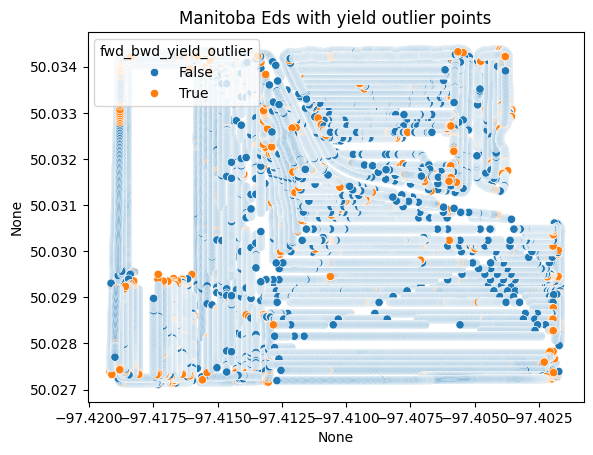

In [290]:
sns.scatterplot(x=mtb_eds_flagged["geometry"].x,y = mtb_eds_flagged["geometry"].y, hue = mtb_eds_flagged["fwd_bwd_yield_outlier"])
plt.title("Manitoba Eds with yield outlier points")
plt.show()

##### Isolation forest

/var/folders/sr/72fkw_hj777b6plyb3n4ym8w0000gn/T/ipykernel_26470/421074927.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mtb_eds_filtered.drop(columns=["isolation_forest_outlier"],inplace=True)


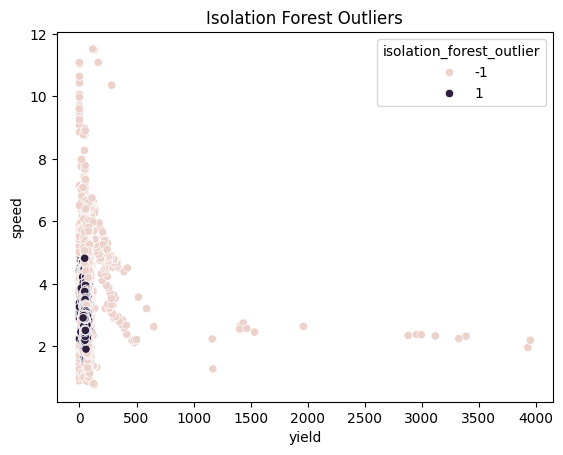

In [291]:
df_x = mtb_eds_filtered[["yield","speed","swath_width","pass_number","distance"]]
isolation_forest_model.fit(df_x)
mtb_eds_filtered["isolation_forest_outlier"] = isolation_forest_model.predict(df_x)
mtb_eds_flagged = mtb_eds_filtered.copy()
mtb_eds_filtered = mtb_eds_flagged[mtb_eds_flagged["isolation_forest_outlier"] == 1]
mtb_eds_filtered.drop(columns=["isolation_forest_outlier"],inplace=True)

#plot outliers of yield vs speed
sns.scatterplot(x = mtb_eds_flagged["yield"], y = mtb_eds_flagged["speed"],
                hue = mtb_eds_flagged["isolation_forest_outlier"] )
plt.title("Isolation Forest Outliers")
plt.show()



##### Testing normal distribution

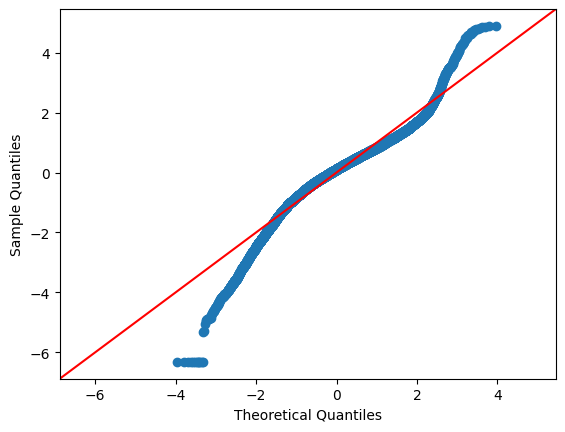

In [292]:
sm.qqplot(mtb_eds_filtered['yield'], line='45',fit =True)
plt.show()

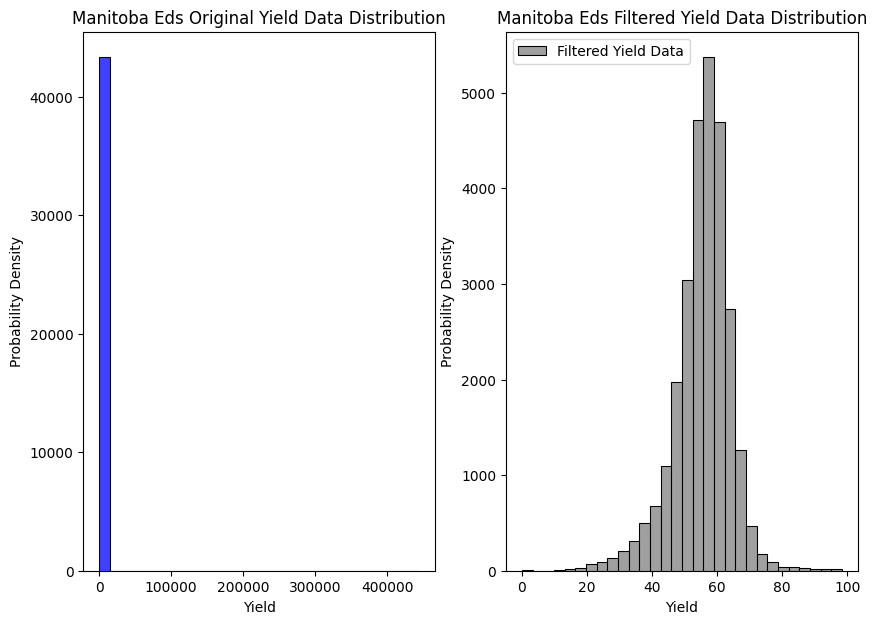

In [293]:
# Plot the yield data as a histogram

fig, ax = plt.subplots(ncols = 2, figsize = (10,7) )
sns.histplot(manitoba_eds['yield'], bins=30,
             label='Original Yield Data', color= "blue", ax = ax[0])
sns.histplot(mtb_eds_filtered['yield'], bins=30,
             label='Filtered Yield Data',color = "gray", ax = ax[1])





# Add labels and title
ax[0].set_xlabel('Yield')
ax[0].set_ylabel('Probability Density')
ax[0].set_title('Manitoba Eds Original Yield Data Distribution')

ax[1].set_xlabel('Yield')
ax[1].set_ylabel('Probability Density')
ax[1].set_title('Manitoba Eds Filtered Yield Data Distribution')



# Add a legend
plt.legend()


# Display the plot
plt.show()

##### Z-score filter

In [294]:
mtb_eds_flagged, mtb_eds_filtered = z_score_filter(mtb_eds_filtered,column = "yield", threshold=3)

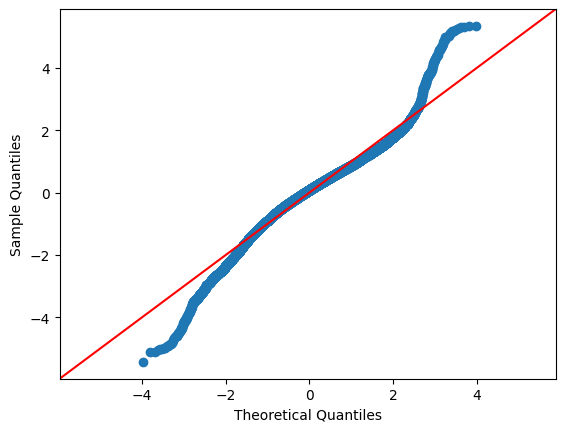

In [295]:
sm.qqplot(mtb_eds_filtered['yield'], line='45',fit =True)
plt.show()

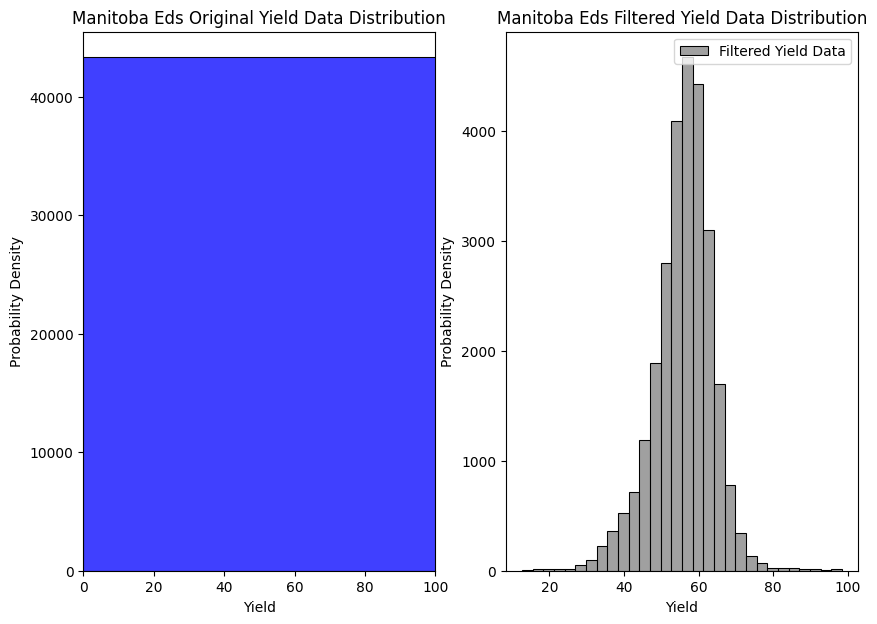

In [296]:
# Plot the yield data as a histogram

fig, ax = plt.subplots(ncols = 2, figsize = (10,7) )
sns.histplot(manitoba_eds['yield'], bins=30,
             label='Original Yield Data', color="blue", ax=ax[0])

ax[0].set_xlim(0, 100)  # Limit x-axis to 100

sns.histplot(mtb_eds_filtered['yield'], bins=30,
             label='Filtered Yield Data',color = "gray", ax = ax[1])





# Add labels and title
ax[0].set_xlabel('Yield')
ax[0].set_ylabel('Probability Density')
ax[0].set_title('Manitoba Eds Original Yield Data Distribution')

ax[1].set_xlabel('Yield')
ax[1].set_ylabel('Probability Density')
ax[1].set_title('Manitoba Eds Filtered Yield Data Distribution')



# Add a legend
plt.legend()


# Display the plot
plt.show()

##### Data size and exportation

In [297]:
print("Original dataset size : " + str(len(manitoba_eds)))
print("Filtered dataset size : " + str(len(mtb_eds_filtered)))

Original dataset size : 43333
Filtered dataset size : 27369


In [298]:
#Data exportation

manitoba_eds_to_export = mtb_eds_filtered[["geometry","yield","CRS"]]
manitoba_eds_to_export.to_csv('data/filtered_data/manitoba_eds.csv')

#### Mantioba Home

##### Fill and finish Mode errors

In [299]:
mtb_home_flagged, mtb_home_filtered = apply_fill_and_finish_filter(manitoba_home,plot_=False)

In [300]:
mtb_home_flagged.head()

,geometry,date,CRS,swath_width,yield,moisture,speed,duration,pass_number,distance,cum_duration,fill_finish
0,POINT (-97.43218 50.04622),2024-10-06,EPSG:4326,30.0,0.0,5.712105,1.308278,NaN,1.0,0.000000,NaN,False
1,POINT (-97.43218 50.04622),2024-10-06,EPSG:4326,30.0,0.0,5.720000,0.536781,1.0,1.0,0.775422,1.0,True
2,POINT (-97.43218 50.04621),2024-10-06,EPSG:4326,30.0,0.0,5.720000,0.701289,1.0,1.0,1.028572,2.0,True
3,POINT (-97.43218 50.04621),2024-10-06,EPSG:4326,30.0,0.0,5.720000,0.782889,1.0,1.0,1.162218,3.0,True
4,POINT (-97.43218 50.04621),2024-10-06,EPSG:4326,30.0,0.0,5.720000,0.872188,1.0,1.0,1.270637,4.0,True


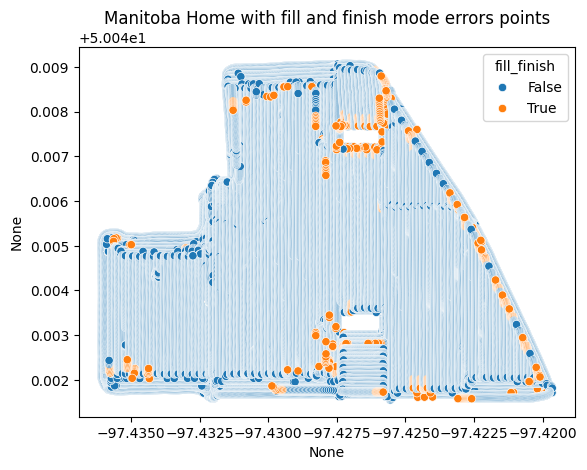

In [301]:
sns.scatterplot(x=mtb_home_flagged["geometry"].x,y = mtb_home_flagged["geometry"].y, hue = mtb_home_flagged["fill_finish"])
plt.title("Manitoba Home with fill and finish mode errors points")
plt.show()

##### Short segment

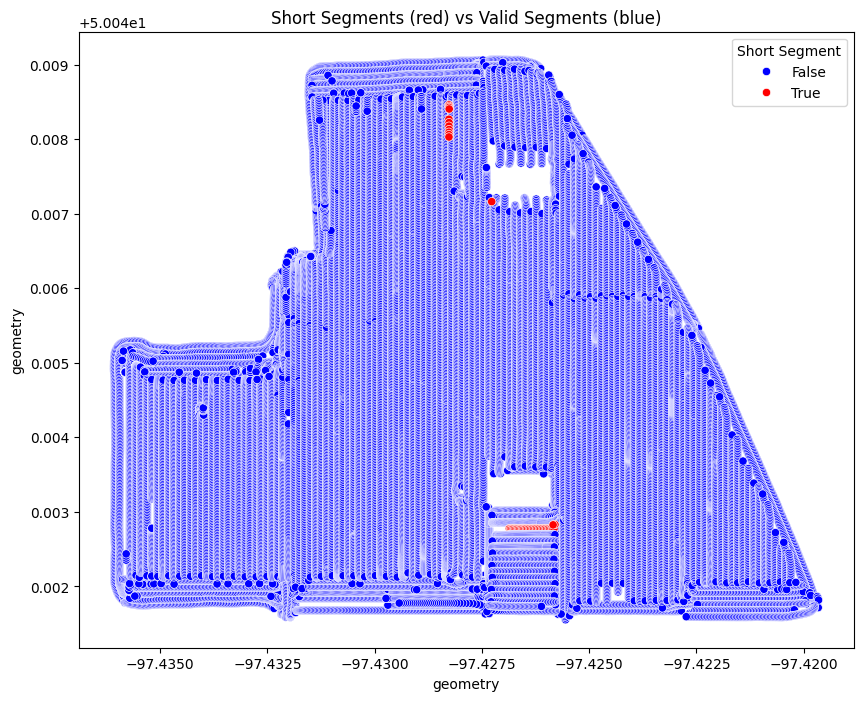

In [302]:
mtb_home_flagged, mtb_home_filtered = apply_short_segment_filter(mtb_home_filtered,length=355,plot_=True)

In [303]:
mtb_home_flagged.head()

,geometry,date,CRS,swath_width,yield,moisture,speed,duration,pass_number,distance,short_segment,cum_distance
0,POINT (-97.43218 50.04622),2024-10-06,EPSG:4326,30.0,0.000000,5.712105,1.308278,NaN,1.0,0.000000,False,0.000000
24,POINT (-97.43233 50.04603),2024-10-06,EPSG:4326,30.0,67.297735,1.000000,3.082334,1.0,1.0,4.536690,False,4.536690
25,POINT (-97.43234 50.04602),2024-10-06,EPSG:4326,30.0,67.297735,1.000000,3.047842,1.0,1.0,4.500116,False,9.036805
26,POINT (-97.43235 50.04601),2024-10-06,EPSG:4326,30.0,67.297735,1.000000,2.665097,1.0,1.0,3.883152,False,12.919957
27,POINT (-97.43229 50.04616),2024-10-06,EPSG:4326,5.0,63.584483,19.690000,0.107394,31.0,1.0,59.334476,False,72.254433


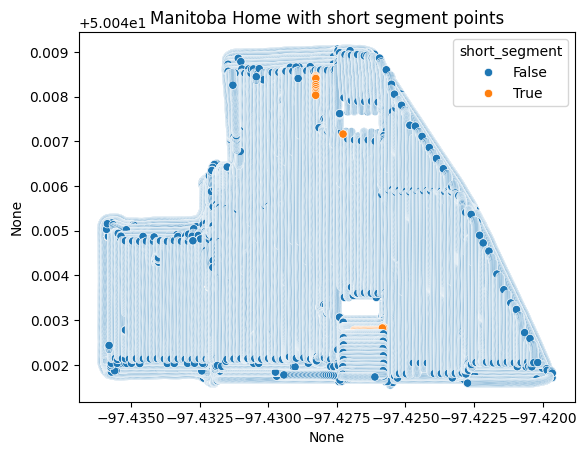

In [304]:
sns.scatterplot(x=mtb_home_flagged["geometry"].x,y = mtb_home_flagged["geometry"].y, hue = mtb_home_flagged["short_segment"])
plt.title("Manitoba Home with short segment points")
plt.show()

##### Moisture filter

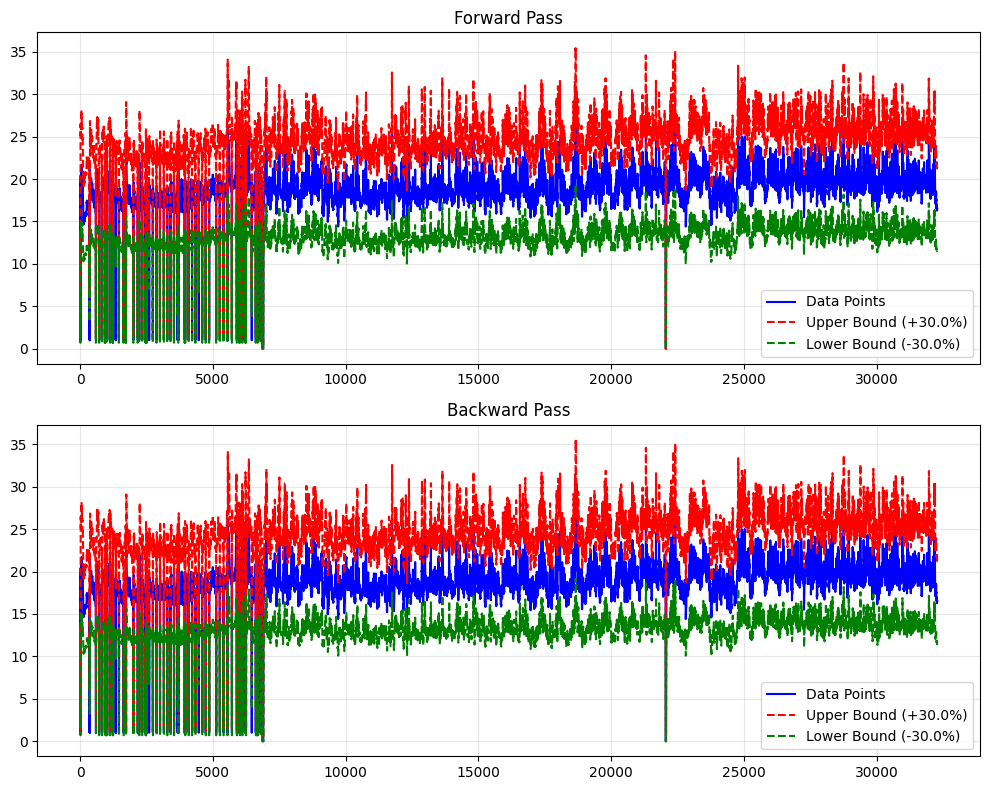

In [305]:
mtb_home_flagged, mtb_home_filtered = apply_forward_backward_filter(mtb_home_filtered,column = "moisture", plot=True)

In [306]:
mtb_home_flagged.head()

,geometry,date,CRS,swath_width,yield,moisture,speed,duration,pass_number,distance,fwd_bwd_moisture_outlier
0,POINT (-97.43218 50.04622),2024-10-06,EPSG:4326,30.0,0.000000,5.712105,1.308278,NaN,1.0,0.000000,False
24,POINT (-97.43233 50.04603),2024-10-06,EPSG:4326,30.0,67.297735,1.000000,3.082334,1.0,1.0,4.536690,True
25,POINT (-97.43234 50.04602),2024-10-06,EPSG:4326,30.0,67.297735,1.000000,3.047842,1.0,1.0,4.500116,True
26,POINT (-97.43235 50.04601),2024-10-06,EPSG:4326,30.0,67.297735,1.000000,2.665097,1.0,1.0,3.883152,True
27,POINT (-97.43229 50.04616),2024-10-06,EPSG:4326,5.0,63.584483,19.690000,0.107394,31.0,1.0,59.334476,True


<Axes: xlabel='None', ylabel='None'>

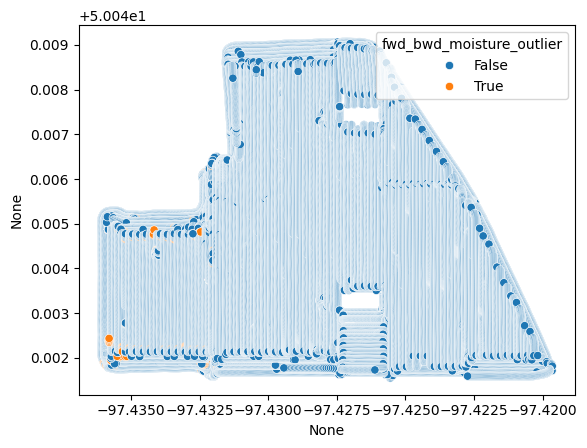

In [307]:
sns.scatterplot(x=mtb_home_flagged["geometry"].x,y = mtb_home_flagged["geometry"].y, hue = mtb_home_flagged["fwd_bwd_moisture_outlier"])

##### Speed filter

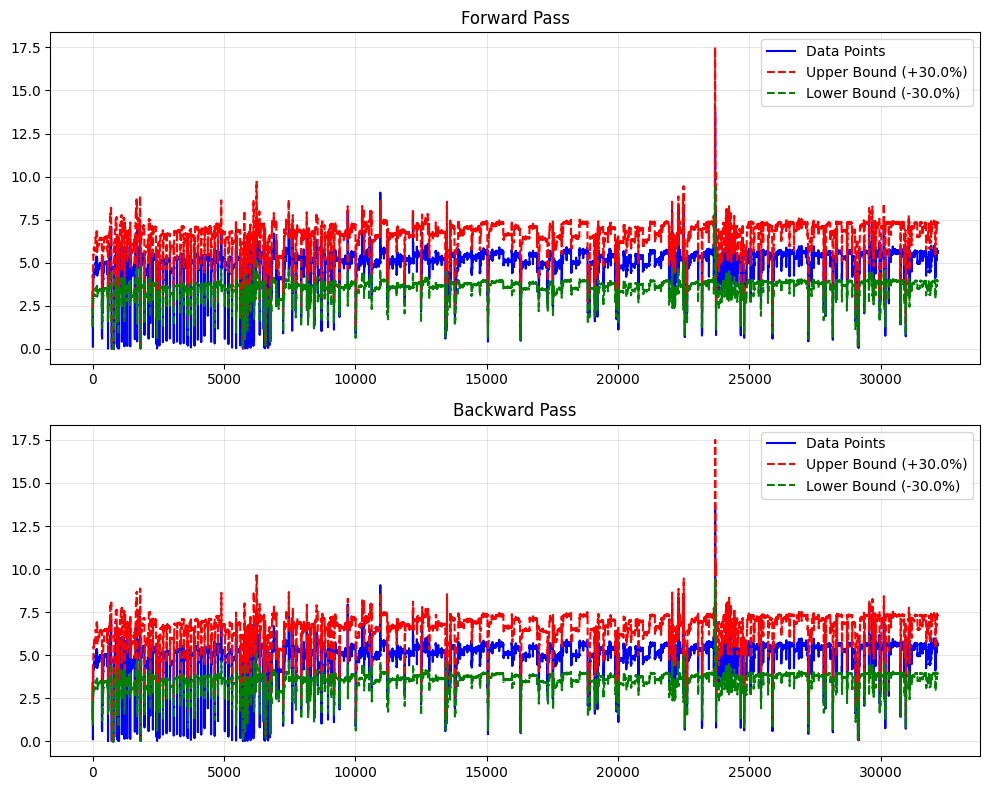

In [308]:
mtb_home_flagged, mtb_home_filtered = apply_forward_backward_filter(mtb_home_filtered,column = "speed", plot=True)

In [309]:
mtb_home_flagged.head()

,geometry,date,CRS,swath_width,yield,moisture,speed,duration,pass_number,distance,fwd_bwd_speed_outlier
0,POINT (-97.43218 50.04622),2024-10-06,EPSG:4326,30.0,0.000000,5.712105,1.308278,NaN,1.0,0.000000,False
29,POINT (-97.43231 50.04615),2024-10-06,EPSG:4326,10.0,42.699510,1.000000,2.567036,1.0,1.0,3.181171,False
30,POINT (-97.43232 50.04614),2024-10-06,EPSG:4326,15.0,56.484959,1.000000,3.040719,1.0,1.0,4.708626,False
31,POINT (-97.43233 50.04613),2024-10-06,EPSG:4326,20.0,59.991246,1.000000,3.417205,1.0,1.0,5.389807,True
33,POINT (-97.43237 50.04611),2024-10-06,EPSG:4326,25.0,0.000000,1.000000,3.420619,1.0,1.0,5.802797,True


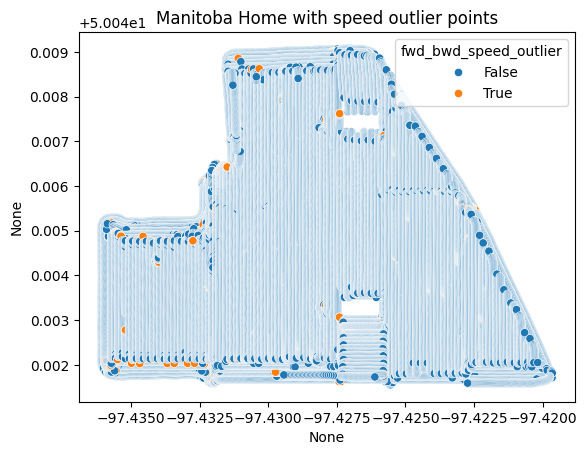

In [310]:
sns.scatterplot(x=mtb_home_flagged["geometry"].x,y = mtb_home_flagged["geometry"].y, hue = mtb_home_flagged["fwd_bwd_speed_outlier"])
plt.title("Manitoba Home with speed outlier points")
plt.show()

##### Overlapping points

In [311]:
mtb_home_flagged, mtb_home_filtered = apply_overlapping_filter(mtb_home_filtered)

In [312]:
mtb_home_flagged.head()

,geometry,date,CRS,swath_width,yield,moisture,speed,duration,pass_number,distance,next_point,angle,next_swath_width,polygon,overlapped
0,POINT (-97.43218 50.04622),2024-10-06,EPSG:4326,30.0,0.000000,5.712105,1.308278,NaN,1.0,0.000000,POINT (-97.43230504391349 50.04615056826062),49.762547,10.0,"POLYGON ((-97.43222 50.04625, -97.43214 50.046...",False
29,POINT (-97.43231 50.04615),2024-10-06,EPSG:4326,10.0,42.699510,1.000000,2.567036,1.0,1.0,3.181171,POINT (-97.43231649637134 50.04613998071086),34.859544,15.0,"POLYGON ((-97.43232 50.04616, -97.43229 50.046...",False
30,POINT (-97.43232 50.04614),2024-10-06,EPSG:4326,15.0,56.484959,1.000000,3.040719,1.0,1.0,4.708626,POINT (-97.43238062508816 50.04609822880825),44.685475,30.0,"POLYGON ((-97.43229 50.04613, -97.43234 50.046...",False
34,POINT (-97.43238 50.0461),2024-10-06,EPSG:4326,30.0,0.000000,1.000000,3.387418,1.0,1.0,5.645913,POINT (-97.43238098111566 50.046076213208366),0.596645,15.0,"POLYGON ((-97.43234 50.04607, -97.43243 50.046...",False
37,POINT (-97.43238 50.04608),2024-10-06,EPSG:4326,15.0,0.000000,20.320000,2.631902,1.0,1.0,5.988957,POINT (-97.43239308400004 50.04606269301304),29.961329,10.0,"POLYGON ((-97.43235 50.04608, -97.43241 50.046...",False


<Axes: >

<Figure size 1500x1500 with 0 Axes>

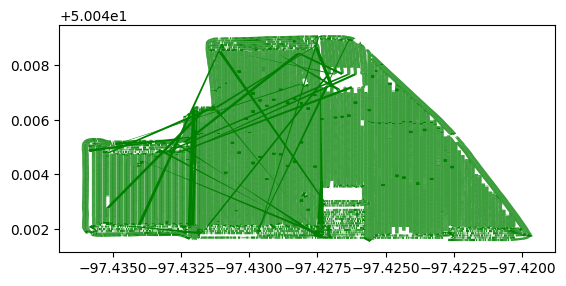

In [313]:
plt.figure(figsize=(15,15))
gpd.GeoSeries(mtb_home_flagged["polygon"]).plot(facecolor='green',  linewidth=0.5, label = "Polygons")

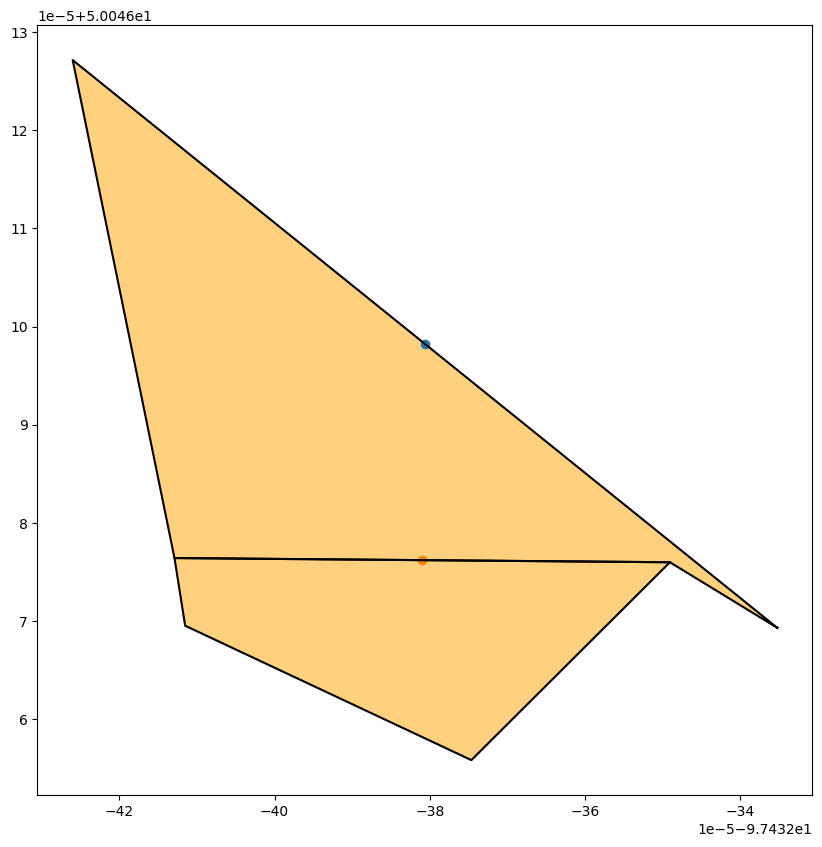

In [314]:
polygon = mtb_home_flagged.iloc[3]["polygon"]
point = mtb_home_flagged.iloc[3]["geometry"]

polygon2 = mtb_home_flagged.iloc[4]["polygon"]
point2 = mtb_home_flagged.iloc[4]["geometry"]

# Plot the polygon
fig, ax = plt.subplots(figsize=(10, 10))
x, y = polygon.exterior.xy
ax.fill(x, y, alpha=0.5, color='orange')
ax.plot(x, y, color='black')
ax.scatter(point.x,point.y)
x2, y2 = polygon2.exterior.xy
ax.fill(x2, y2, alpha=0.5, color='orange')
ax.plot(x2, y2, color='black')
ax.scatter(point2.x,point2.y)

# Show the plot
plt.show()

##### Yield filter

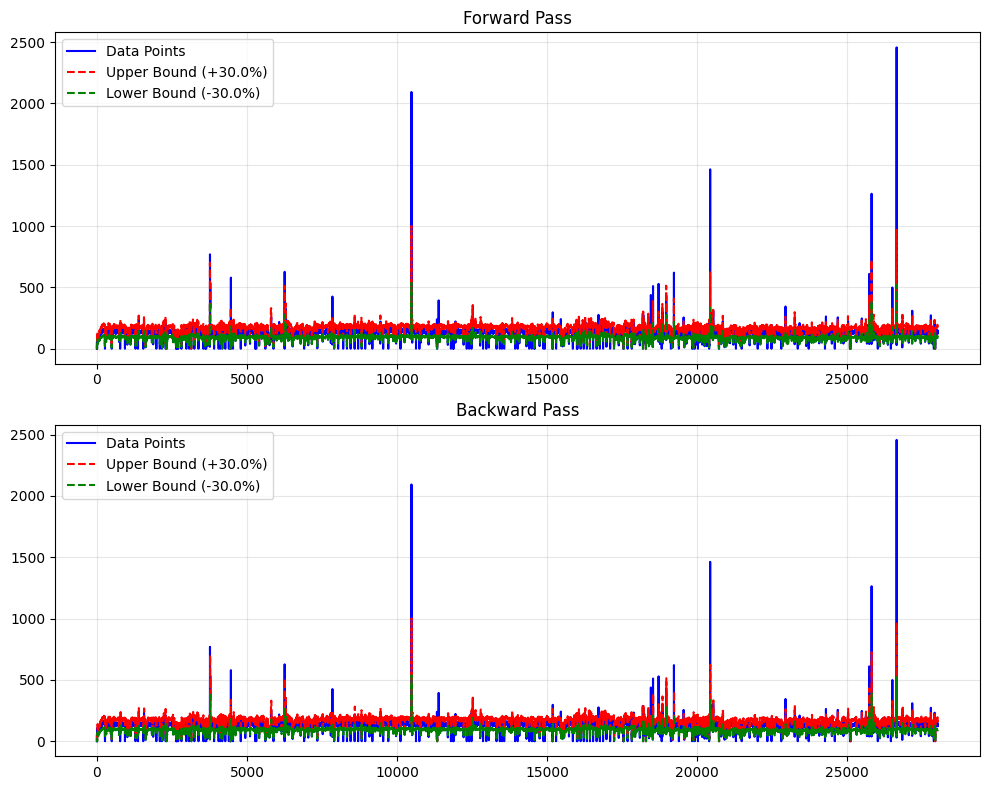

In [315]:
mtb_home_flagged, mtb_home_filtered = apply_forward_backward_filter(mtb_home_filtered,column = "yield", plot=True)

In [316]:
mtb_home_flagged.head()

,geometry,date,CRS,swath_width,yield,moisture,speed,duration,pass_number,distance,angle,polygon,fwd_bwd_yield_outlier
0,POINT (-97.43218 50.04622),2024-10-06,EPSG:4326,30.0,0.000000,5.712105,1.308278,NaN,1.0,0.000000,49.762547,"POLYGON ((-97.43222 50.04625, -97.43214 50.046...",False
29,POINT (-97.43231 50.04615),2024-10-06,EPSG:4326,10.0,42.699510,1.000000,2.567036,1.0,1.0,3.181171,34.859544,"POLYGON ((-97.43232 50.04616, -97.43229 50.046...",True
30,POINT (-97.43232 50.04614),2024-10-06,EPSG:4326,15.0,56.484959,1.000000,3.040719,1.0,1.0,4.708626,44.685475,"POLYGON ((-97.43229 50.04613, -97.43234 50.046...",True
34,POINT (-97.43238 50.0461),2024-10-06,EPSG:4326,30.0,0.000000,1.000000,3.387418,1.0,1.0,5.645913,0.596645,"POLYGON ((-97.43234 50.04607, -97.43243 50.046...",False
37,POINT (-97.43238 50.04608),2024-10-06,EPSG:4326,15.0,0.000000,20.320000,2.631902,1.0,1.0,5.988957,29.961329,"POLYGON ((-97.43235 50.04608, -97.43241 50.046...",True


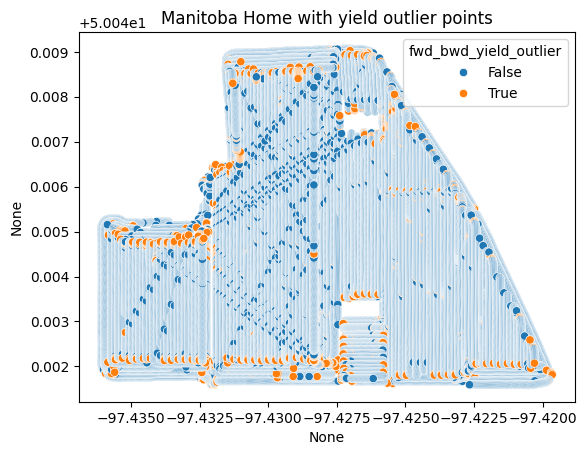

In [317]:
sns.scatterplot(x=mtb_home_flagged["geometry"].x,y = mtb_home_flagged["geometry"].y, hue = mtb_home_flagged["fwd_bwd_yield_outlier"])
plt.title("Manitoba Home with yield outlier points")
plt.show()

##### Isolation forest

/var/folders/sr/72fkw_hj777b6plyb3n4ym8w0000gn/T/ipykernel_26470/3455659275.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mtb_home_filtered.drop(columns=["isolation_forest_outlier"],inplace=True)


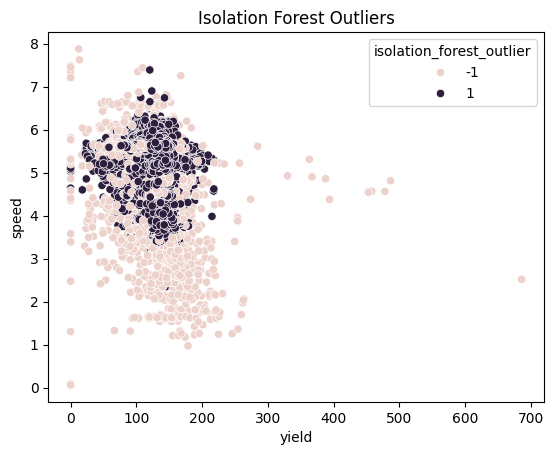

In [318]:
df_x = mtb_home_filtered[["yield","speed","swath_width","pass_number","distance"]]
isolation_forest_model.fit(df_x)
mtb_home_filtered["isolation_forest_outlier"] = isolation_forest_model.predict(df_x)
mtb_home_flagged = mtb_home_filtered.copy()
mtb_home_filtered = mtb_home_flagged[mtb_home_flagged["isolation_forest_outlier"] == 1]
mtb_home_filtered.drop(columns=["isolation_forest_outlier"],inplace=True)

#plot outliers of yield vs speed
sns.scatterplot(x = mtb_home_flagged["yield"], y = mtb_home_flagged["speed"],
                hue = mtb_home_flagged["isolation_forest_outlier"] )
plt.title("Isolation Forest Outliers")
plt.show()



##### Testing normal distribution

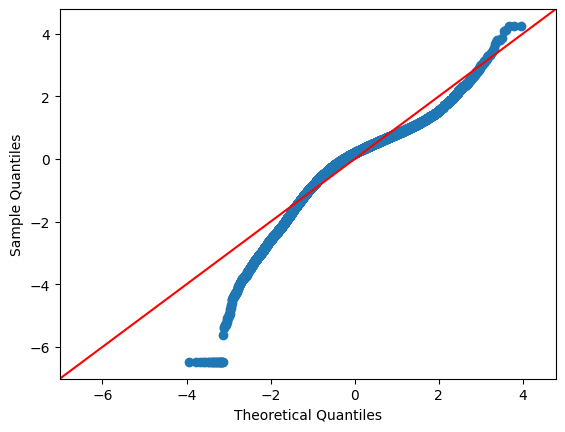

In [319]:
sm.qqplot(mtb_home_filtered['yield'], line='45',fit =True)
plt.show()

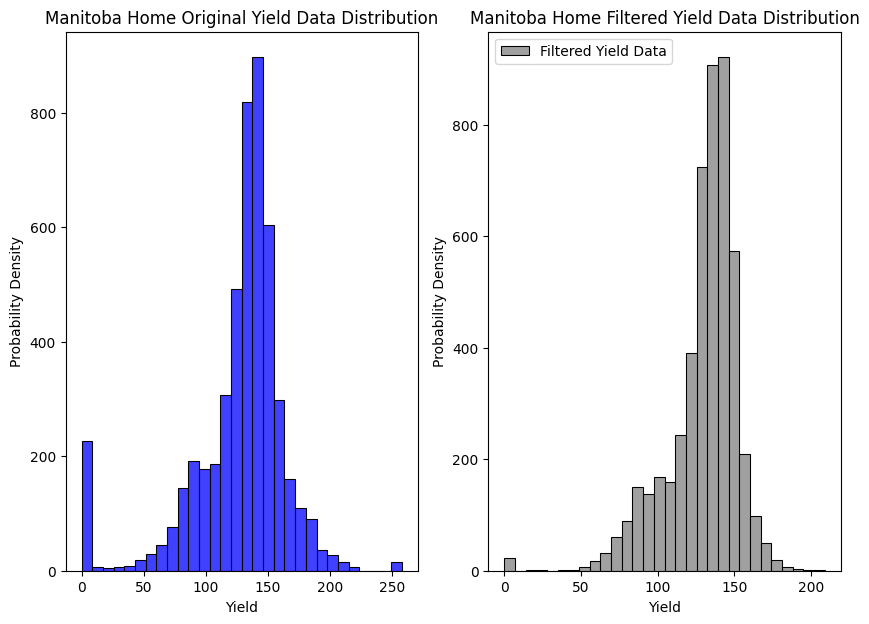

In [320]:
# Plot the yield data as a histogram

fig, ax = plt.subplots(ncols = 2, figsize = (10,7) )
sns.histplot(manitoba_home['yield'][:5000], bins=30,
             label='Original Yield Data', color= "blue", ax = ax[0])
sns.histplot(mtb_home_filtered['yield'][:5000], bins=30,
             label='Filtered Yield Data',color = "gray", ax = ax[1])





# Add labels and title
ax[0].set_xlabel('Yield')
ax[0].set_ylabel('Probability Density')
ax[0].set_title('Manitoba Home Original Yield Data Distribution')

ax[1].set_xlabel('Yield')
ax[1].set_ylabel('Probability Density')
ax[1].set_title('Manitoba Home Filtered Yield Data Distribution')



# Add a legend
plt.legend()


# Display the plot
plt.show()

##### Z-score filter

In [321]:
mtb_home_flagged, mtb_home_filtered = z_score_filter(mtb_home_filtered,column = "yield", threshold=3)

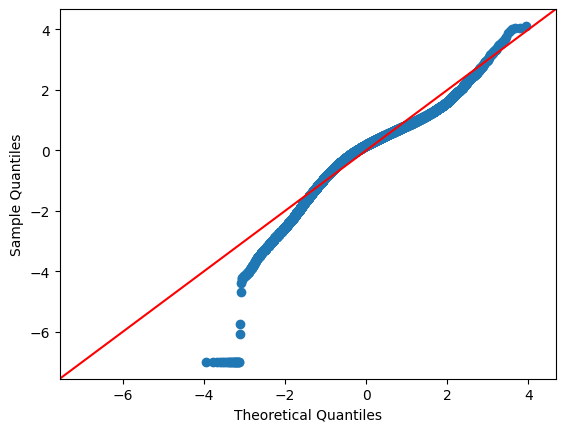

In [322]:
sm.qqplot(mtb_home_filtered['yield'], line='45',fit =True)
plt.show()

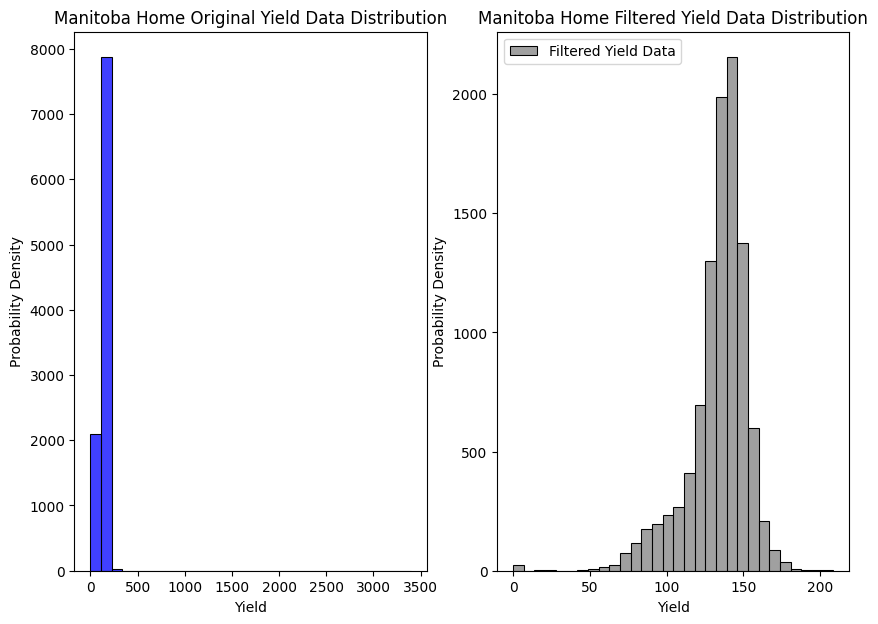

In [323]:
# Plot the yield data as a histogram

fig, ax = plt.subplots(ncols = 2, figsize = (10,7) )
sns.histplot(manitoba_home['yield'][:10000], bins=30,
             label='Original Yield Data', color= "blue", ax = ax[0])
sns.histplot(mtb_home_filtered['yield'][:10000], bins=30,
             label='Filtered Yield Data',color = "gray", ax = ax[1])





# Add labels and title
ax[0].set_xlabel('Yield')
ax[0].set_ylabel('Probability Density')
ax[0].set_title('Manitoba Home Original Yield Data Distribution')

ax[1].set_xlabel('Yield')
ax[1].set_ylabel('Probability Density')
ax[1].set_title('Manitoba Home Filtered Yield Data Distribution')



# Add a legend
plt.legend()


# Display the plot
plt.show()

##### Data size and exportation

In [324]:
print("Original data size : " + str(len(manitoba_home)))
print("Filtered data size : " + str(len(mtb_home_filtered)))

Original data size : 33040
Filtered data size : 25484


In [325]:
manitoba_home_to_export = mtb_home_filtered[["geometry","yield","CRS"]]
manitoba_home_to_export.to_csv('data/filtered_data/manitoba_home.csv')

### Southern-Ontario

#### Fill and Finish

In [326]:
so_flagged, so_filtered = apply_fill_and_finish_filter(southern_ontario,plot_=False)

In [327]:
so_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,cum_duration,fill_finish
0,POINT (-81.88705 42.73387),EPSG:4326,2024-10-21,30.0,29.8725,4.4,1.1483,1.000,1.0,0.000000,1.0,True
1,POINT (-81.88704 42.73388),EPSG:4326,2024-10-21,30.0,30.3968,4.4,1.1292,1.000,1.0,1.709889,2.0,True
2,POINT (-81.88704 42.73388),EPSG:4326,2024-10-21,30.0,26.4623,4.4,1.1514,1.000,1.0,1.838145,3.0,True
3,POINT (-81.88704 42.73389),EPSG:4326,2024-10-21,30.0,23.3760,4.4,1.4270,1.000,1.0,2.071028,4.0,True
4,POINT (-81.88704 42.73389),EPSG:4326,2024-10-21,30.0,5.7141,4.4,1.2944,1.001,1.0,1.632382,5.001,True


<Axes: xlabel='None', ylabel='None'>

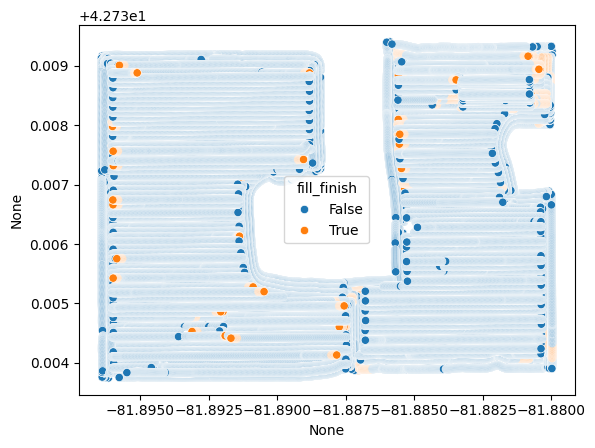

In [328]:
sns.scatterplot(x=so_flagged["geometry"].x,y = so_flagged["geometry"].y, hue = so_flagged["fill_finish"])

#### Short segment

In [329]:
so_flagged, so_filtered = apply_short_segment_filter(so_filtered,length=355,plot_=False)

In [330]:
so_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,short_segment,cum_distance
23,POINT (-81.88704 42.73404),EPSG:4326,2024-10-21,30.0,66.2280,20.7,2.4709,1.0,1.0,3.630596,False,3.630596
24,POINT (-81.88704 42.73405),EPSG:4326,2024-10-21,30.0,65.3098,20.7,2.4795,1.0,1.0,3.600798,False,7.231394
25,POINT (-81.88705 42.73406),EPSG:4326,2024-10-21,30.0,79.5439,20.7,2.4917,1.0,1.0,3.580007,False,10.811401
26,POINT (-81.88705 42.73407),EPSG:4326,2024-10-21,30.0,74.0508,20.5,2.4763,1.0,1.0,3.760069,False,14.571471
27,POINT (-81.88705 42.73408),EPSG:4326,2024-10-21,30.0,91.2890,20.0,2.7655,1.0,1.0,4.062960,False,18.634431


<Axes: xlabel='None', ylabel='None'>

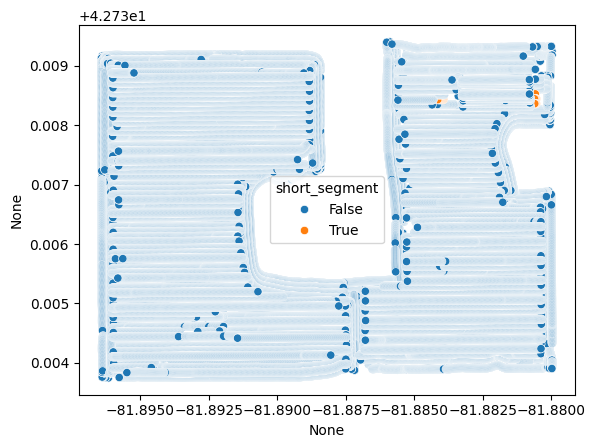

In [331]:
sns.scatterplot(x=so_flagged["geometry"].x,y = so_flagged["geometry"].y, hue = so_flagged["short_segment"])

#### Moisture filter

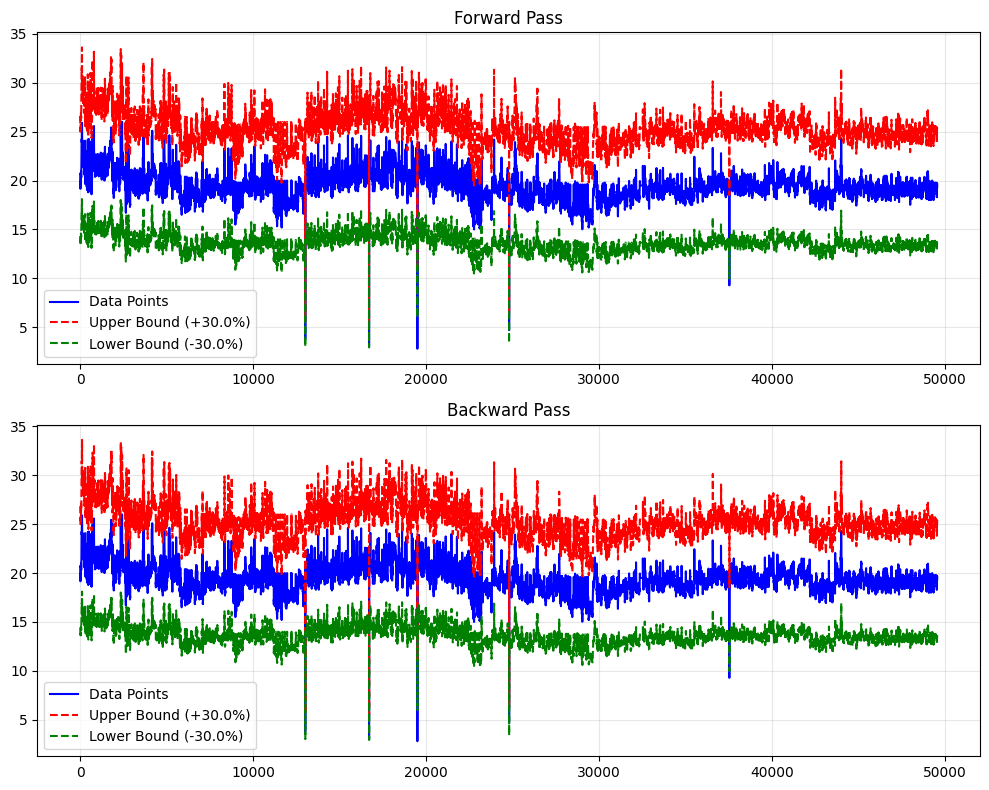

In [332]:
so_flagged, so_filtered = apply_forward_backward_filter(so_filtered,column = "moisture", plot=True)

In [333]:
so_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,fwd_bwd_moisture_outlier
23,POINT (-81.88704 42.73404),EPSG:4326,2024-10-21,30.0,66.2280,20.7,2.4709,1.0,1.0,3.630596,False
24,POINT (-81.88704 42.73405),EPSG:4326,2024-10-21,30.0,65.3098,20.7,2.4795,1.0,1.0,3.600798,False
25,POINT (-81.88705 42.73406),EPSG:4326,2024-10-21,30.0,79.5439,20.7,2.4917,1.0,1.0,3.580007,False
26,POINT (-81.88705 42.73407),EPSG:4326,2024-10-21,30.0,74.0508,20.5,2.4763,1.0,1.0,3.760069,False
27,POINT (-81.88705 42.73408),EPSG:4326,2024-10-21,30.0,91.2890,20.0,2.7655,1.0,1.0,4.062960,False


<Axes: xlabel='None', ylabel='None'>

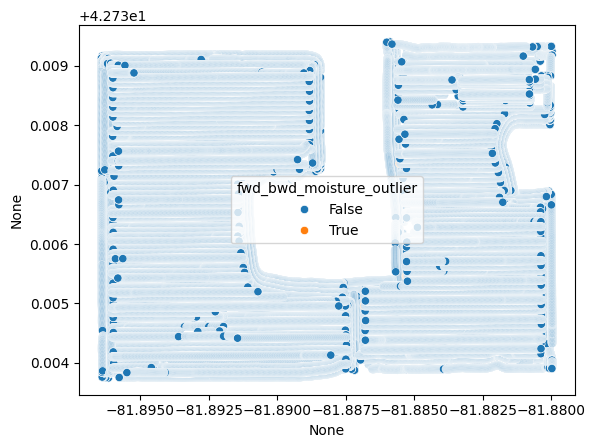

In [334]:
sns.scatterplot(x=so_flagged["geometry"].x,y = so_flagged["geometry"].y, hue = so_flagged["fwd_bwd_moisture_outlier"])

#### Speed filter

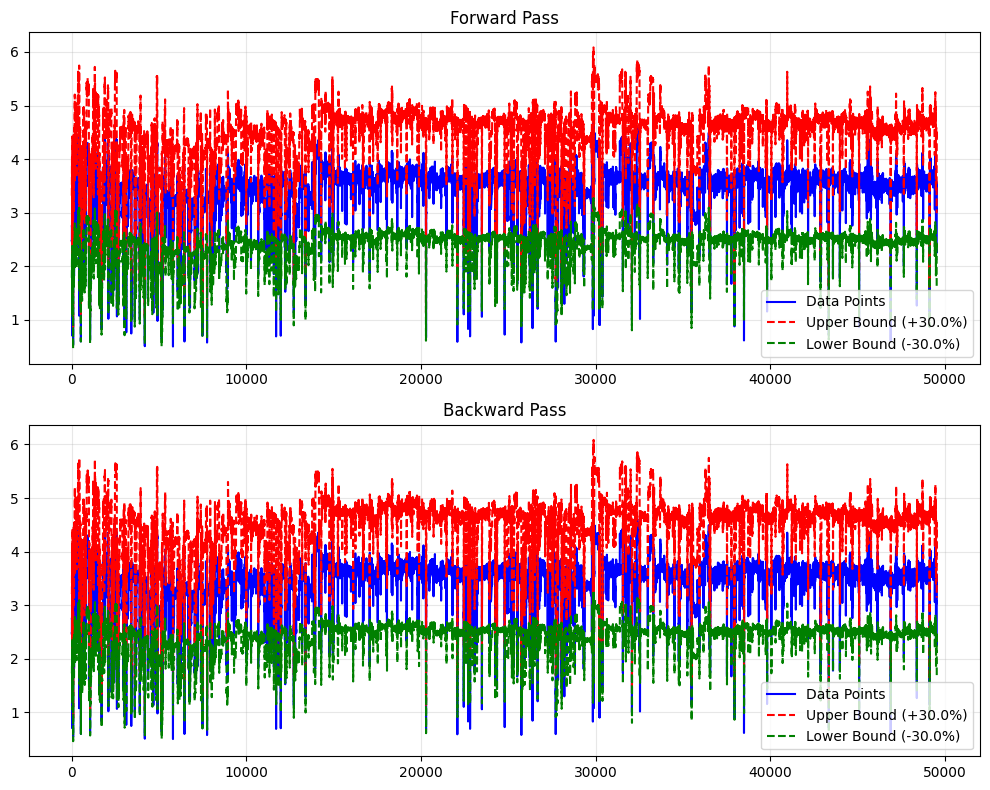

In [335]:
so_flagged, so_filtered = apply_forward_backward_filter(so_filtered,column = "speed", plot=True)

In [336]:
so_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,fwd_bwd_speed_outlier
23,POINT (-81.88704 42.73404),EPSG:4326,2024-10-21,30.0,66.2280,20.7,2.4709,1.0,1.0,3.630596,False
24,POINT (-81.88704 42.73405),EPSG:4326,2024-10-21,30.0,65.3098,20.7,2.4795,1.0,1.0,3.600798,False
25,POINT (-81.88705 42.73406),EPSG:4326,2024-10-21,30.0,79.5439,20.7,2.4917,1.0,1.0,3.580007,False
26,POINT (-81.88705 42.73407),EPSG:4326,2024-10-21,30.0,74.0508,20.5,2.4763,1.0,1.0,3.760069,False
27,POINT (-81.88705 42.73408),EPSG:4326,2024-10-21,30.0,91.2890,20.0,2.7655,1.0,1.0,4.062960,False


<Axes: xlabel='None', ylabel='None'>

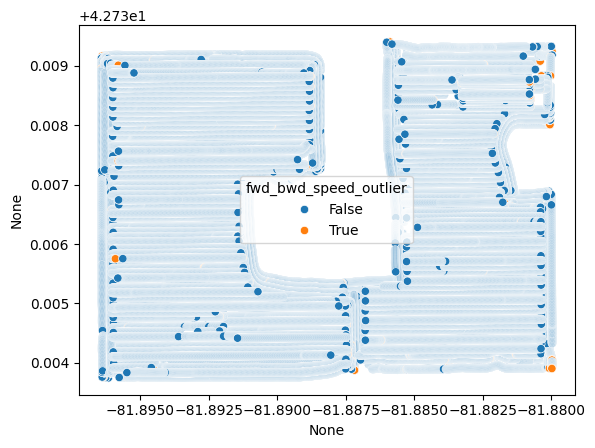

In [337]:
sns.scatterplot(x=so_flagged["geometry"].x,y = so_flagged["geometry"].y, hue = so_flagged["fwd_bwd_speed_outlier"])

#### Overlapping points

In [338]:
so_flagged, so_filtered = apply_overlapping_filter(so_filtered)

In [339]:
so_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,next_point,angle,next_swath_width,polygon,overlapped
23,POINT (-81.88704 42.73404),EPSG:4326,2024-10-21,30.0,66.2280,20.7,2.4709,1.0,1.0,3.630596,POINT (-81.8870431 42.7340528),-7.287348,30.0,"POLYGON ((-81.8871 42.73404, -81.88699 42.7340...",True
24,POINT (-81.88704 42.73405),EPSG:4326,2024-10-21,30.0,65.3098,20.7,2.4795,1.0,1.0,3.600798,POINT (-81.88704520000002 42.73406249999999),-9.067711,30.0,"POLYGON ((-81.8871 42.73405, -81.88699 42.7340...",True
25,POINT (-81.88705 42.73406),EPSG:4326,2024-10-21,30.0,79.5439,20.7,2.4917,1.0,1.0,3.580007,POINT (-81.8870473 42.734072699999984),-8.630075,30.0,"POLYGON ((-81.88699 42.73407, -81.8871 42.7340...",True
26,POINT (-81.88705 42.73407),EPSG:4326,2024-10-21,30.0,74.0508,20.5,2.4763,1.0,1.0,3.760069,POINT (-81.88704870000001 42.73408379999998),-5.311968,30.0,"POLYGON ((-81.88699 42.73408, -81.8871 42.7340...",True
27,POINT (-81.88705 42.73408),EPSG:4326,2024-10-21,30.0,91.2890,20.0,2.7655,1.0,1.0,4.062960,POINT (-81.88704960000001 42.73409479999998),-3.451605,30.0,"POLYGON ((-81.88699 42.73409, -81.8871 42.7340...",True


#### Yield filter

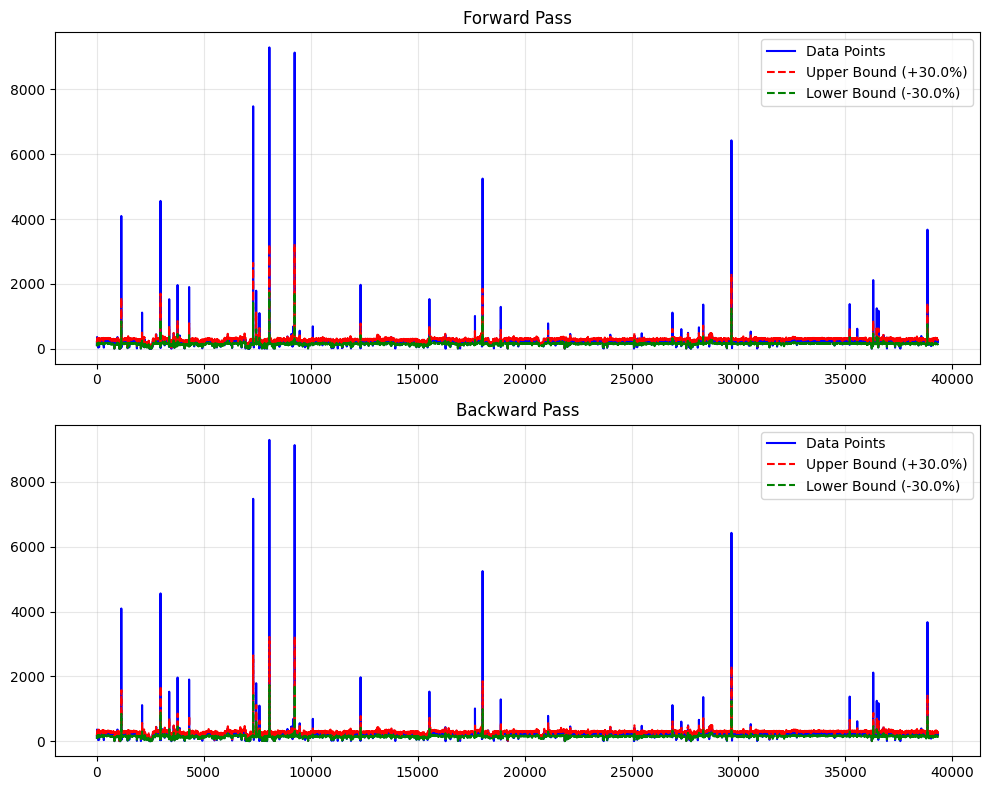

In [340]:
so_flagged, so_filtered = apply_forward_backward_filter(so_filtered,column = "yield", plot=True)

In [341]:
so_flagged.head()

,geometry,CRS,date,swath_width,yield,moisture,speed,duration,pass_number,distance,angle,polygon,fwd_bwd_yield_outlier
30,POINT (-81.88705 42.73412),EPSG:4326,2024-10-21,30.0,116.1970,19.8202,2.6836,1.0,1.0,4.013474,-1.535537,"POLYGON ((-81.887 42.73412, -81.88711 42.73411...",False
31,POINT (-81.88705 42.73413),EPSG:4326,2024-10-21,30.0,182.3270,19.6810,2.6787,1.0,1.0,4.010506,-3.125589,"POLYGON ((-81.887 42.73413, -81.88711 42.73413...",False
32,POINT (-81.88705 42.73414),EPSG:4326,2024-10-21,30.0,198.7668,19.5398,2.6875,1.0,1.0,3.942037,-1.884916,"POLYGON ((-81.887 42.73414, -81.88711 42.73414...",False
33,POINT (-81.88705 42.73415),EPSG:4326,2024-10-21,30.0,187.5608,19.4406,2.7316,1.0,1.0,4.084167,-3.273469,"POLYGON ((-81.887 42.73415, -81.88711 42.73415...",False
34,POINT (-81.88705 42.73416),EPSG:4326,2024-10-21,30.0,181.1195,19.3585,2.8651,1.0,1.0,4.234651,-1.919161,"POLYGON ((-81.887 42.73416, -81.88711 42.73416...",False


<Axes: xlabel='None', ylabel='None'>

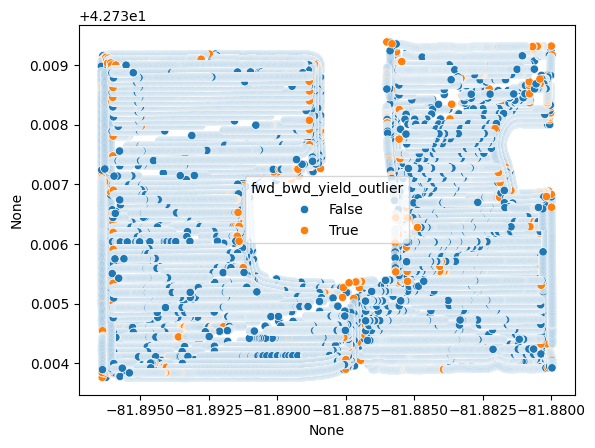

In [342]:
sns.scatterplot(x=so_flagged["geometry"].x,y = so_flagged["geometry"].y, hue = so_flagged["fwd_bwd_yield_outlier"])

#### Isolation forest

/var/folders/sr/72fkw_hj777b6plyb3n4ym8w0000gn/T/ipykernel_26470/2103818936.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  so_filtered.drop(columns=["isolation_forest_outlier"],inplace=True)


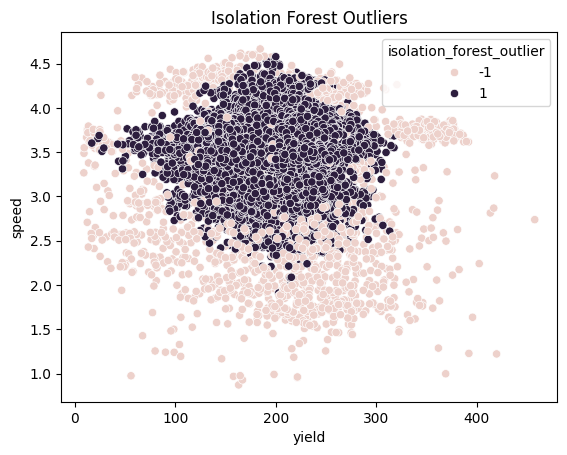

In [343]:
df_x = so_filtered[["yield","speed","swath_width","pass_number","distance"]]
isolation_forest_model.fit(df_x)
so_filtered["isolation_forest_outlier"] = isolation_forest_model.predict(df_x)
so_flagged = so_filtered.copy()
so_filtered = so_flagged[so_flagged["isolation_forest_outlier"] == 1]
so_filtered.drop(columns=["isolation_forest_outlier"],inplace=True)

#plot outliers of yield vs speed
sns.scatterplot(x = so_flagged["yield"], y = so_flagged["speed"],
                hue = so_flagged["isolation_forest_outlier"] )
plt.title("Isolation Forest Outliers")
plt.show()



#### Testing normal distribution

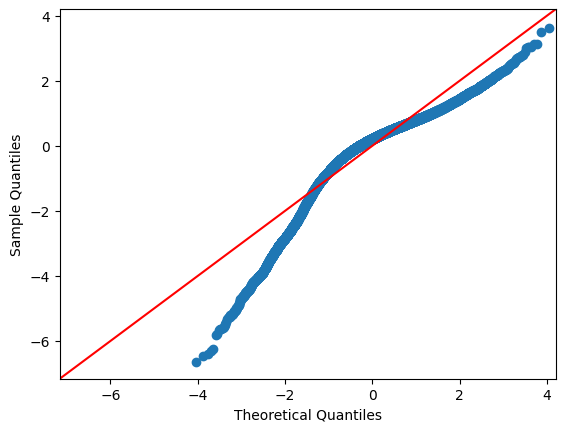

In [344]:
sm.qqplot(so_filtered['yield'], line='45',fit =True)
plt.show()


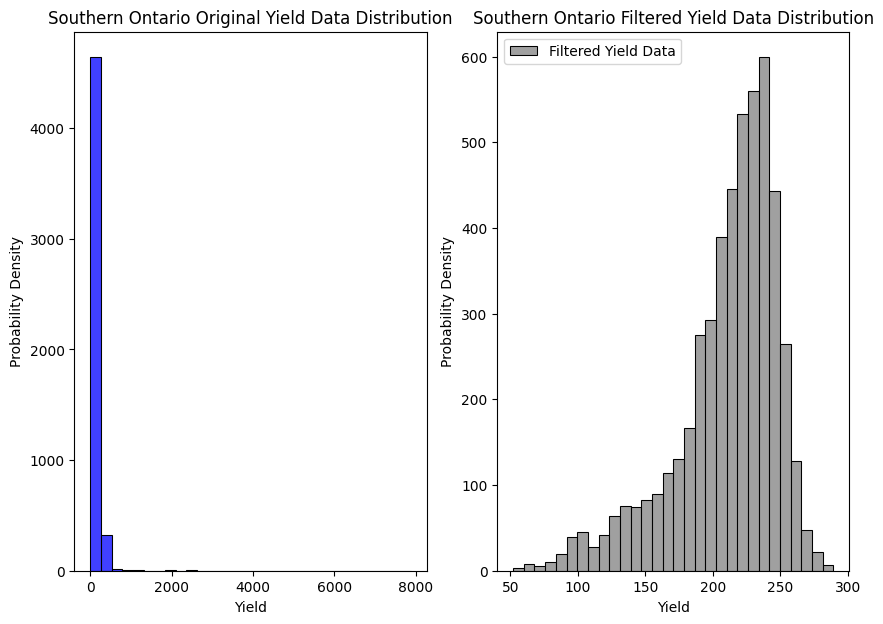

In [345]:
# Plot the yield data as a histogram

fig, ax = plt.subplots(ncols = 2, figsize = (10,7) )
sns.histplot(southern_ontario['yield'][:5000], bins=30,
             label='Original Yield Data', color= "blue", ax = ax[0])
sns.histplot(so_filtered['yield'][:5000], bins=30,
             label='Filtered Yield Data',color = "gray", ax = ax[1])





# Add labels and title
ax[0].set_xlabel('Yield')
ax[0].set_ylabel('Probability Density')
ax[0].set_title('Southern Ontario Original Yield Data Distribution')

ax[1].set_xlabel('Yield')
ax[1].set_ylabel('Probability Density')
ax[1].set_title('Southern Ontario Filtered Yield Data Distribution')



# Add a legend
plt.legend()


# Display the plot
plt.show()

#### Z-score

In [346]:
so_flagged, so_filtered = z_score_filter(so_filtered,column = "yield", threshold=3)

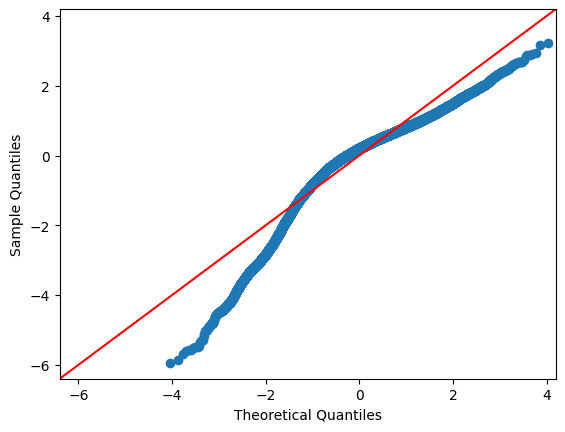

In [347]:
sm.qqplot(so_filtered['yield'], line='45',fit =True)
plt.show()

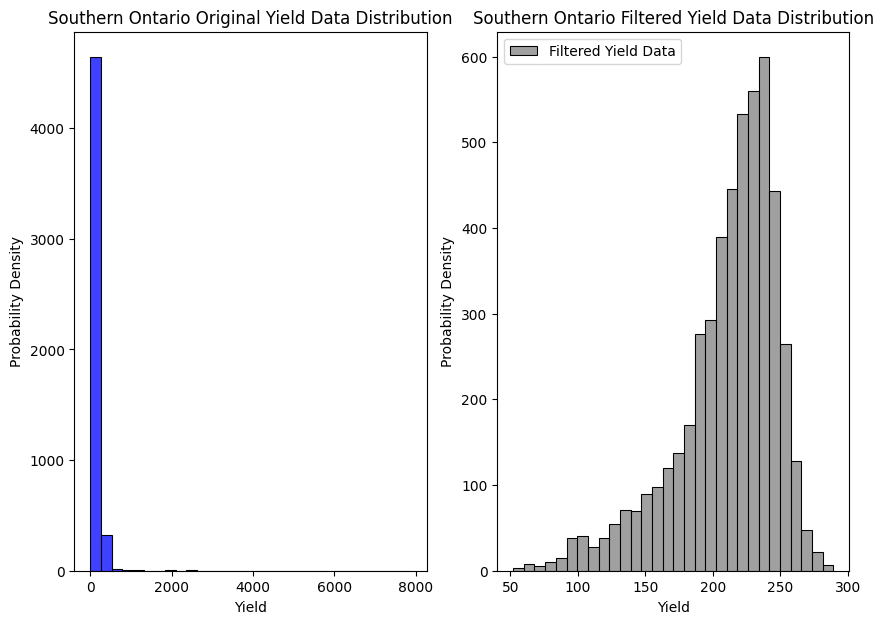

In [348]:
# Plot the yield data as a histogram

fig, ax = plt.subplots(ncols = 2, figsize = (10,7) )
sns.histplot(southern_ontario['yield'][:5000], bins=30,
             label='Original Yield Data', color= "blue", ax = ax[0])
sns.histplot(so_filtered['yield'][:5000], bins=30,
             label='Filtered Yield Data',color = "gray", ax = ax[1])





# Add labels and title
ax[0].set_xlabel('Yield')
ax[0].set_ylabel('Probability Density')
ax[0].set_title('Southern Ontario Original Yield Data Distribution')

ax[1].set_xlabel('Yield')
ax[1].set_ylabel('Probability Density')
ax[1].set_title('Southern Ontario Filtered Yield Data Distribution')



# Add a legend
plt.legend()


# Display the plot
plt.show()

#### Data size and exportation

In [349]:
print("Original data size : " + str(len(southern_ontario)))
print("Filtered data size : " + str(len(so_filtered)))

Original data size : 50787
Filtered data size : 36311


In [351]:
#Data exportation

southern_ontario_to_export =so_filtered[["geometry","yield","CRS"]]
southern_ontario_to_export.to_csv("data/filtered_data/southern_ontario.csv")
